In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math
import pandas as pd
#import uproot
import uproot3
from scipy import optimize as op

*Bin Conversions*
Available Functions:
Note: All functions return new arrays rather than altering the previous array
	New_Merged_Size(array_,merge_size_) returns what the size of the new merged array will be
	Merge_Bin_Edges(edges_,merge_size) merges the bin edges 
	Merge_Bins(array_,merge_size_) adds together every <merge_size_> values in an array
	Merge_Vals(yarray_,merge_size_) adds together every <merge_size_> ybin together in an array
	Merge_Bins(xarray_,merge_size_) averages every <merge_size_> xbins together in an array
	Count_Non_Zero(array_) counts the number of nonzero values in an array
	Count_Zero(array_) counts the number of zeros in an array
	Remove_Zeros(array_) remove zeros from an array
	Remove_Zeros_Y(yarray_) removes zero values from yarray
	Remove_Zeros_X(xarray_,yarray_) removes xbins where the corresponding y value was zero
	Count_InBounds(yarray_,low_,high_) counts the number of values that fall between bounds (or equal to)
	Count_OutBounds(yarray_,low_,high_) co

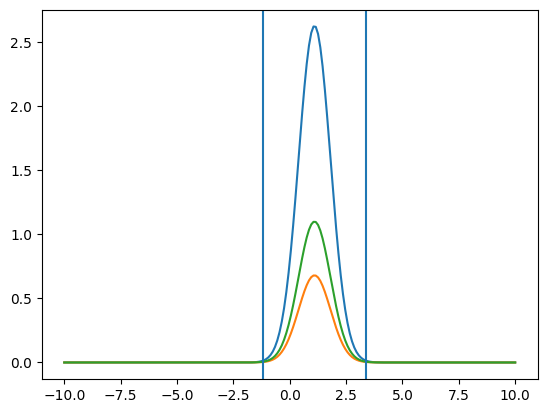

*Extracting Pieces for TH1*
Available Functions:
	Num_Xbins(TH1_) returns number of X bins for a TH1
	XEdges_1d(TH1_) returns edges of x bins for a TH1
	Center_Xbins(TH1_) returns center values for x bins for a TH1
	Values_1d(TH1_) returns the y values for a TH1
	Errors_1d(TH1_) returns the error values for TH1
	Errors2_1d(TH1_) returns the squared error values for TH1
Enjoy using TH1s

You have access to information regarding all bin numbers, bin maxes, bin mins
Each goes _VAR_max_ min, bins, res, etc. 
All the names of them as well as edges.
Q2_Bin_Name[ 5 ]
W_Bin_Name[ 29 ]
MM1_Bin_Name[ 14 ]
MM2_Bin_Name[ 14 ]
theta_Bin_Name[ 10 ]
alpha_Bin_Name[ 10 ]
phi_Bin_Name[ 10 ]
_var_set_name_ [i]
_Xij_name_[i][j]
Also _mm1_name_ etc. for all Xijs
def Q2_Corr(Q2bin_) corrects the cross section for simulation so far as Q2 is concerned
def Xij_Bin_Name(var_, Xij_, Xijbin_,Wbin_=0):
def Xij_Plot_Name(var_, Xij_, Xijbin_,Wbin_=0):
def Xij_Var_Name(var_, Xij_):


In [2]:
#Gain access to functions used to change some of the aspects regarding arrays and the things in them
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Bin\ Conversions.ipynb

#Gain Access to functions used to work with momentum binning
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Momentum\ Bins.ipynb

#Gain Access to functions used to work with Fitting Functions
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Fitting\ Functions.ipynb

#Gain Access to functions used for TH2s 
#uproot or uproo4
#%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/TH2\ Functions.ipynb
#uproot3
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/TH1\ Functions-uproot3.ipynb

#Gain Access to the proper binning for the the various variables
%run /Users/cmc/analysis_phd/fitting/single_diff/Friend\ Binning\ Values.ipynb

In [5]:
#date="06-13-2022"
#date="07-09-2024"
date="07-15-2024"
par="pro"
SLURM_ID="13866486"
top="m"+par
dir="/Users/cmc/analysis_phd/root_files/cut_determination/cut_det_e16/"+date
#root_file=dir+"/exp_mm_"+par+"_e16_"+date+"_"+SLURM_ID+".root"
root_file=dir+"/exp_e16_clas6_mm_"+par+"_"+date+".root"
file=uproot3.open(root_file)


color_order = ['b','g','r']
cut_names=['tight','mid','loose']
cut_sig = [2.5,3,3.5]
sign2 = [-1,1]

FileNotFoundError: [Errno 2] No such file or directory: '/Users/cmc/analysis_phd/root_files/cut_determination/cut_det_e16/07-15-2024/exp_e16_clas6_mm_pro_07-15-2024.root'

In [ ]:
Particle=''
if par == "pro":
    Particle = "Proton"
elif par == "pip":
    Particle = "\u03C0 +"
elif par == "pim":
    Particle = "\u03C0 -"

In [ ]:
#The Various layers of TDirectories to get to the histograms
layer0='MM'
layer1='MM_'+top
layer2=layer1+"_no-cut"
layer3=[layer2+"_sec"+str(i+1) for i in range(6)]
layer4=[layer3[i]+"_clean" for i in range(6)]
layer51=[layer4[i]+"_W_dep" for i in range(6)]
layer52=[layer4[i]+"_W_Range" for i in range(6)]
dir_loc=[([layer0+'/'+layer1+'/'+layer2+'/'+layer3[i]+'/'+layer4[i]+'/'+layer51[i]],[layer0+'/'+layer1+'/'+layer2+'/'+layer3[i]+'/'+layer4[i]+'/'+layer52[i]]) for i in range(6)]
names1=[["MM_"+top+"_no-cut_clean_sec"+str(i+1)+"_W:"+W_Bin_Name[j] for j in range(_W_bins_)] for i in range(6)]
names2=["MM_"+top+"_no-cut_clean_sec"+str(i+1)+"_W:in_range" for i in range(6)]
#Histogram Names
hist_name=[[[file[dir_loc[i][0][0]][names1[i][j]] for j in range(_W_bins_)],file[dir_loc[i][1][0]][names2[i]]] for i in range(6)]
           

In [ ]:
def fit_function(x_, bkgd_, n_, pars_):
    if bkgd_:
        gaus_pars = np.zeros(3)
        for i in range(3):
            gaus_pars[i] = pars_[i]
        poly_pars = np.zeros(n_+1)
        for i in range(n_+1):
            poly_pars[i] = pars_[i+3]
        return Gaus(x,*gaus_pars)+Poly(x,*poly_pars)
    else:
        return Gaus(x,*pars_)

In [ ]:
x_tmp = Center_Xbins(hist_name[0][1])
print(x_tmp[50])
print(x_tmp[90])


0.8958167767675626 0.9017876697543837
Breit-Wigner Peak [5.03028973e+02 9.48051804e-01 3.15459796e-02]
Gaus2 [3.73548280e+03 9.32222926e-01 4.43104033e-02]
Gaus3 [2.18161798e+03 1.51379397e+00 3.85374634e-01]


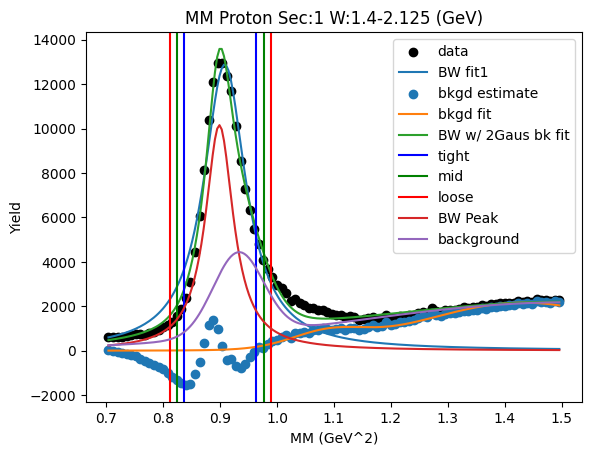

W bin: 0 1.400GeV-1.425GeV
Cut Bounds [[0.79737283 0.77718416 0.75725435]
 [1.01349721 1.03653341 1.05982848]]
Cut Bounds Err [[2.48886708e-05 2.94276432e-05 3.38486820e-05]
 [2.80596510e-05 3.39848350e-05 4.00441121e-05]]


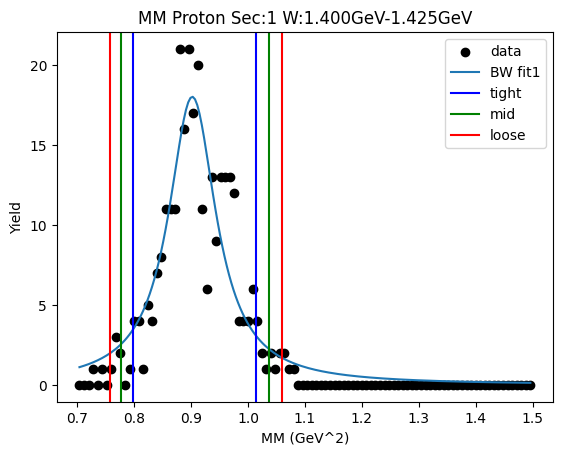

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.81926031 0.80008625 0.78113923]
 [1.02348814 1.04515964 1.06705819]]
Cut Bounds Err [[9.70231653e-06 1.14826470e-05 1.32207798e-05]
 [1.08444090e-05 1.31239609e-05 1.54520782e-05]]


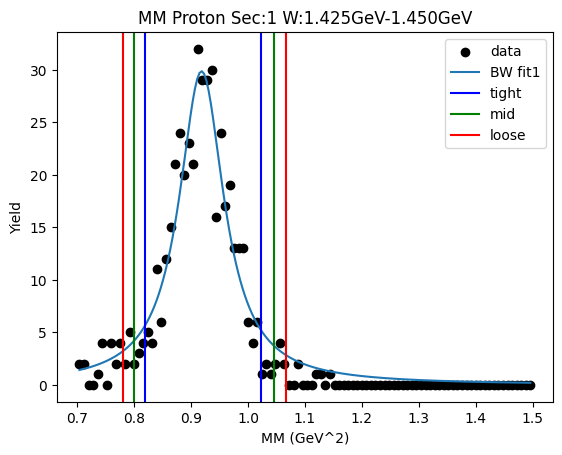

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.80553422 0.7837981  0.76235926]
 [1.03924598 1.06425221 1.08955572]]
Cut Bounds Err [[1.24009768e-05 1.46500584e-05 1.68362342e-05]
 [1.40855261e-05 1.70710224e-05 2.01275003e-05]]


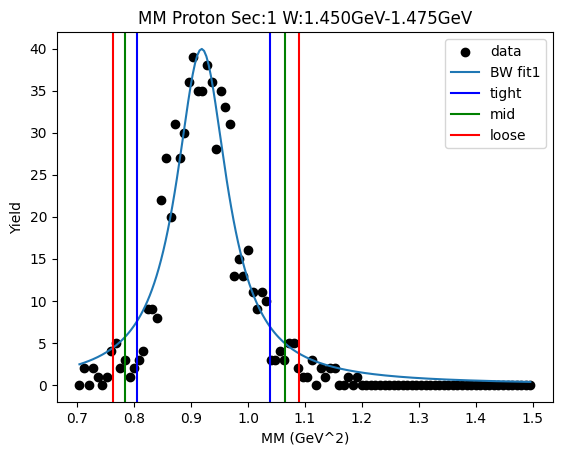

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.82346188 0.80348561 0.78375462]
 [1.03671531 1.05938972 1.08230942]]
Cut Bounds Err [[6.05736339e-06 7.16573728e-06 8.24672704e-06]
 [6.79659880e-06 8.22810278e-06 9.69097072e-06]]


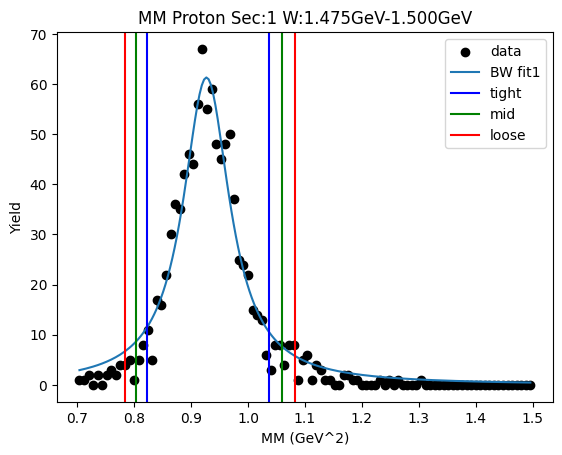

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.82513272 0.80553381 0.78617047]
 [1.03407801 1.05626815 1.07869387]]
Cut Bounds Err [[6.04891470e-06 7.15757146e-06 8.23950019e-06]
 [6.77161417e-06 8.19616887e-06 9.65142875e-06]]


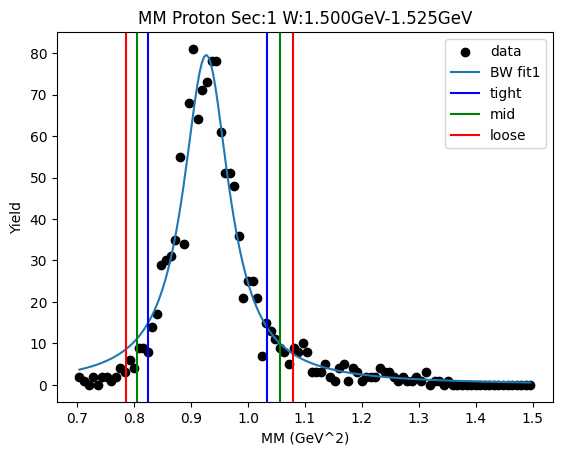

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.82281083 0.8027655  0.78296738]
 [1.03685962 1.05962406 1.08263569]]
Cut Bounds Err [[6.07101133e-06 7.18151037e-06 8.26443705e-06]
 [6.81508106e-06 8.25082443e-06 9.71812793e-06]]


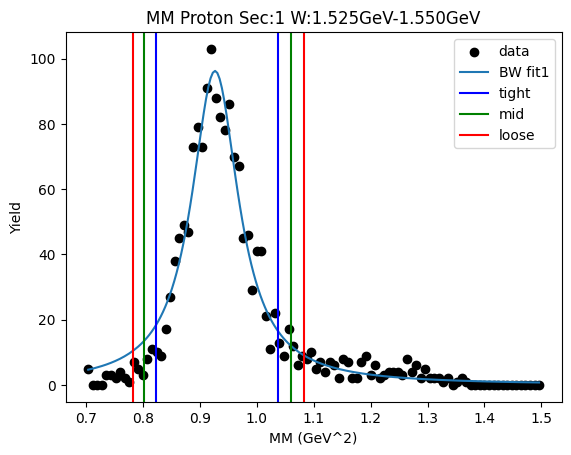

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.819611   0.7983284  0.77732577]
 [1.04783513 1.07219736 1.09683956]]
Cut Bounds Err [[7.58118774e-06 8.96065084e-06 1.03032287e-05]
 [8.57195416e-06 1.03845129e-05 1.22389274e-05]]


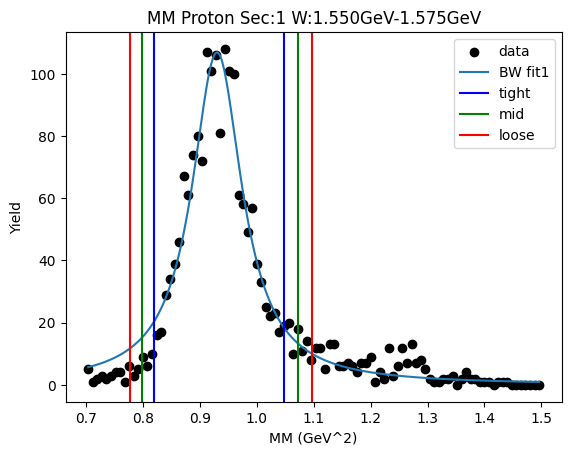

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.82191151 0.80188527 0.78210601]
 [1.03575857 1.05850174 1.08149189]]
Cut Bounds Err [[7.07973097e-06 8.37473385e-06 9.63757741e-06]
 [7.94755406e-06 9.62189657e-06 1.13330473e-05]]


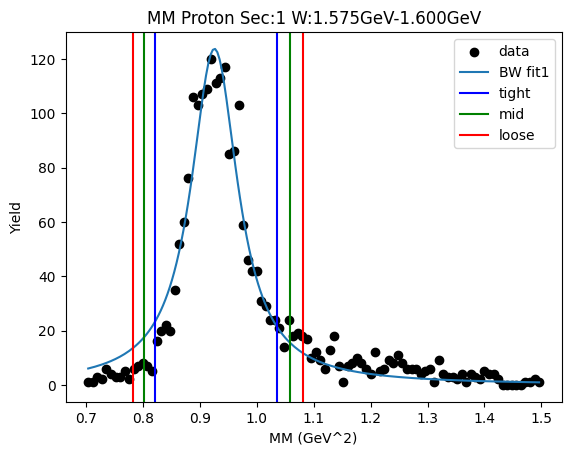

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.81505608 0.79451387 0.77423383]
 [1.03489825 1.05832447 1.08201287]]
Cut Bounds Err [[6.57790763e-06 7.77785360e-06 8.94680334e-06]
 [7.41212698e-06 8.97673576e-06 1.05766475e-05]]


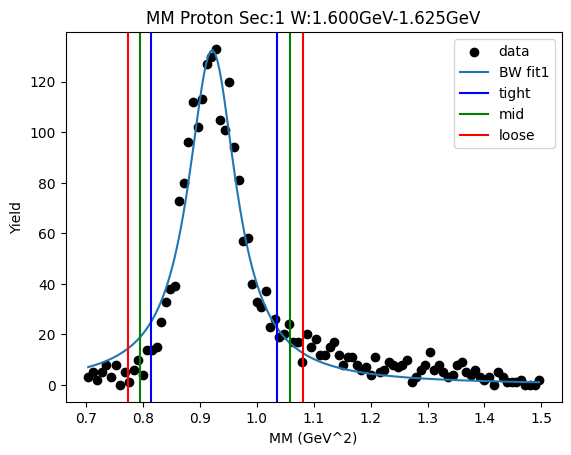

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.82123581 0.80255157 0.78408233]
 [1.01990314 1.04095237 1.06221659]]
Cut Bounds Err [[4.75207482e-06 5.62590992e-06 6.47970231e-06]
 [5.29576610e-06 6.40725086e-06 7.54189986e-06]]


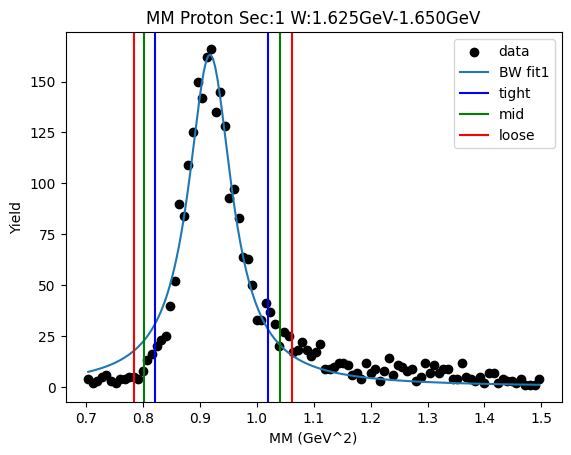

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.81595946 0.79659347 0.77746007]
 [1.02241146 1.04433588 1.06649288]]
Cut Bounds Err [[4.49202353e-06 5.31541397e-06 6.11896727e-06]
 [5.02829313e-06 6.08609632e-06 7.16668084e-06]]


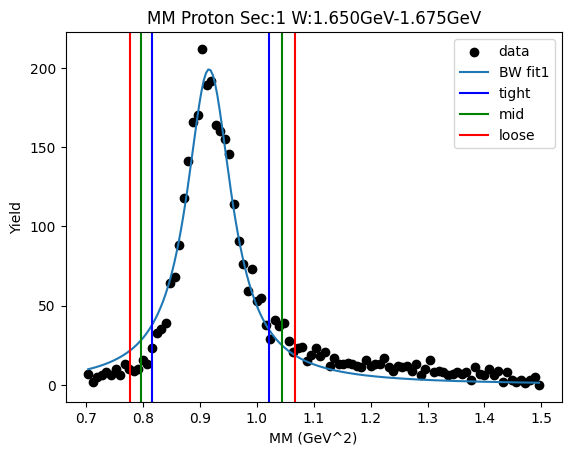

W bin: 11 1.675GeV-1.700GeV
background fit [1.70501854e+01 1.07165514e+00 1.38346188e-02 9.73536769e+00
 1.29919366e+00 1.39449199e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9090726983035408 0.9217418271071097
Breit-Wigner Peak [17.44863538  0.95676918  0.04595129]
Gaus2 [1.66402368e+01 1.07096152e+00 1.37273891e-02]
Gaus3 [9.73916002 1.27811597 0.16753189]
Cut Bounds [[0.82425485 0.80659789 0.78913211]
 [1.01133903 1.03109891 1.05104996]]
Cut Bounds Err [[3.64610386e-06 4.32307517e-06 4.98510836e-06]
 [4.03874714e-06 4.88781105e-06 5.75322588e-06]]


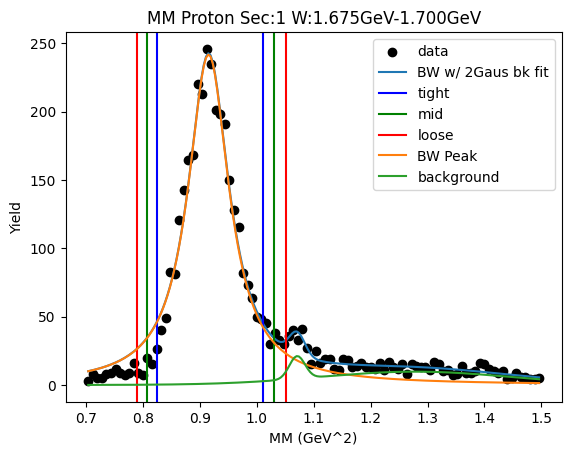

W bin: 12 1.700GeV-1.725GeV
background fit [ 6.89943777  1.08011529  0.03832999 12.38875196  1.32364542  0.15217353]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
Runtime Error2.1
	Just skip it for now
Cut Bounds [[0.82765915 0.81066208 0.79384136]
 [1.00732869 1.02626554 1.04537873]]
Cut Bounds Err [[3.44830056e-06 4.09315696e-06 4.72408901e-06]
 [3.80421414e-06 4.60541044e-06 5.42110775e-06]]


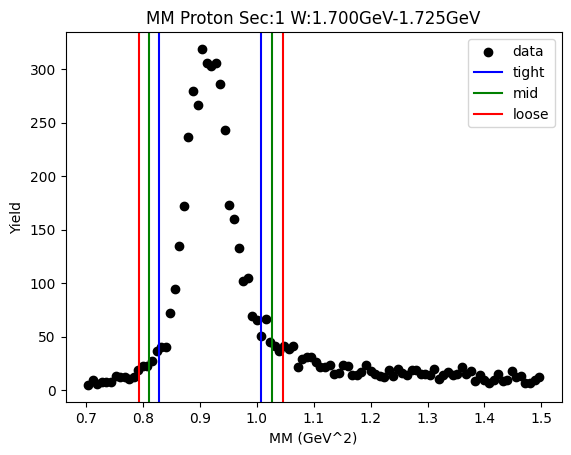

W bin: 13 1.725GeV-1.750GeV
background fit [ 7.73433863  0.94        0.71511319 12.8274622   1.37044214  0.12123164]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9046590961302293 0.9121231809122327
Breit-Wigner Peak [15.41294022  0.95309556  0.03527058]
Gaus2 [21.28295233  1.28666438  0.22294279]
Gaus3 [1.21598336e+02 9.40000000e-01 4.06318090e-02]
Cut Bounds [[0.83827512 0.82458981 0.81101714]
 [0.98132294 0.9962472  1.01128408]]
Cut Bounds Err [[5.90983981e-06 7.01044042e-06 8.09499956e-06]
 [6.39423210e-06 7.70566059e-06 9.03937493e-06]]


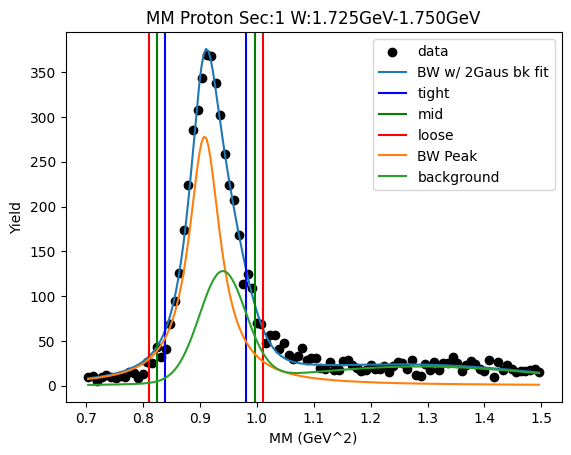

W bin: 14 1.750GeV-1.775GeV
background fit [2.20212569e+01 1.47193170e+00 3.01924927e-01 1.25219736e-01
 9.40000000e-01 6.04505134e-04]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9147914905999248 0.9265712414431124
Breit-Wigner Peak [25.11873138  0.95952143  0.04430905]
Gaus2 [22.1742916   1.40663853  0.2497088 ]
Gaus3 [9.40001216e+04 9.40000000e-01 3.67206489e-04]
Cut Bounds [[0.83244482 0.81533077 0.79839448]
 [1.01336176 1.0324311  1.0516782 ]]
Cut Bounds Err [[4.41917211e-06 5.24489898e-06 6.05285468e-06]
 [4.87579508e-06 5.90202101e-06 6.94692996e-06]]


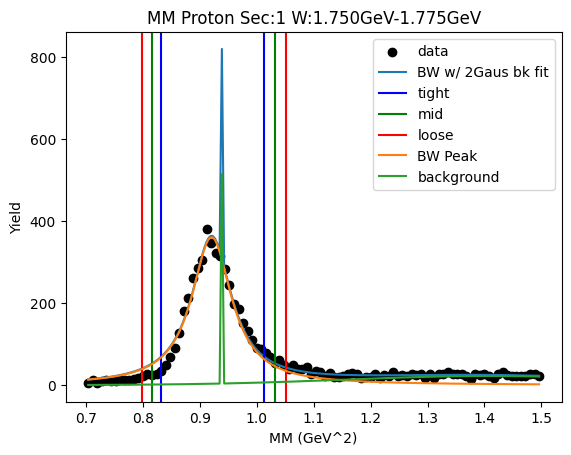

W bin: 15 1.775GeV-1.800GeV
Runtime Error2.2
	Just skip it for now
Cut Bounds [[0.82528095 0.80696311 0.78885086]
 [1.01976608 1.04034527 1.06113004]]
Cut Bounds Err [[8.24974671e-06 9.76947205e-06 1.12553280e-05]
 [9.17043603e-06 1.10925910e-05 1.30540421e-05]]


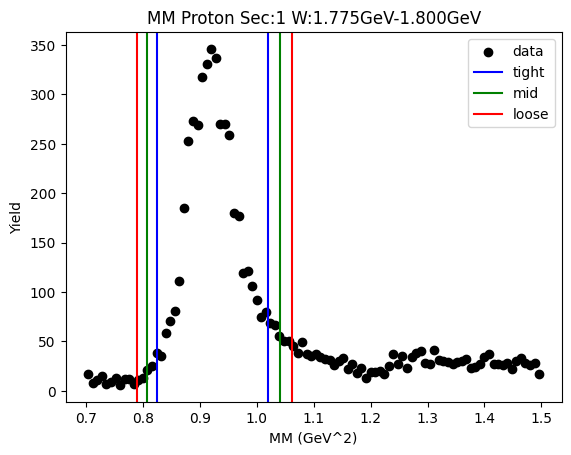

W bin: 16 1.800GeV-1.825GeV
background fit [17.74831661  1.07208217  0.04933784 31.74066035  1.40625803  0.18094406]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
Runtime Error2.1
	Just skip it for now
Cut Bounds [[0.82046806 0.80233928 0.78441303]
 [1.01289485 1.03325143 1.05381053]]
Cut Bounds Err [[1.04676743e-05 1.24153475e-05 1.43174550e-05]
 [1.16305845e-05 1.40890873e-05 1.65949021e-05]]


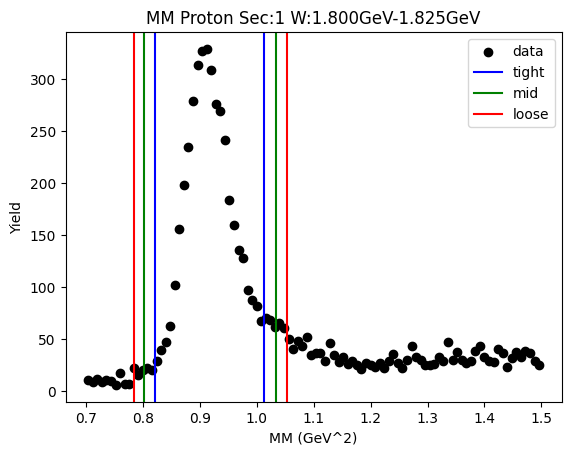

W bin: 17 1.825GeV-1.850GeV
background fit [15.26235569  1.0810093   0.0423406  33.80139236  1.4039861   0.20200038]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9078436960341648 0.9172714316671381
Breit-Wigner Peak [21.11264628  0.95527879  0.03963949]
Gaus2 [27.75399862  1.00745278  0.07947551]
Gaus3 [34.75365936  1.39121514  0.20258684]
Cut Bounds [[0.83376826 0.81843719 0.80324838]
 [0.99490343 1.01179939 1.02883761]]
Cut Bounds Err [[1.38837696e-05 1.65044210e-05 1.90741039e-05]
 [1.51661443e-05 1.83507924e-05 2.15870169e-05]]


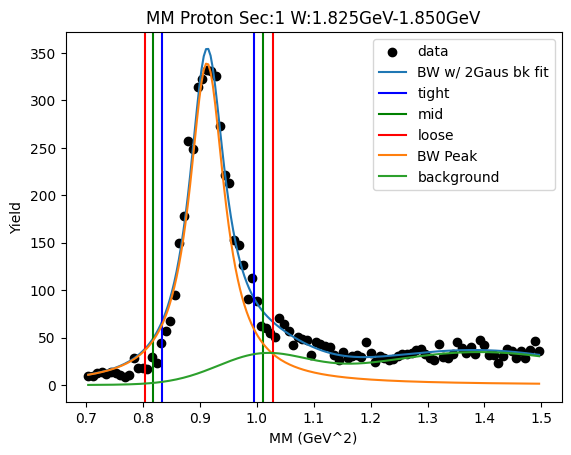

W bin: 18 1.850GeV-1.875GeV
background fit [1.62449928e+01 1.06420689e+00 3.41067206e-02 3.80337346e+01
 1.38232547e+00 1.71831858e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9052787962568266 0.9145809026998454
Breit-Wigner Peak [21.08635665  0.95390243  0.0393745 ]
Gaus2 [34.28230094  0.97626654  0.06736897]
Gaus3 [38.44676896  1.37502212  0.19704227]
Cut Bounds [[0.83177076 0.81656004 0.80148968]
 [0.99159811 1.00835287 1.02524799]]
Cut Bounds Err [[1.75317096e-05 2.08419363e-05 2.40881677e-05]
 [1.91421313e-05 2.31606249e-05 2.72438989e-05]]


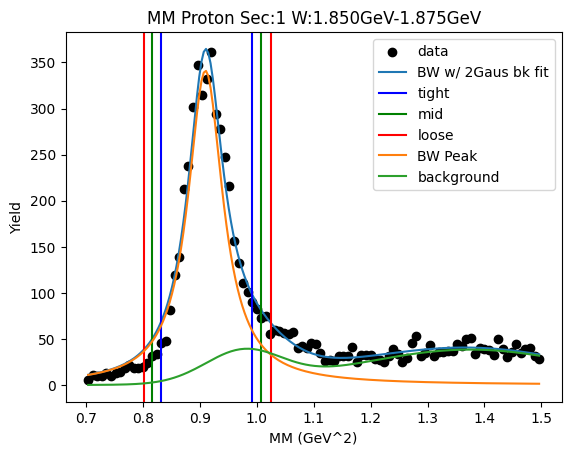

W bin: 19 1.875GeV-1.900GeV
background fit [8.40077908e+00 1.07051788e+00 2.97395351e-02 3.93426140e+01
 1.36651582e+00 1.95025570e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9002122216551443 0.9077918419949913
Breit-Wigner Peak [18.11841052  0.95079021  0.03554251]
Gaus2 [8.59455410e+01 9.40000000e-01 4.02174655e-02]
Gaus3 [40.63882958  1.33260651  0.23965966]
Cut Bounds [[0.83353071 0.81977958 0.80614281]
 [0.97733272 0.99234198 1.00746562]]
Cut Bounds Err [[4.72599658e-06 5.60063841e-06 6.46299740e-06]
 [5.11745248e-06 6.16197128e-06 7.22508741e-06]]


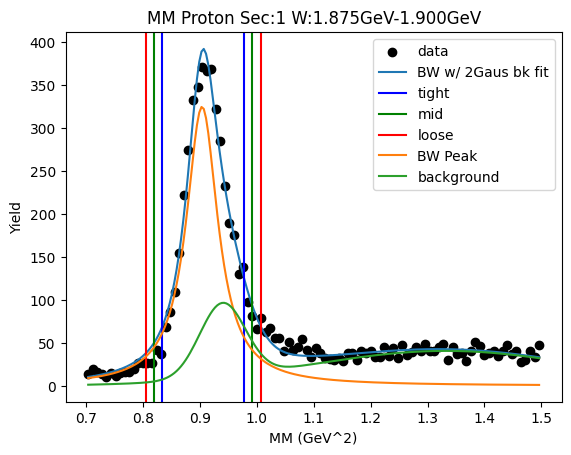

W bin: 20 1.900GeV-1.925GeV
background fit [3.91057579e-06 2.81635525e+05 4.69137073e+04 4.27475730e+01
 1.40229075e+00 2.57310872e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9052022473975022 0.9137291880763779
Breit-Wigner Peak [24.91113164  0.95365912  0.03769823]
Gaus2 [5.37945043e-03 7.89279580e+05 1.65470405e+03]
Gaus3 [43.51542641  1.36279241  0.24724254]
Cut Bounds [[0.83458204 0.81999131 0.80552925]
 [0.98756614 1.00357223 1.019707  ]]
Cut Bounds Err [[3.41630922e-06 4.06095928e-06 4.69399385e-06]
 [3.71625710e-06 4.49260595e-06 5.28128443e-06]]


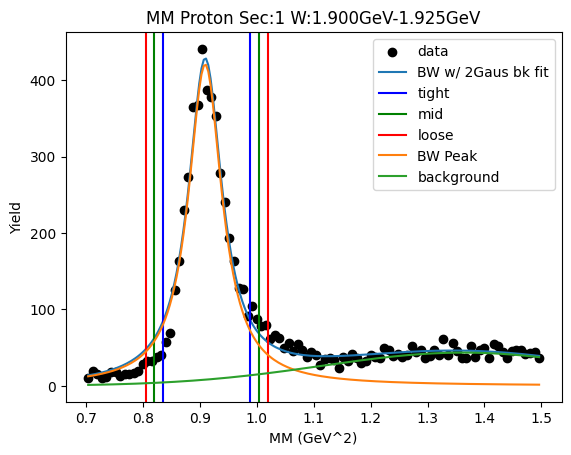

W bin: 21 1.925GeV-1.950GeV
background fit [4.51745297e+00 1.91026351e+06 1.56256436e+05 4.91080376e+01
 1.47844418e+00 2.75865935e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9042880000231165 0.9133403857081327
Breit-Wigner Peak [25.32330417  0.95331747  0.03884239]
Gaus2 [3611018.58571025 4720024.56857667  127095.53698549]
Gaus3 [48.01263267  1.43881537  0.26848581]
Cut Bounds [[0.8317363  0.81673052 0.80186134]
 [0.98930705 1.00581541 1.02246038]]
Cut Bounds Err [[3.77832831e-06 4.48978278e-06 5.18799991e-06]
 [4.12071344e-06 4.98247445e-06 5.85832643e-06]]


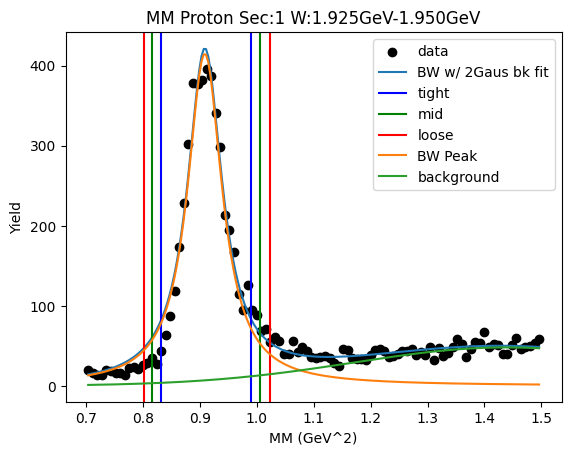

W bin: 22 1.950GeV-1.975GeV
background fit [3.61101859e+06 3.32034638e+06 8.25939852e+04 4.70880994e+01
 1.47967070e+00 3.18467760e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9035054380452561 0.9125121141812866
Breit-Wigner Peak [25.72545586  0.95289494  0.0387442 ]
Gaus2 [3773998.58863437 2751711.99264418  113051.46268856]
Gaus3 [46.55646399  1.38521893  0.26326958]
Cut Bounds [[0.83115626 0.81619348 0.80136661]
 [0.98825902 1.00471679 1.02131047]]
Cut Bounds Err [[4.93169791e-06 5.86110496e-06 6.77317651e-06]
 [5.37762506e-06 6.50286544e-06 7.64637625e-06]]


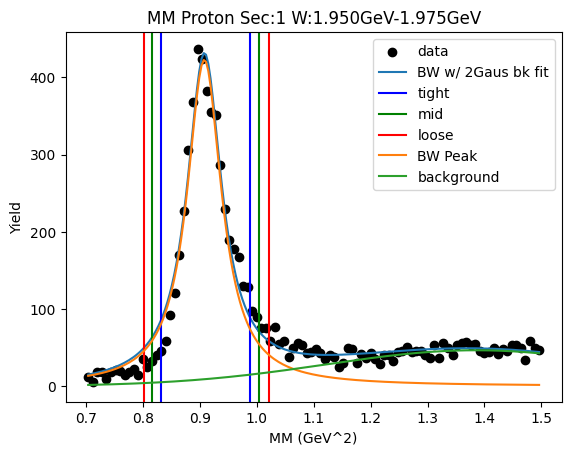

W bin: 23 1.975GeV-2.000GeV
background fit [8.76286946e+04 1.33910054e+06 9.19571968e+04 5.64194105e+01
 1.56203965e+00 3.41493564e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9025708546377853 0.9110024477958119
Breit-Wigner Peak [24.87632908  0.95225346  0.03748687]
Gaus2 [ 192194.04364809 1336011.2268961   185475.36299325]
Gaus3 [52.07084913  1.45122711  0.29259776]
Cut Bounds [[0.83242597 0.81793552 0.80357231]
 [0.98432811 1.00021809 1.01623531]]
Cut Bounds Err [[4.01793524e-06 4.77654822e-06 5.52152383e-06]
 [4.36918130e-06 5.28204363e-06 6.20931381e-06]]


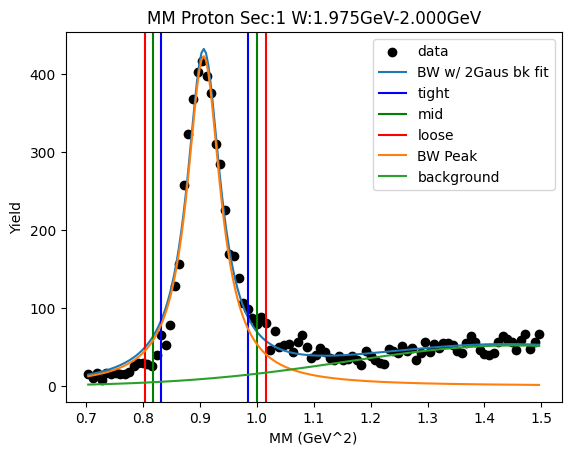

W bin: 24 2.000GeV-2.025GeV
background fit [7.53349741e+00 1.76123852e+06 2.20462999e+05 5.98635125e+01
 1.57270553e+00 3.50791821e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9026094025815149 0.9108361986405346
Breit-Wigner Peak [24.83609334  0.95221993  0.03702881]
Gaus2 [4951876.89576764 2905399.12745805  130420.63735002]
Gaus3 [53.48840113  1.44510336  0.29584193]
Cut Bounds [[0.8332542  0.8189329  0.80473574]
 [0.98329492 0.99898176 1.01479275]]
Cut Bounds Err [[4.11042932e-06 4.88714054e-06 5.65006992e-06]
 [4.46519394e-06 5.39770878e-06 6.34476959e-06]]


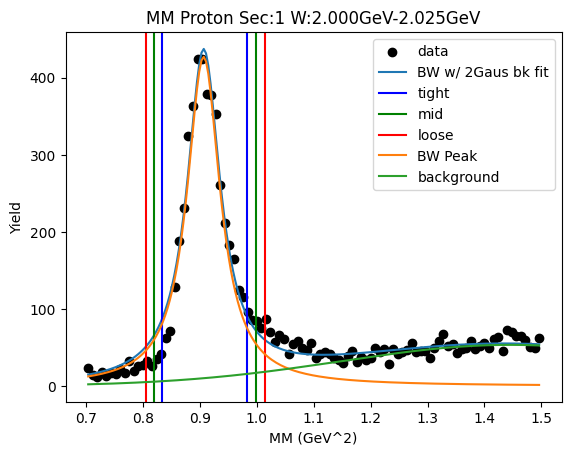

W bin: 25 2.025GeV-2.050GeV
background fit [4.95187690e+06 1.34216381e+07 3.67881364e+05 5.58168470e+01
 1.51748276e+00 3.17552315e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9016651733193495 0.9096131205643714
Breit-Wigner Peak [23.8675068   0.95165075  0.03639585]
Gaus2 [39931699.35576185  7616302.8315459    380399.88135234]
Gaus3 [53.45285559  1.43600721  0.28101442]
Cut Bounds [[0.8334444  0.81936525 0.80540603]
 [0.98083222 0.99623063 1.01174897]]
Cut Bounds Err [[3.45245716e-06 4.10514693e-06 4.74650975e-06]
 [3.74530632e-06 4.52657668e-06 5.31989825e-06]]


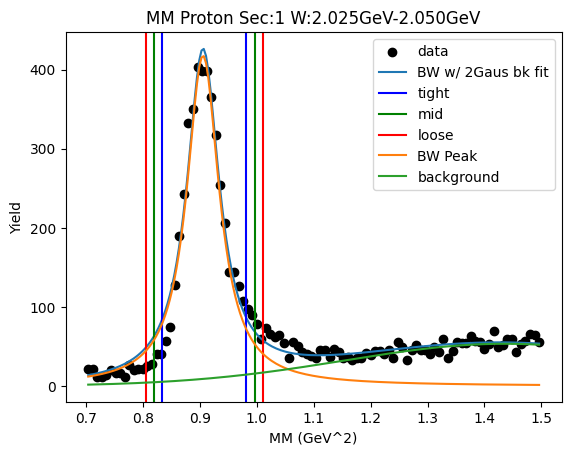

W bin: 26 2.050GeV-2.075GeV
background fit [4.12443881e+07 2.69180318e+08 1.87249702e+07 1.18890790e+02
 2.15771101e+00 5.80532693e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9015330202089822 0.9094508666713181
Breit-Wigner Peak [24.53816331  0.9515734   0.03632686]
Gaus2 [2.94575265e+08 3.69209679e+08 6.31849072e+05]
Gaus3 [92.28140475  1.92630743  0.49810219]
Cut Bounds [[0.83343717 0.81938466 0.80545162]
 [0.98053368 0.99590046 1.01138672]]
Cut Bounds Err [[3.58301064e-06 4.26074503e-06 4.92670432e-06]
 [3.88635905e-06 4.69731407e-06 5.52071583e-06]]


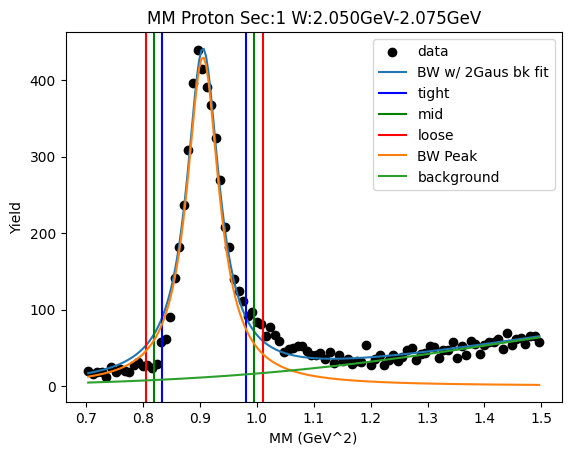

W bin: 27 2.075GeV-2.100GeV
background fit [2.94575265e+08 2.43435350e+08 1.06031402e+07 7.59296450e+01
 1.78230192e+00 4.61251833e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8998634217981656 0.9070563098474675
Breit-Wigner Peak [22.72656308  0.95050506  0.0346239 ]
Gaus2 [2.33058120e+06 2.59920434e+08 2.42229567e+05]
Gaus3 [58.37721039  1.52011982  0.34776075]
Cut Bounds [[0.83479491 0.82138754 0.80808871]
 [0.9748383  0.9894396  1.00414944]]
Cut Bounds Err [[2.88140424e-06 3.42781516e-06 3.96522137e-06]
 [3.11372738e-06 3.76216626e-06 4.42015089e-06]]


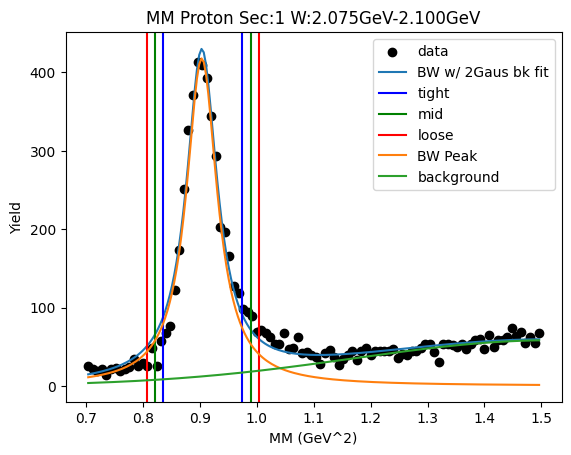

W bin: 28 2.100GeV-2.125GeV
background fit [2.33058120e+06 1.22516341e+09 3.24531667e+07 1.50243507e+02
 2.35790064e+00 6.73937946e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8991282727776242 0.9065957081404463
Breit-Wigner Peak [22.58873803  0.9501905   0.0352785 ]
Gaus2 [1.21216809e+09 1.39189102e+09 1.35306739e+08]
Gaus3 [70.8660986   1.68535996  0.43104596]
Cut Bounds [[0.83294861 0.81930398 0.80577203]
 [0.97559242 0.99047655 1.00547337]]
Cut Bounds Err [[4.01727851e-06 4.77831372e-06 5.52653531e-06]
 [4.34767475e-06 5.25380837e-06 6.17350978e-06]]


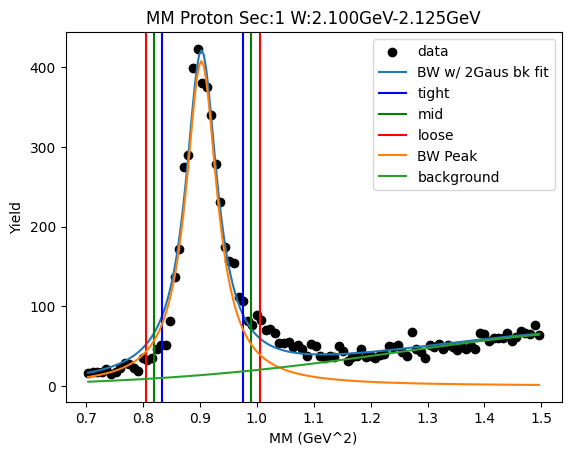

0.8856977779100814 0.8917652654489165
Breit-Wigner Peak [5.13706263e+02 9.42725581e-01 3.18001246e-02]
Gaus2 [8.08794511e+02 9.79525044e-01 6.85732219e-02]
Gaus3 [1.66969666e+03 1.48349088e+00 3.01660071e-01]


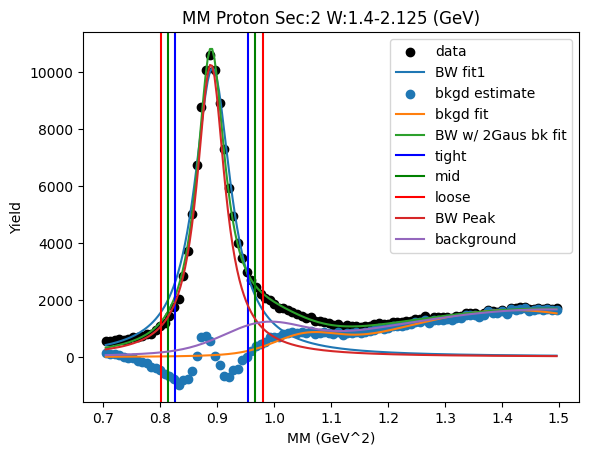

W bin: 0 1.400GeV-1.425GeV
Cut Bounds [[0.80812726 0.79408256 0.78016098]
 [0.95534561 0.97074459 0.98626667]]
Cut Bounds Err [[8.56917603e-06 1.01725569e-05 1.17490286e-05]
 [9.31707180e-06 1.12473391e-05 1.32101280e-05]]


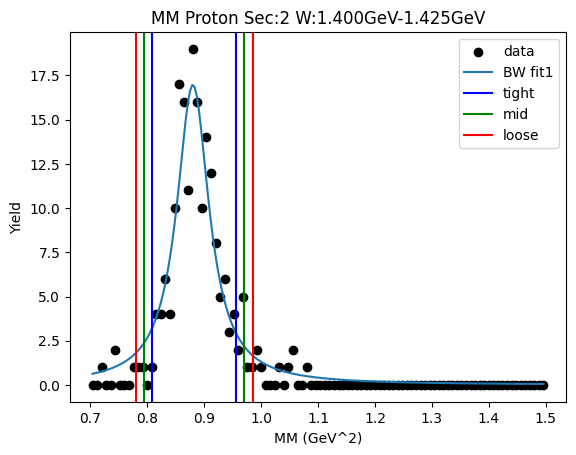

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.823024   0.80827818 0.79366564]
 [0.97781351 0.99402558 1.01037095]]
Cut Bounds Err [[6.40379105e-06 7.59988414e-06 8.77518707e-06]
 [6.98005619e-06 8.42801551e-06 9.90097626e-06]]


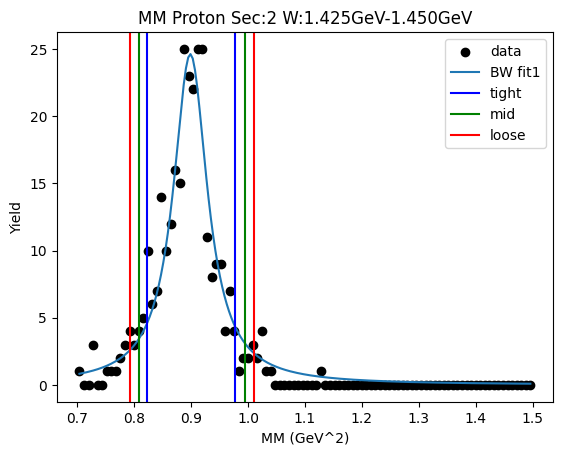

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.80749548 0.79147585 0.77561672]
 [0.97651927 0.9943044  1.01225003]]
Cut Bounds Err [[8.83432121e-06 1.04743273e-05 1.20822304e-05]
 [9.71501655e-06 1.17399700e-05 1.38028075e-05]]


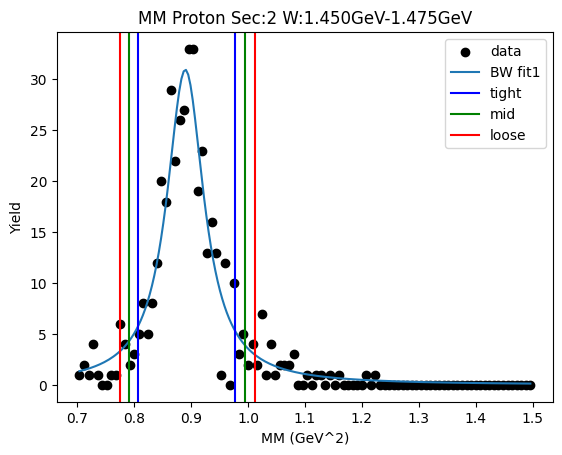

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.81404026 0.79820564 0.78252655]
 [0.98094022 0.99848559 1.01618648]]
Cut Bounds Err [[5.35653829e-06 6.35213812e-06 7.32869311e-06]
 [5.88007061e-06 7.10449866e-06 8.35148495e-06]]


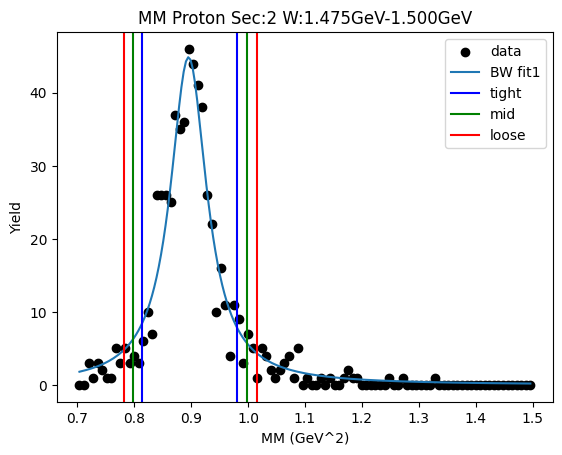

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.81078765 0.79491049 0.77919033]
 [0.97819413 0.99579826 1.01355939]]
Cut Bounds Err [[4.31165814e-06 5.11272450e-06 5.89834641e-06]
 [4.73590827e-06 5.72240983e-06 6.72718079e-06]]


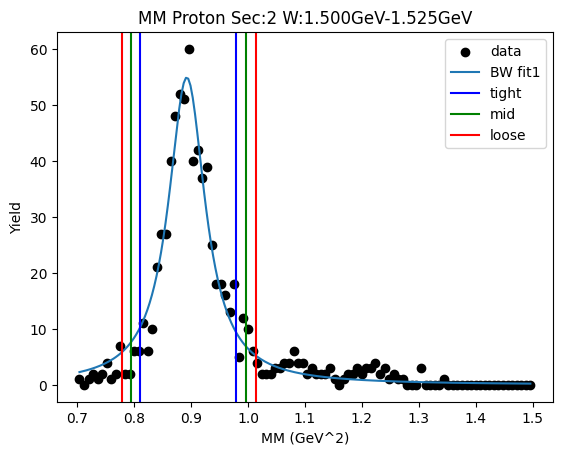

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.81479502 0.79919075 0.78373734]
 [0.97913551 0.99639934 1.01381403]]
Cut Bounds Err [[5.85030813e-06 6.93873244e-06 8.00671000e-06]
 [6.41321735e-06 7.74767925e-06 9.10642631e-06]]


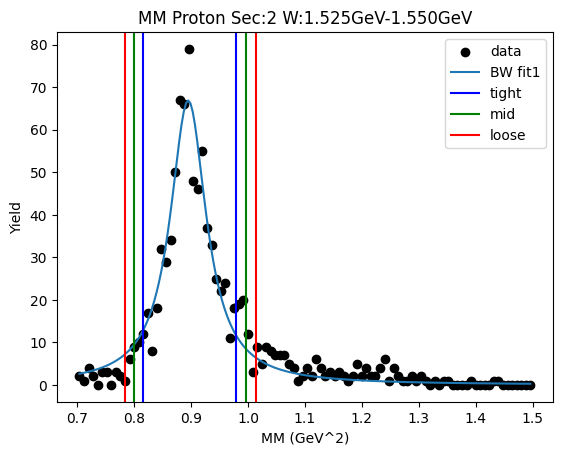

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.81538781 0.79941394 0.78359809]
 [0.98381762 1.00152971 1.01939982]]
Cut Bounds Err [[3.58537781e-06 4.25147752e-06 4.90473038e-06]
 [3.93831198e-06 4.75867392e-06 5.59423532e-06]]


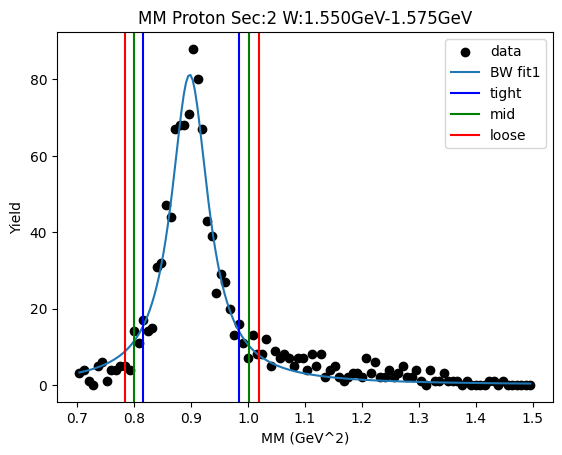

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.81665191 0.80203828 0.78755659]
 [0.97004462 0.98610953 1.00230638]]
Cut Bounds Err [[3.87267679e-06 4.59607777e-06 5.30692087e-06]
 [4.22074018e-06 5.09626966e-06 5.98689961e-06]]


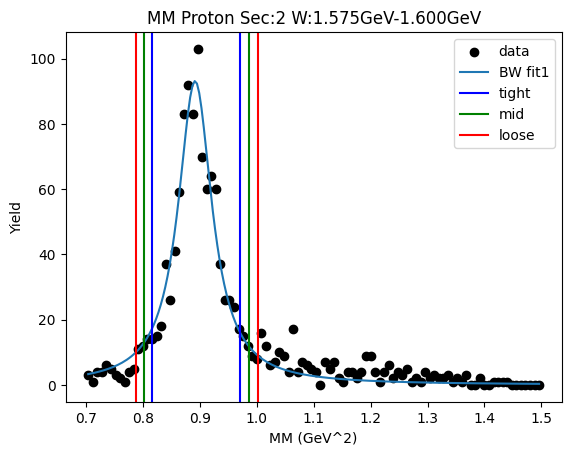

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.80992416 0.79432301 0.77887358]
 [0.97428045 0.99155056 1.00897239]]
Cut Bounds Err [[3.94827550e-06 4.68258707e-06 5.40300905e-06]
 [4.33039255e-06 5.23172277e-06 6.14952893e-06]]


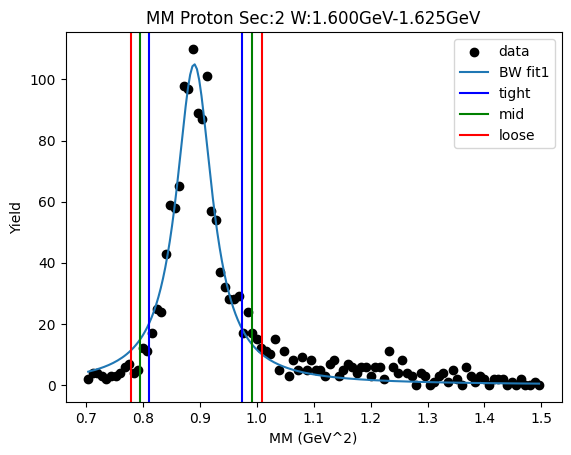

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.80916758 0.79339693 0.77778148]
 [0.97541011 0.99288797 1.01052103]]
Cut Bounds Err [[2.97109098e-06 3.52326059e-06 4.06484225e-06]
 [3.26204795e-06 3.94139202e-06 4.63326963e-06]]


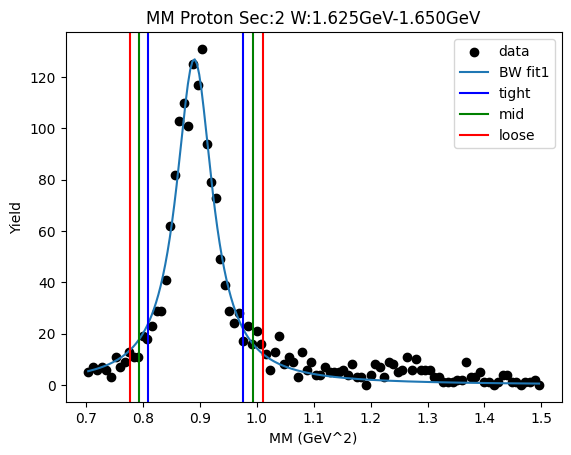

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.81047514 0.79492242 0.77952038]
 [0.97428937 0.99149951 1.00886032]]
Cut Bounds Err [[2.15250174e-06 2.55292301e-06 2.94580364e-06]
 [2.36003067e-06 2.85116004e-06 3.35124035e-06]]


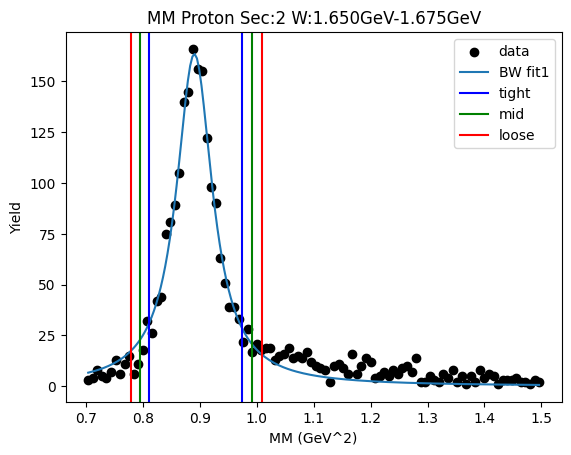

W bin: 11 1.675GeV-1.700GeV
background fit [5.57425649 0.98881887 0.00945153 6.58522568 1.26849558 0.17419918]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8850381157396305 0.8936273075419514
Breit-Wigner Peak [12.66885521  0.94304438  0.03783559]
Gaus2 [6.7529721  0.9817205  0.01499667]
Gaus3 [6.97257391 1.26119497 0.16487866]
Cut Bounds [[0.81503657 0.80056616 0.78622537]
 [0.96686908 0.98276519 0.9987909 ]]
Cut Bounds Err [[2.55281725e-06 3.03232890e-06 3.50328073e-06]
 [2.78044953e-06 3.35971603e-06 3.94855963e-06]]


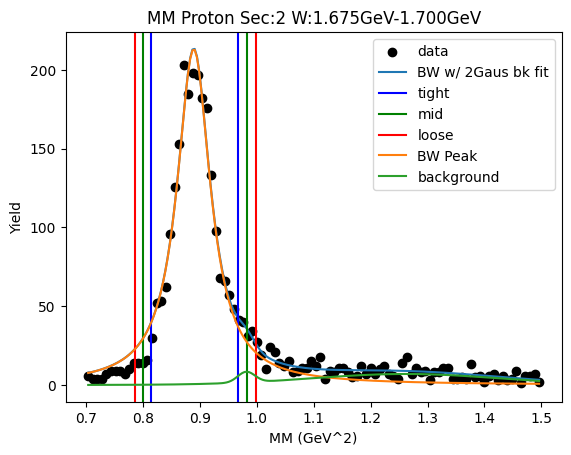

W bin: 12 1.700GeV-1.725GeV
background fit [0.02190114 7.1273825  0.085011   8.43064194 1.23020655 0.27817438]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8860200649961755 0.8937883249354758
Breit-Wigner Peak [15.35641821  0.94334734  0.03598208]
Gaus2 [ 6.73895265 11.31590464  0.20781735]
Gaus3 [9.74454278 1.22793379 0.19742261]
Cut Bounds [[0.81914904 0.80534967 0.79166753]
 [0.96358988 0.97867869 0.99388471]]
Cut Bounds Err [[3.03000094e-06 3.60279595e-06 4.16569513e-06]
 [3.28630159e-06 3.97161815e-06 4.66749725e-06]]


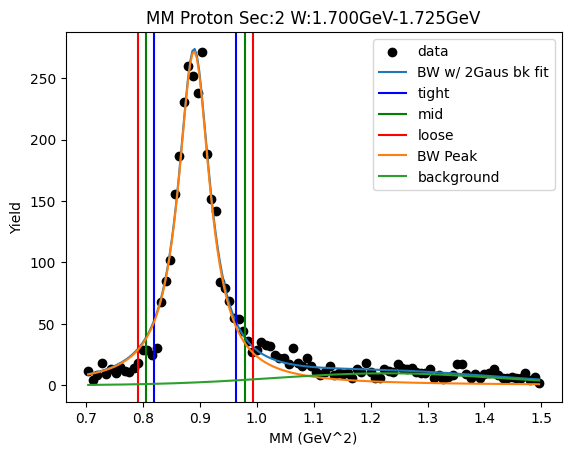

W bin: 13 1.725GeV-1.750GeV
background fit [ 6.48583922  5.9668013   0.34060004 11.66121192  1.27836036  0.28174922]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8900348203395467 0.8983942756746095
Breit-Wigner Peak [16.25255944  0.94562918  0.03732616]
Gaus2 [1.55717673 8.25043813 1.6285742 ]
Gaus3 [13.232528    1.25283409  0.21374279]
Cut Bounds [[0.82069194 0.80636585 0.7921659 ]
 [0.97089071 0.98660437 1.00244417]]
Cut Bounds Err [[3.32255006e-06 3.95039430e-06 4.56683814e-06]
 [3.61382086e-06 4.36964243e-06 5.13733215e-06]]


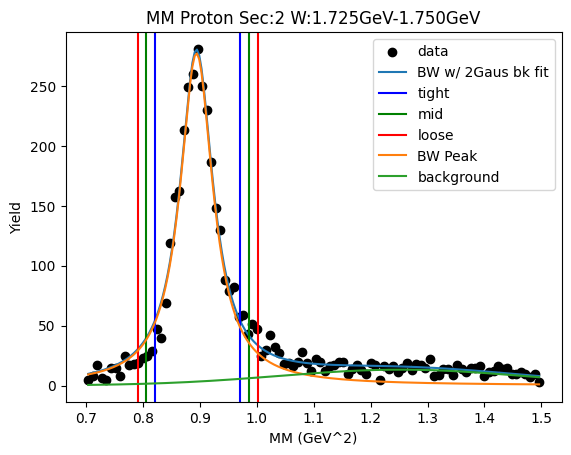

W bin: 14 1.750GeV-1.775GeV
background fit [9.39327969 0.94       2.56156834 7.936757   1.3549019  0.07910492]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8845255796032042 0.8910921674266695
Breit-Wigner Peak [13.12710995  0.9422361   0.03308219]
Gaus2 [16.26517298  1.32297459  0.23158784]
Gaus3 [33.45170943  0.94        0.04798939]
Cut Bounds [[0.8227257  0.81000634 0.79738606]
 [0.95536925 0.96917859 0.98308702]]
Cut Bounds Err [[5.12122954e-06 6.09367388e-06 7.05081427e-06]
 [5.51864349e-06 6.66556407e-06 7.82890347e-06]]


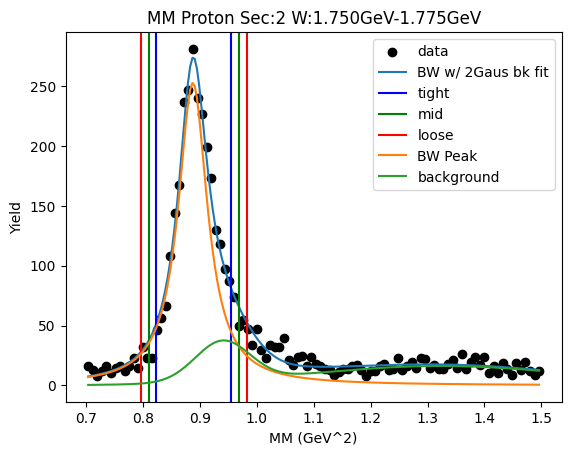

W bin: 15 1.775GeV-1.800GeV
background fit [19.3904017   1.33594168  0.15684909 17.72158216  1.04055495  0.03881331]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8890076781718211 0.8964911987033047
Breit-Wigner Peak [15.20512923  0.94485419  0.03531648]
Gaus2 [19.44233524  1.33360415  0.16585047]
Gaus3 [19.44898903  1.03234352  0.04421675]
Cut Bounds [[0.8231633  0.80958484 0.79611931]
 [0.9651587  0.97997932 0.99491288]]
Cut Bounds Err [[1.61619890e-06 1.92049125e-06 2.21984673e-06]
 [1.75005289e-06 2.11295187e-06 2.48156946e-06]]


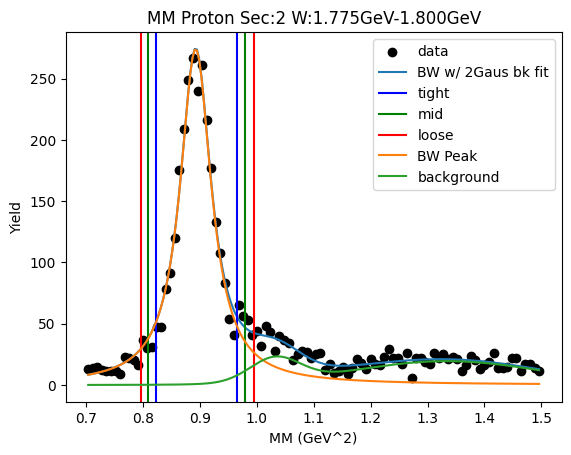

W bin: 16 1.800GeV-1.825GeV
background fit [18.84108595  1.34189745  0.2370788  15.56859075  1.02850355  0.03604054]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8869031716024304 0.8927384664034511
Breit-Wigner Peak [13.34944744  0.94330314  0.03118572]
Gaus2 [19.04668566  1.34076991  0.25321371]
Gaus3 [18.0999307   1.01323651  0.05332633]
Cut Bounds [[0.82833087 0.81629704 0.80435127]
 [0.9535121  0.96651451 0.97960498]]
Cut Bounds Err [[1.31852976e-06 1.56933492e-06 1.81649044e-06]
 [1.41465688e-06 1.70763763e-06 2.00463696e-06]]


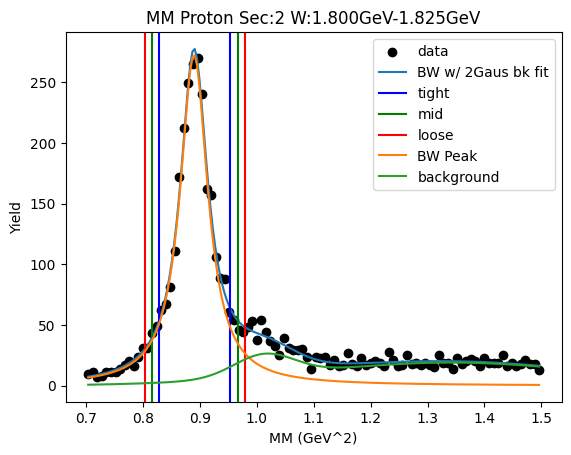

W bin: 17 1.825GeV-1.850GeV
background fit [22.02140671  1.3624662   0.21043594 10.92356732  1.04502841  0.04611222]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8855806790988527 0.893593532851235
Breit-Wigner Peak [14.83885526  0.94317925  0.03654416]
Gaus2 [22.5856088   1.36040079  0.20394888]
Gaus3 [16.94251914  1.00655769  0.07672884]
Cut Bounds [[0.81776299 0.8037609  0.78987973]
 [0.96443403 0.97976615 0.99521918]]
Cut Bounds Err [[3.00244830e-06 3.56890501e-06 4.12548021e-06]
 [3.26060413e-06 3.94033154e-06 4.63077194e-06]]


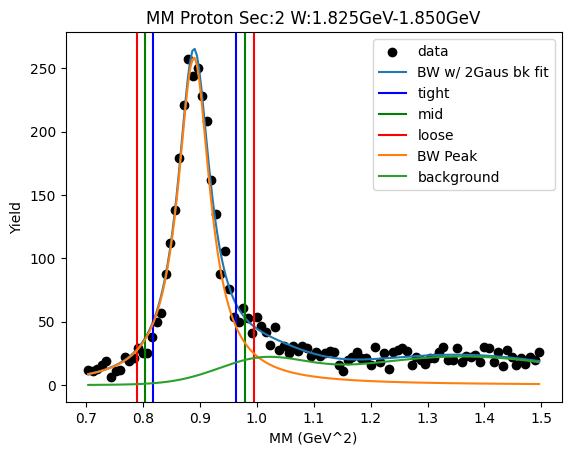

W bin: 18 1.850GeV-1.875GeV
background fit [24.92071616  1.36886509  0.26811625  9.95334952  1.01541131  0.02536049]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.886568984765129 0.8929424025196058
Breit-Wigner Peak [14.79233234  0.94326862  0.03259197]
Gaus2 [26.44533294  1.34866786  0.21189452]
Gaus3 [21.12435224  0.97715272  0.06621881]
Cut Bounds [[0.82554727 0.8129941  0.80053711]
 [0.95636846 0.96997953 0.98368678]]
Cut Bounds Err [[3.80996089e-06 4.53544669e-06 5.24953371e-06]
 [4.10073936e-06 4.95401884e-06 5.81913471e-06]]


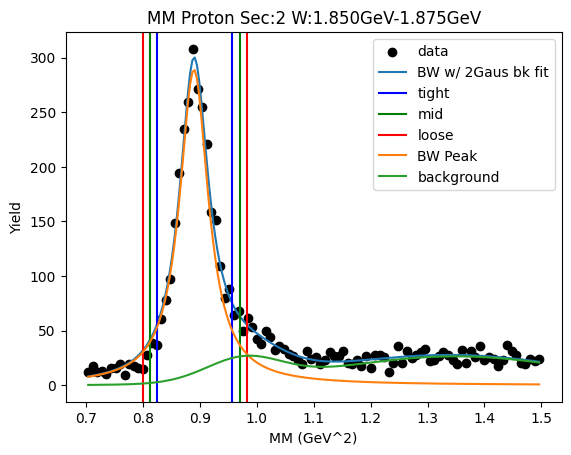

W bin: 19 1.875GeV-1.900GeV
background fit [27.01408588  1.37151758  0.25560318  9.22699216  1.03736263  0.03919953]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8853382209239943 0.8916584116818934
Breit-Wigner Peak [15.62695976  0.94260189  0.03245559]
Gaus2 [28.34178392  1.3474389   0.2240675 ]
Gaus3 [23.04202     0.97049723  0.06851854]
Cut Bounds [[0.8245996  0.81210597 0.7997077 ]
 [0.95478129 0.968324   0.98196207]]
Cut Bounds Err [[6.59831374e-06 7.85686690e-06 9.09547868e-06]
 [7.10008180e-06 8.57933038e-06 1.00787640e-05]]


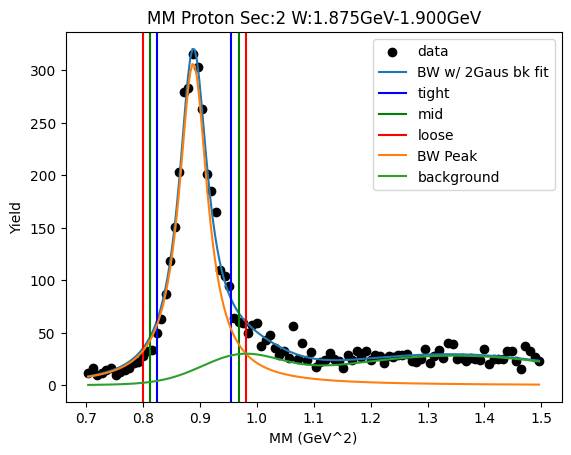

W bin: 20 1.900GeV-1.925GeV
background fit [29.28566494  1.37585945  0.20546307 17.95724372  1.02767887  0.04323292]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8865565912075815 0.8925180618263691
Breit-Wigner Peak [17.11077403  0.94315286  0.03152108]
Gaus2 [30.22594804  1.36910903  0.18925342]
Gaus3 [25.98548503  0.99479991  0.07008345]
Cut Bounds [[0.82740818 0.81525223 0.80318623]
 [0.9539154  0.96706089 0.98029633]]
Cut Bounds Err [[1.97835827e-06 2.35500206e-06 2.72602985e-06]
 [2.12422231e-06 2.56491043e-06 3.01162692e-06]]


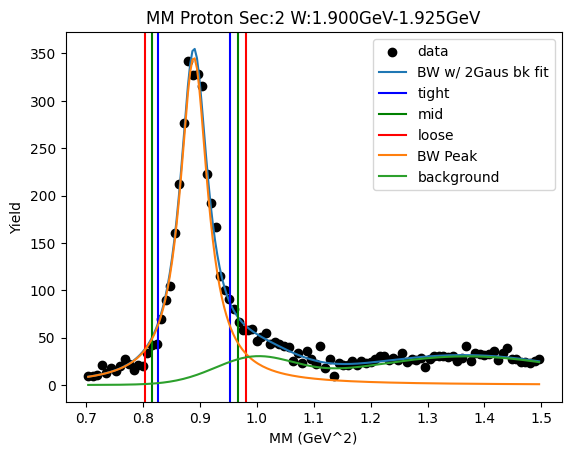

W bin: 21 1.925GeV-1.950GeV
background fit [31.12553183  1.40815041  0.2388378  14.27374471  1.02122207  0.0530685 ]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8855699407185028 0.8904811687855155
Breit-Wigner Peak [15.29410247  0.94235108  0.0286101 ]
Gaus2 [31.5532063   1.38727593  0.25241395]
Gaus3 [33.54521715  0.95652295  0.05950512]
Cut Bounds [[0.8315886  0.82052354 0.80953258]
 [0.94631524 0.95819551 0.97014989]]
Cut Bounds Err [[6.90240417e-06 8.22688365e-06 9.53303428e-06]
 [7.36315666e-06 8.89030990e-06 1.04359840e-05]]


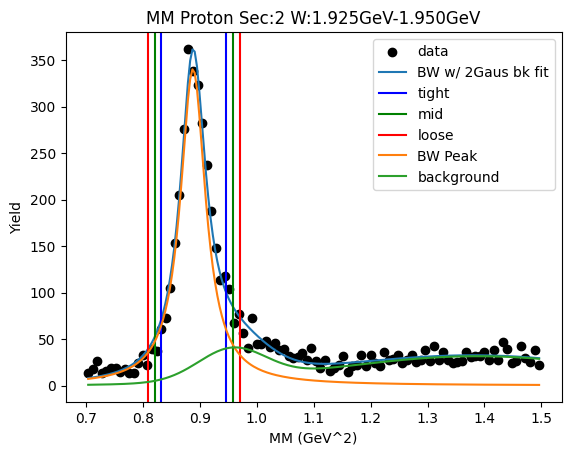

W bin: 22 1.950GeV-1.975GeV
background fit [35.20020169  1.44994554  0.31693475  9.94649801  1.0293533   0.0357029 ]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.885738236422565 0.891471743309566
Breit-Wigner Peak [16.47909876  0.94265847  0.03091253]
Gaus2 [36.05604184  1.39424714  0.23688599]
Gaus3 [24.67270391  0.98287533  0.06998712]
Cut Bounds [[0.82768655 0.81576241 0.80392479]
 [0.95168637 0.96456219 0.97752454]]
Cut Bounds Err [[2.70733142e-06 3.22444564e-06 3.73385489e-06]
 [2.90305591e-06 3.50621331e-06 4.11730993e-06]]


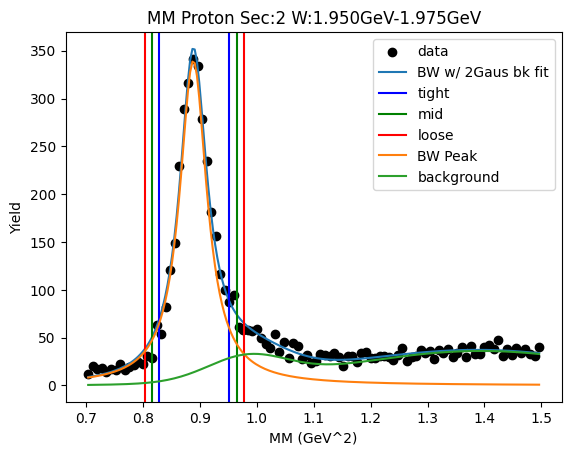

W bin: 23 1.975GeV-2.000GeV
background fit [37.56503861  1.40776323  0.257382   11.85668946  1.02669349  0.0425132 ]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.886464786513034 0.8917928327617937
Breit-Wigner Peak [15.71031115  0.94293627  0.02979946]
Gaus2 [38.40052251  1.38702565  0.2368768 ]
Gaus3 [25.28906856  0.97619275  0.0661843 ]
Cut Bounds [[0.83034871 0.81883389 0.80739947]
 [0.94991888 0.96231809 0.97479771]]
Cut Bounds Err [[2.69630614e-06 3.21230132e-06 3.72089979e-06]
 [2.88391332e-06 3.48239232e-06 4.08847168e-06]]


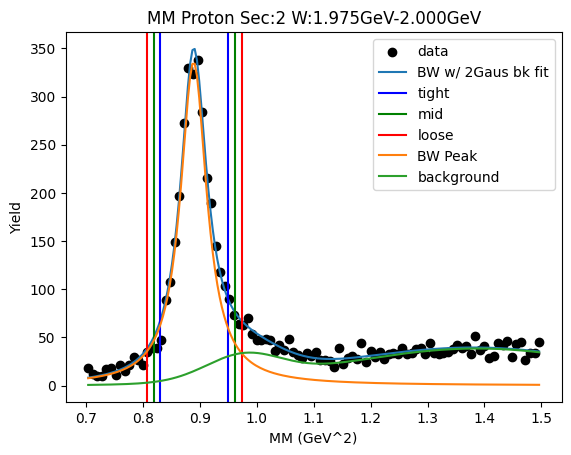

W bin: 24 2.000GeV-2.025GeV
background fit [40.53997719  1.41756689  0.21923488 22.01313051  1.02706535  0.05032356]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8854705994521388 0.8905960322058779
Breit-Wigner Peak [15.81485278  0.9423552   0.02922736]
Gaus2 [41.21978117  1.40954167  0.21011358]
Gaus3 [32.37118243  0.99277006  0.07348149]
Cut Bounds [[0.8303989  0.81910404 0.80788652]
 [0.94760127 0.95974689 0.97196985]]
Cut Bounds Err [[1.71342671e-06 2.04143916e-06 2.36486600e-06]
 [1.83035347e-06 2.20976079e-06 2.59392701e-06]]


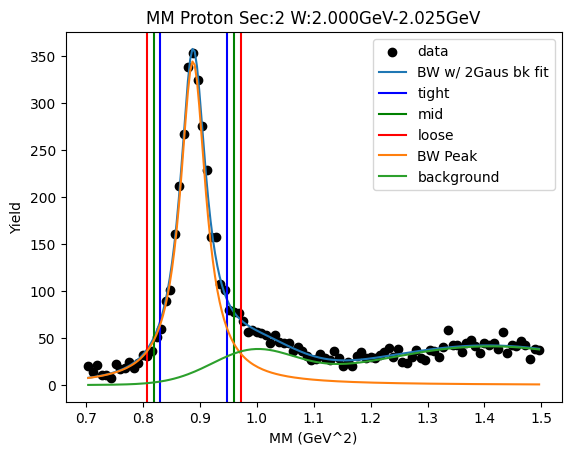

W bin: 25 2.025GeV-2.050GeV
background fit [4.12065426e+01 1.48891315e+00 3.09614610e-01 1.05397712e+01
 1.02901846e+00 3.95036328e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8853610191715728 0.8914189339051772
Breit-Wigner Peak [16.09710215  0.94254442  0.03177503]
Gaus2 [41.07115412  1.43128212  0.25684758]
Gaus3 [26.29532019  0.97812393  0.06672626]
Cut Bounds [[0.82581056 0.81356891 0.80141868]
 [0.95325471 0.9665019  0.97984049]]
Cut Bounds Err [[4.48016019e-06 5.33446094e-06 6.17567879e-06]
 [4.81346488e-06 5.81426366e-06 6.82861552e-06]]


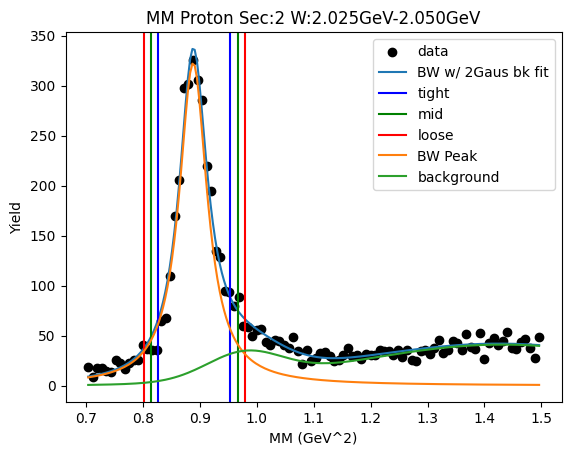

W bin: 26 2.050GeV-2.075GeV
background fit [40.10332217  1.43201431  0.21256468 20.34606101  1.01700246  0.08906466]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8857801796557183 0.8903415943291073
Breit-Wigner Peak [14.57410217  0.94236982  0.02757237]
Gaus2 [41.68907278  1.54243114  0.38074282]
Gaus3 [26.80498177  0.97331587  0.06883204]
Cut Bounds [[0.8336375  0.82295931 0.81234996]
 [0.94420504 0.95564037 0.96714452]]
Cut Bounds Err [[3.08705335e-06 3.68032158e-06 4.26570414e-06]
 [3.28540317e-06 3.96591890e-06 4.65441214e-06]]


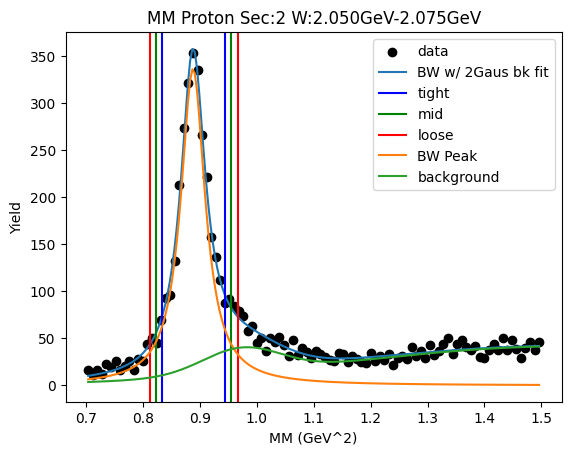

W bin: 27 2.075GeV-2.100GeV
background fit [4.76050902e+01 1.59855176e+00 3.86454705e-01 1.86823223e+01
 1.01162968e+00 1.76937829e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8837511876220836 0.8881568354283287
Breit-Wigner Peak [13.45573148  0.9412513   0.0270975 ]
Gaus2 [50.09023022  1.66077265  0.44632392]
Gaus3 [28.49648027  0.96149589  0.05914637]
Cut Bounds [[0.83251787 0.82203008 0.81160877]
 [0.94105216 0.95227123 0.96355678]]
Cut Bounds Err [[4.52941012e-06 5.40031920e-06 6.25986915e-06]
 [4.81561449e-06 5.81240555e-06 6.82072510e-06]]


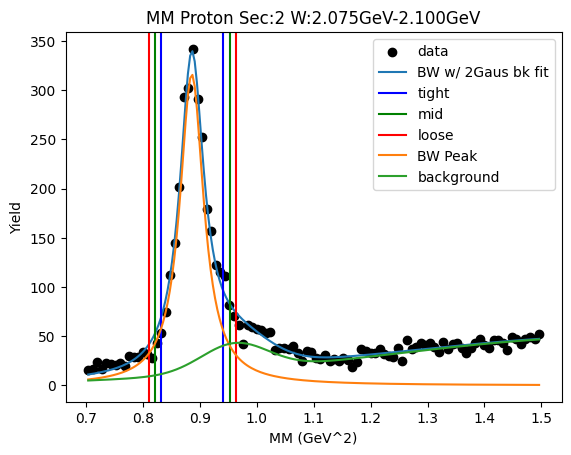

W bin: 28 2.100GeV-2.125GeV
background fit [4.43678640e+01 1.47265704e+00 3.17332398e-01 9.48191186e+00
 1.01432677e+00 3.64444909e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8831147584198081 0.887916032297066
Breit-Wigner Peak [13.81663011  0.94101828  0.02828802]
Gaus2 [44.3843498   1.4318021   0.29512166]
Gaus3 [30.39339371  0.9562528   0.05697807]
Cut Bounds [[0.82978369 0.8188547  0.80799816]
 [0.94305836 0.9547843  0.96658269]]
Cut Bounds Err [[5.20495357e-06 6.20376219e-06 7.18894450e-06]
 [5.54885911e-06 6.69891326e-06 7.86284029e-06]]


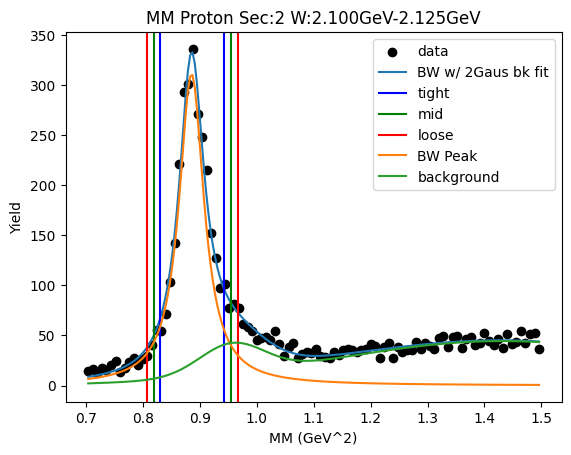

0.8859464397678867 0.890728917124056
Breit-Wigner Peak [5.94948447e+02 9.42516673e-01 2.82325975e-02]
Gaus2 [1.50204661e+03 9.57429333e-01 6.01934362e-02]
Gaus3 [1.93994303e+03 1.45408144e+00 2.78126030e-01]


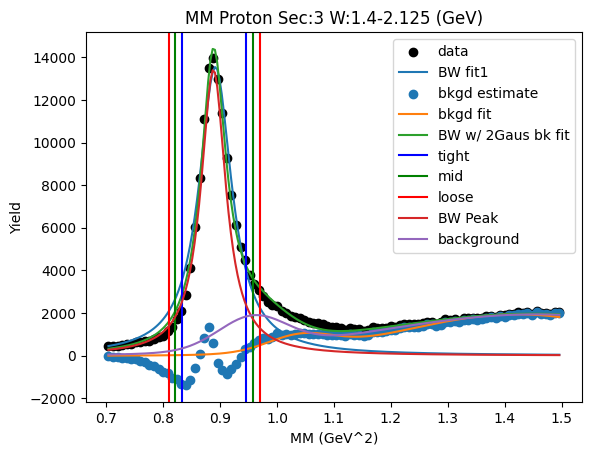

W bin: 0 1.400GeV-1.425GeV
Cut Bounds [[0.81660575 0.80515694 0.79378895]
 [0.93553917 0.94787704 0.96029574]]
Cut Bounds Err [[1.12994375e-06 1.34363088e-06 1.55453072e-06]
 [1.20943239e-06 1.45785963e-06 1.70981563e-06]]


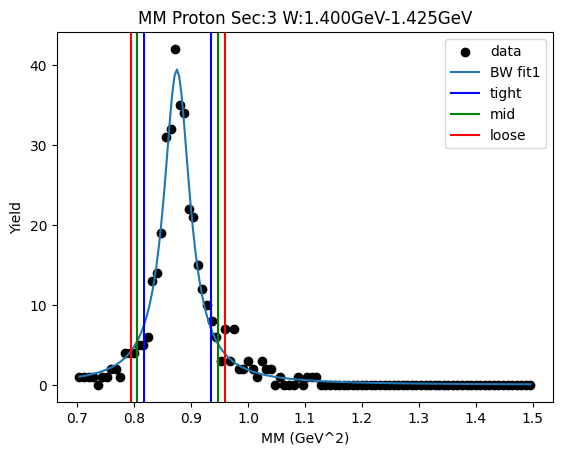

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.82286923 0.81118958 0.79959341]
 [0.94425726 0.95685522 0.96953666]]
Cut Bounds Err [[2.02016052e-06 2.40198357e-06 2.77875397e-06]
 [2.16404174e-06 2.60874702e-06 3.05983219e-06]]


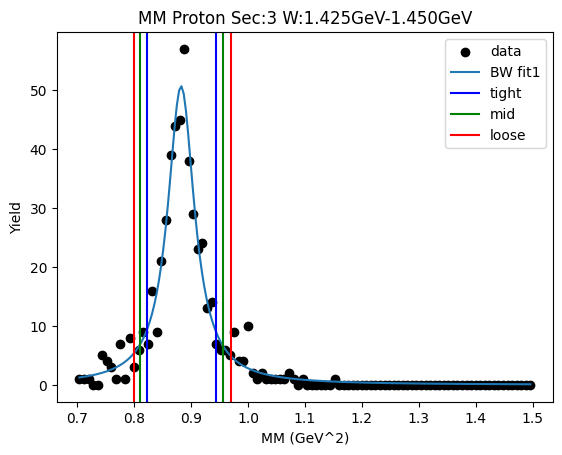

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.81793118 0.80608723 0.79432966]
 [0.94112156 0.95391568 0.96679618]]
Cut Bounds Err [[2.20912222e-06 2.62628659e-06 3.03779838e-06]
 [2.36965008e-06 2.85697268e-06 3.35139810e-06]]


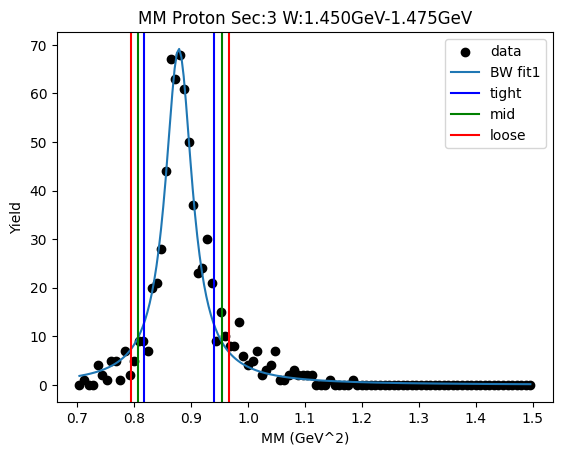

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.82032556 0.80766142 0.79509579]
 [0.95238536 0.96613318 0.97997951]]
Cut Bounds Err [[2.02755804e-06 2.40927292e-06 2.78541163e-06]
 [2.18467343e-06 2.63505587e-06 3.09234653e-06]]


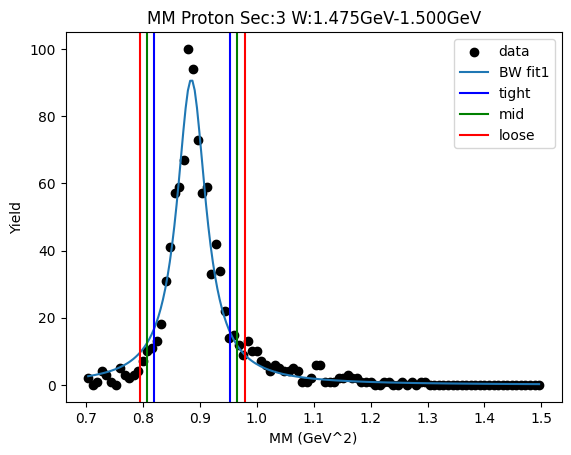

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.82140608 0.80842621 0.7955497 ]
 [0.95689034 0.97100731 0.98522766]]
Cut Bounds Err [[2.44854586e-06 2.90898276e-06 3.36250742e-06]
 [2.64277610e-06 3.18810198e-06 3.74194922e-06]]


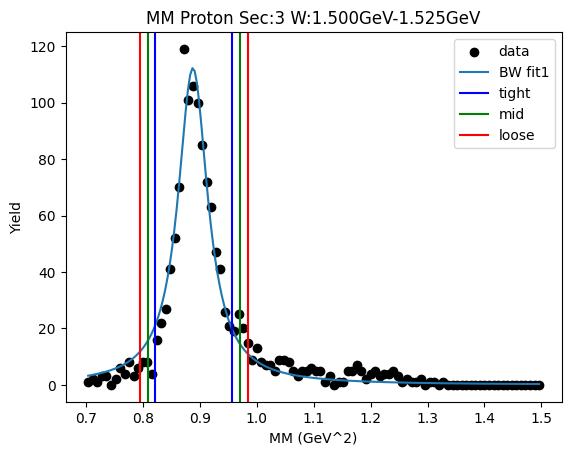

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.81634401 0.80300677 0.78977938]
 [0.95575816 0.97030375 0.98495919]]
Cut Bounds Err [[3.02738668e-06 3.59571018e-06 4.15516134e-06]
 [3.27570888e-06 3.95256418e-06 4.64027923e-06]]


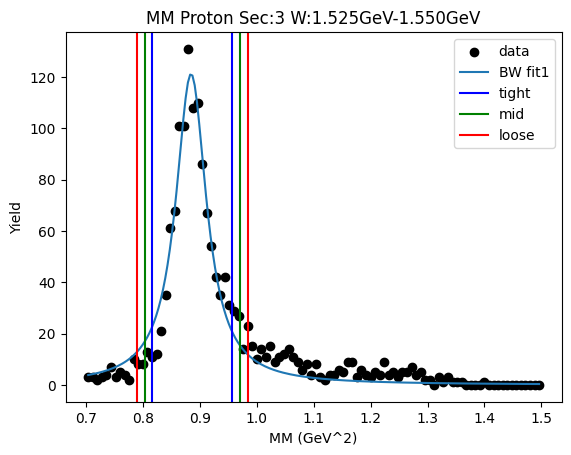

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.82281314 0.81039135 0.79806403]
 [0.95222739 0.96568845 0.97924398]]
Cut Bounds Err [[3.52797678e-06 4.19288126e-06 4.84832465e-06]
 [3.79529417e-06 4.57702921e-06 5.37054401e-06]]


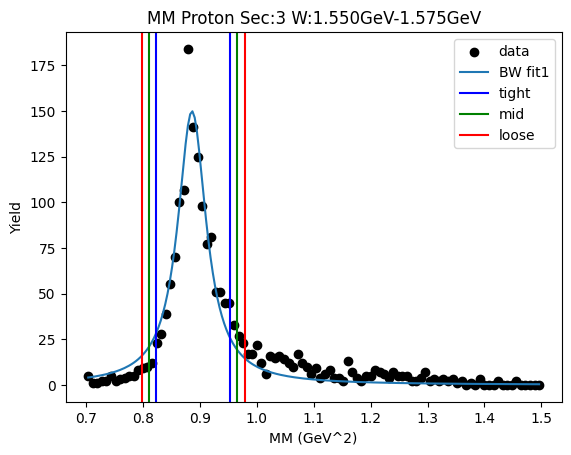

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.81936603 0.8064873  0.79371059]
 [0.95376426 0.96776517 0.9818681 ]]
Cut Bounds Err [[2.60257630e-06 3.09211156e-06 3.57434318e-06]
 [2.80792184e-06 3.38720422e-06 3.97549980e-06]]


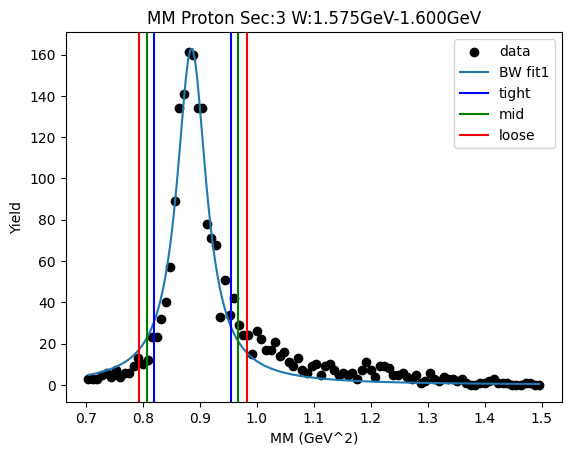

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.82369689 0.81149496 0.79938409]
 [0.95072406 0.96392756 0.97722213]]
Cut Bounds Err [[2.11476152e-06 2.51367995e-06 2.90704707e-06]
 [2.27198222e-06 2.73961330e-06 3.21418566e-06]]


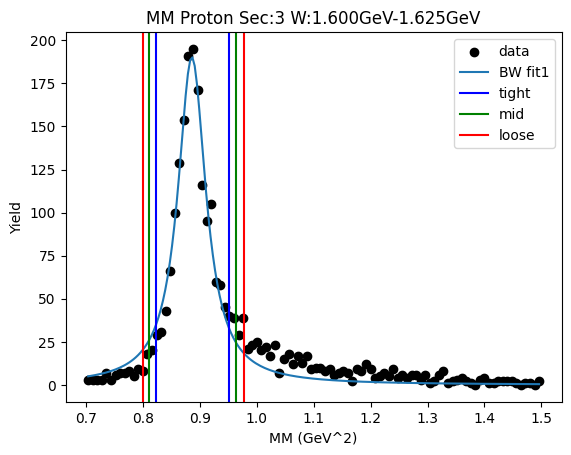

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.82304479 0.81060117 0.79825233]
 [0.95269423 0.9661805  0.97976155]]
Cut Bounds Err [[2.87747556e-06 3.41974386e-06 3.95428277e-06]
 [3.09582694e-06 3.73352531e-06 4.38084432e-06]]


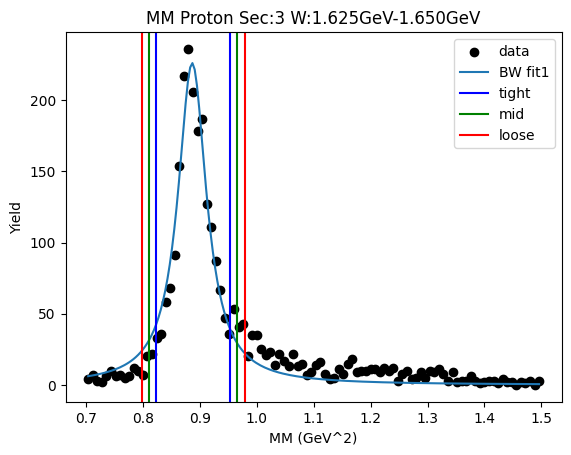

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.82770691 0.81635076 0.80507304]
 [0.94558282 0.95780184 0.97009931]]
Cut Bounds Err [[1.32311930e-06 1.57356965e-06 1.82083640e-06]
 [1.41419891e-06 1.70445446e-06 1.99876337e-06]]


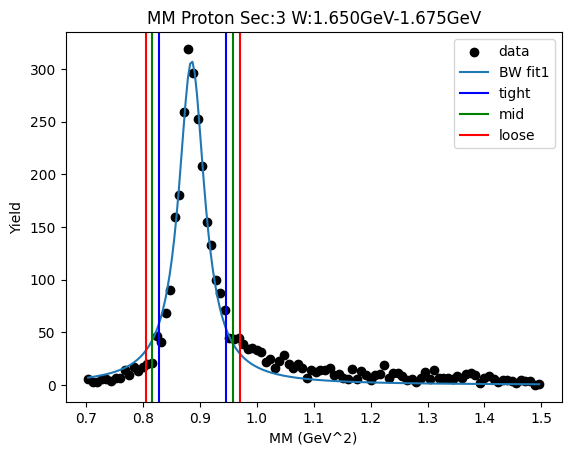

W bin: 11 1.675GeV-1.700GeV
background fit [15.73816627  0.99878051  0.04164655 12.0812156   1.26553572  0.14743849]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8823382000385596 0.886882593212297
Breit-Wigner Peak [15.73785159  0.94053729  0.02752088]
Gaus2 [26.4657592   0.95386458  0.05998589]
Gaus3 [12.74489235  1.25553511  0.15231973]
Cut Bounds [[0.83039435 0.81975686 0.80918795]
 [0.94054079 0.95193259 0.96339297]]
Cut Bounds Err [[2.61059210e-06 3.11234015e-06 3.60741234e-06]
 [2.77834162e-06 3.35388080e-06 3.93616069e-06]]


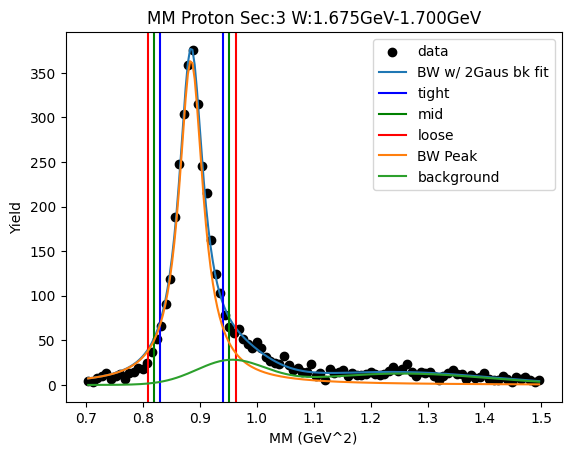

W bin: 12 1.700GeV-1.725GeV
background fit [16.53502127  0.98901264  0.07736642 14.38726504  1.30691477  0.14021371]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8815546966702926 0.8857784397097382
Breit-Wigner Peak [17.61859278  0.94003541  0.02653219]
Gaus2 [5.82195369e+01 9.40000000e-01 4.21475172e-02]
Gaus3 [15.95562975  1.24029271  0.18741335]
Cut Bounds [[0.83139688 0.82113415 0.81093515]
 [0.93752964 0.94849346 0.95952102]]
Cut Bounds Err [[1.62969337e-06 1.94094794e-06 2.24852935e-06]
 [1.73059008e-06 2.08604658e-06 2.44586647e-06]]


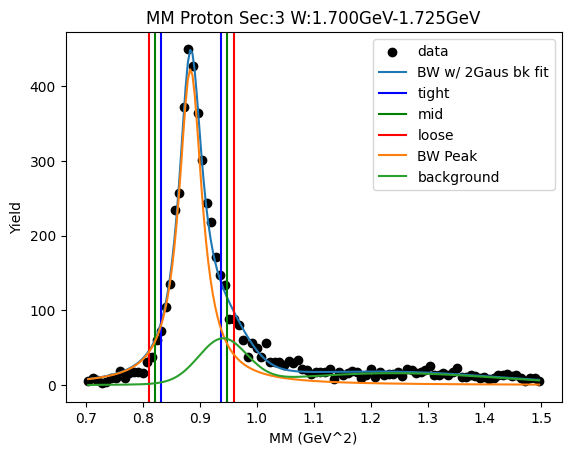

W bin: 13 1.725GeV-1.750GeV
background fit [18.69869212  1.00491457  0.07192709 20.48736243  1.32251704  0.14791362]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8845437601546219 0.8886440085562112
Breit-Wigner Peak [17.1231814   0.94159115  0.02614144]
Gaus2 [5.22310026e+01 9.40000000e-01 4.85676456e-02]
Gaus3 [21.24341239  1.27446628  0.19670543]
Cut Bounds [[0.83499591 0.82486193 0.81478982]
 [0.93973866 0.95055323 0.96142967]]
Cut Bounds Err [[4.40009458e-06 5.24732065e-06 6.08392606e-06]
 [4.66791979e-06 5.63294089e-06 6.60875861e-06]]


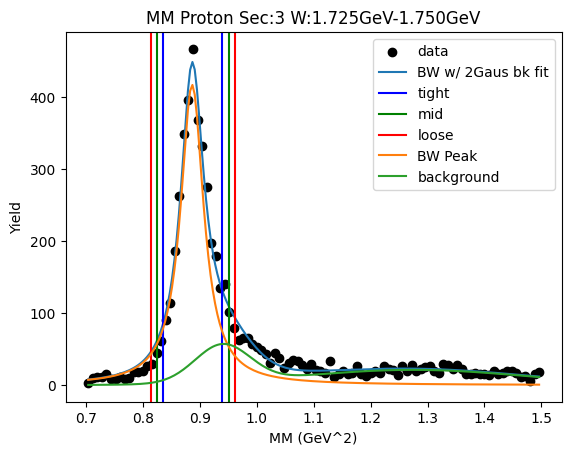

W bin: 14 1.750GeV-1.775GeV
background fit [23.77481137  0.94        0.10557182 24.83104309  1.37483654  0.18509762]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8841050451857606 0.8881206872056
Breit-Wigner Peak [15.61684252  0.94133568  0.02587032]
Gaus2 [6.83291449e+01 9.40000000e-01 4.61253500e-02]
Gaus3 [25.60046281  1.32721202  0.23760656]
Cut Bounds [[0.83505614 0.82502658 0.81505761]
 [0.93868447 0.94938058 0.96013728]]
Cut Bounds Err [[3.68427572e-06 4.39360296e-06 5.09417998e-06]
 [3.90619666e-06 4.71310387e-06 5.52900265e-06]]


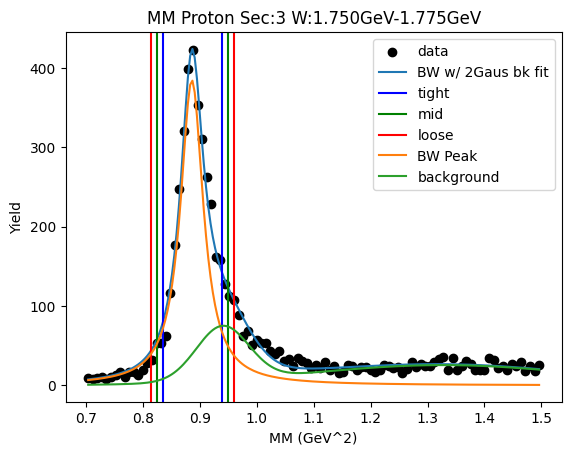

W bin: 15 1.775GeV-1.800GeV
background fit [24.70695025  0.99953143  0.06619779 29.18182907  1.3395616   0.14960411]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8823649660980849 0.8867134530789617
Breit-Wigner Peak [14.7016519   0.94049945  0.02692114]
Gaus2 [6.11119862e+01 9.42591064e-01 5.44727444e-02]
Gaus3 [28.89419089  1.31299113  0.20311669]
Cut Bounds [[0.83148854 0.82107526 0.8107276 ]
 [0.93923032 0.9503654  0.96156609]]
Cut Bounds Err [[8.91708131e-06 1.06325878e-05 1.23257874e-05]
 [9.47721306e-06 1.14391249e-05 1.34235308e-05]]


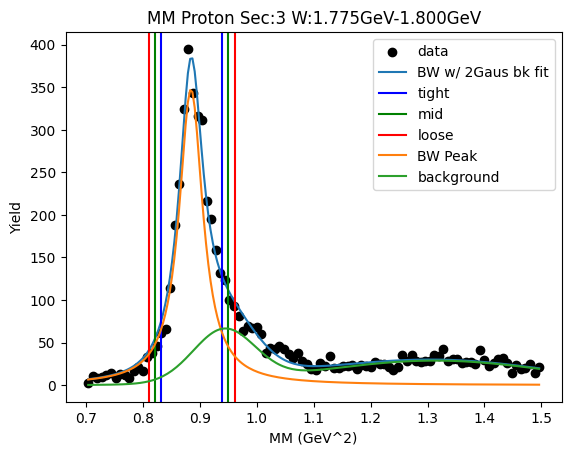

W bin: 16 1.800GeV-1.825GeV
background fit [27.01052247  0.9590336   0.13266473 30.0086818   1.38252117  0.1610933 ]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8850181710305526 0.8896524121749533
Breit-Wigner Peak [16.34238215  0.94198476  0.02779161]
Gaus2 [44.00511788  0.96200638  0.06170531]
Gaus3 [30.54664166  1.34459342  0.21484378]
Cut Bounds [[0.83250883 0.82175333 0.81106776]
 [0.94390999 0.95543472 0.96702938]]
Cut Bounds Err [[6.18685309e-06 7.37525959e-06 8.54774876e-06]
 [6.58780401e-06 7.95256238e-06 9.33346739e-06]]


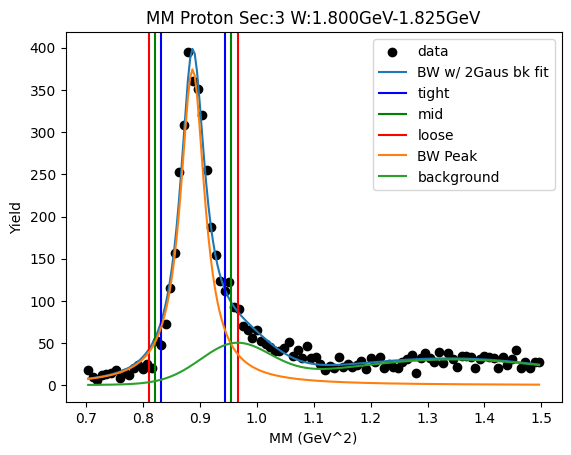

W bin: 17 1.825GeV-1.850GeV
background fit [1.85311636e+01 1.01670494e+00 2.91389364e-02 2.93467704e+01
 1.32000252e+00 2.59960926e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8861866232376434 0.8911793726125155
Breit-Wigner Peak [17.85783377  0.94269985  0.02884658]
Gaus2 [32.77277603  0.9838301   0.06849653]
Gaus3 [31.4262206   1.32288035  0.19661333]
Cut Bounds [[0.83176589 0.82060848 0.80952642]
 [0.9474836  0.95946974 0.97153121]]
Cut Bounds Err [[2.61272438e-06 3.11320704e-06 3.60679363e-06]
 [2.78855295e-06 3.36632190e-06 3.95124682e-06]]


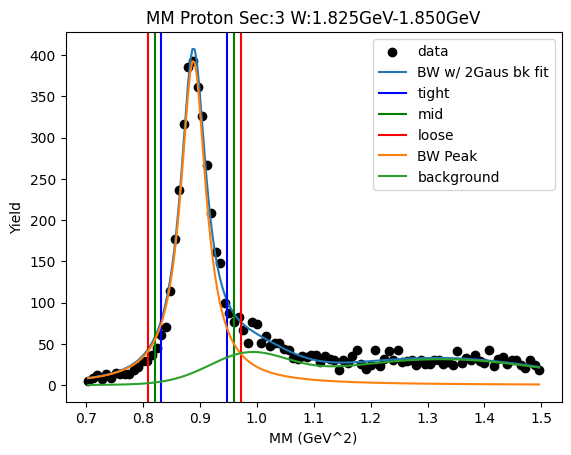

W bin: 18 1.850GeV-1.875GeV
background fit [ 5.65436342  1.01354708  0.04126411 33.14552111  1.36524546  0.32671322]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8837895276562168 0.887910188541985
Breit-Wigner Peak [16.53310118  0.94119597  0.02620643]
Gaus2 [5.83186195e+01 9.40000000e-01 4.39213871e-02]
Gaus3 [36.7151247   1.30848828  0.2256373 ]
Cut Bounds [[0.83414757 0.82399365 0.81390191]
 [0.93910665 0.94994454 0.96084462]]
Cut Bounds Err [[3.91412095e-06 4.66590296e-06 5.40846055e-06]
 [4.15307960e-06 5.00982892e-06 5.87643875e-06]]


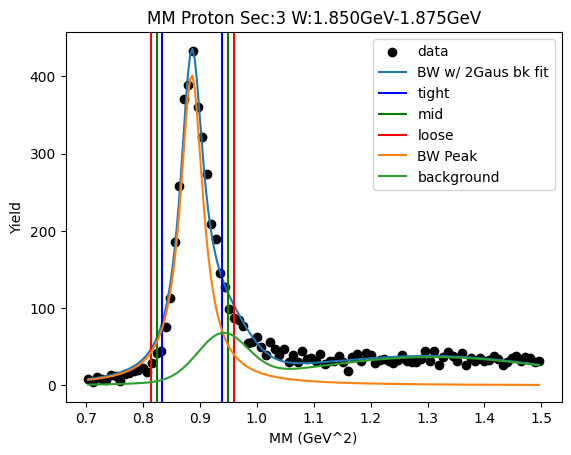

W bin: 19 1.875GeV-1.900GeV
background fit [14.1504839   1.00545123  0.04653789 37.83046832  1.36038306  0.23717031]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8859921981660389 0.8906804801991025
Breit-Wigner Peak [18.71801898  0.94251596  0.02795318]
Gaus2 [36.58909203  0.95874007  0.05944319]
Gaus3 [39.67470508  1.34032245  0.21000631]
Cut Bounds [[0.83316465 0.82234255 0.8115912 ]
 [0.94527665 0.95687695 0.96854799]]
Cut Bounds Err [[3.80224218e-06 4.53244983e-06 5.25282024e-06]
 [4.04998880e-06 4.88916473e-06 5.73831583e-06]]


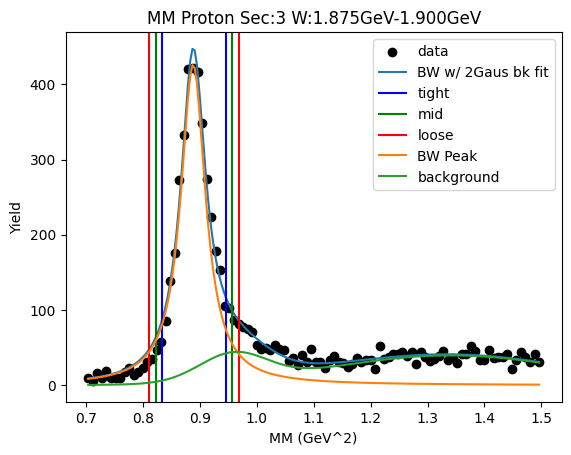

W bin: 20 1.900GeV-1.925GeV
background fit [17.62705095  0.97045857  0.06369392 40.6991232   1.35876037  0.22685308]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8851036761909932 0.8891795962262963
Breit-Wigner Peak [17.3293008   0.94188197  0.02606377]
Gaus2 [6.14364650e+01 9.40000000e-01 4.73750878e-02]
Gaus3 [42.47582154  1.33207391  0.22197096]
Cut Bounds [[0.83567855 0.82557044 0.81552384]
 [0.94014235 0.950927   0.96177316]]
Cut Bounds Err [[5.28289801e-06 6.30006484e-06 7.30454772e-06]
 [5.60337138e-06 6.76147648e-06 7.93252275e-06]]


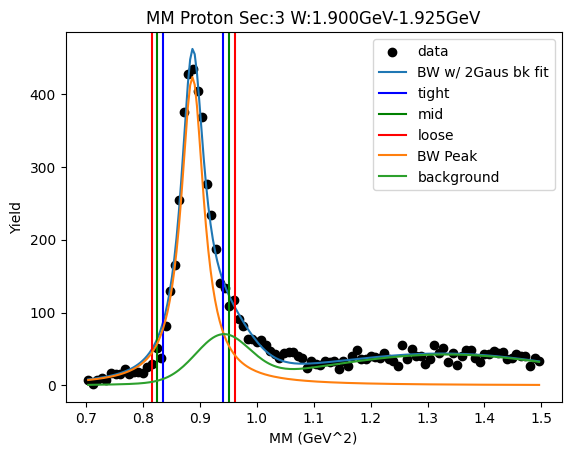

W bin: 21 1.925GeV-1.950GeV
background fit [22.56336925  0.99466872  0.08619734 43.92664636  1.38301199  0.19738011]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8863305997729248 0.8908050031756974
Breit-Wigner Peak [18.75442883  0.94263874  0.02730813]
Gaus2 [45.55089919  0.95939199  0.06117338]
Gaus3 [44.35724798  1.3657975   0.22211434]
Cut Bounds [[0.8346422  0.82405963 0.81354458]
 [0.94418135 0.95550661 0.96689939]]
Cut Bounds Err [[3.74347829e-06 4.46324746e-06 5.17354415e-06]
 [3.98155627e-06 4.80605232e-06 5.64011715e-06]]


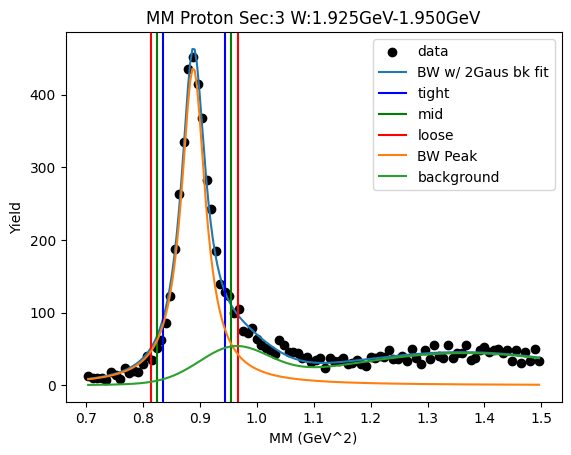

W bin: 22 1.950GeV-1.975GeV
background fit [26.35943196  0.99813841  0.06569177 48.32750972  1.42335595  0.21009231]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8857949911613503 0.8901317542349227
Breit-Wigner Peak [18.35766662  0.94231808  0.02688483]
Gaus2 [56.55253125  0.95705442  0.05958477]
Gaus3 [48.46914888  1.4189971   0.23603756]
Cut Bounds [[0.83487913 0.82445861 0.81410352]
 [0.94268363 0.95382401 0.96502982]]
Cut Bounds Err [[3.84454977e-06 4.58419418e-06 5.31426566e-06]
 [4.08523146e-06 4.93074680e-06 5.78593847e-06]]


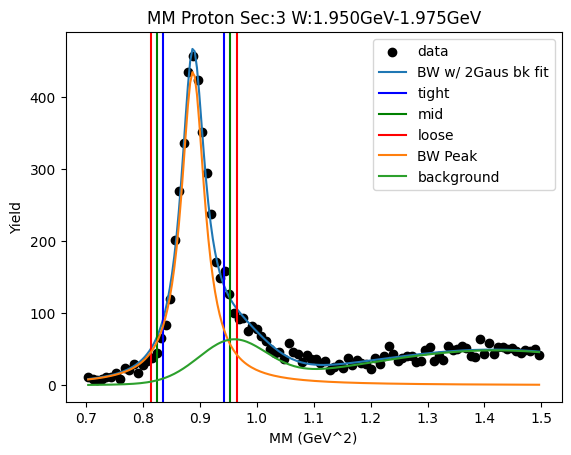

W bin: 23 1.975GeV-2.000GeV
background fit [21.66195811  1.00872483  0.05734021 48.86112472  1.4681131   0.27815782]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8864815591427997 0.8905212243700238
Breit-Wigner Peak [18.38600616  0.94260352  0.02594759]
Gaus2 [50.24918121  0.96091585  0.06049739]
Gaus3 [48.69038861  1.41980547  0.25198939]
Cut Bounds [[0.83722444 0.82715193 0.81714037]
 [0.94130228 0.95204533 0.96284934]]
Cut Bounds Err [[3.98446189e-06 4.75205368e-06 5.51009294e-06]
 [4.22486934e-06 5.09820752e-06 5.98121977e-06]]


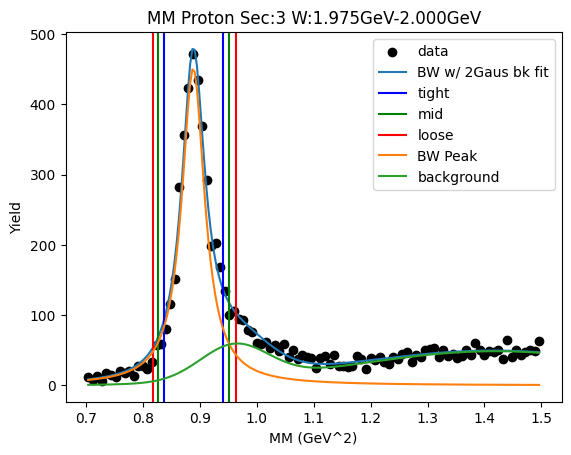

W bin: 24 2.000GeV-2.025GeV
Runtime Error2.2
	Just skip it for now
Cut Bounds [[0.8271309  0.81460865 0.80218192]
 [0.95760664 0.97117954 0.98484796]]
Cut Bounds Err [[8.03006467e-06 9.54324022e-06 1.10348150e-05]
 [8.64023381e-06 1.04200813e-05 1.22268115e-05]]


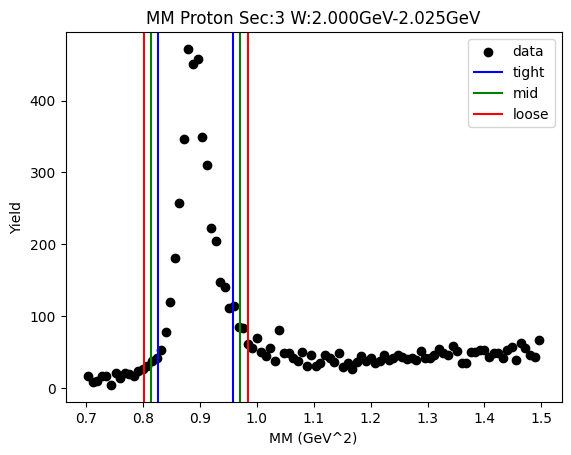

W bin: 25 2.025GeV-2.050GeV
background fit [22.26179608  1.01946667  0.06893223 51.84474096  1.44117761  0.22500267]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.885648523015999 0.8893685015062214
Breit-Wigner Peak [16.13970117  0.9420767   0.02489973]
Gaus2 [5.83075586e+01 9.40678643e-01 5.18254312e-02]
Gaus3 [51.37090915  1.448002    0.2965313 ]
Cut Bounds [[0.83830071 0.82862755 0.81901052]
 [0.93811966 0.94841029 0.95875705]]
Cut Bounds Err [[6.45050288e-06 7.69549813e-06 8.92560821e-06]
 [6.82374478e-06 8.23294437e-06 9.65711413e-06]]


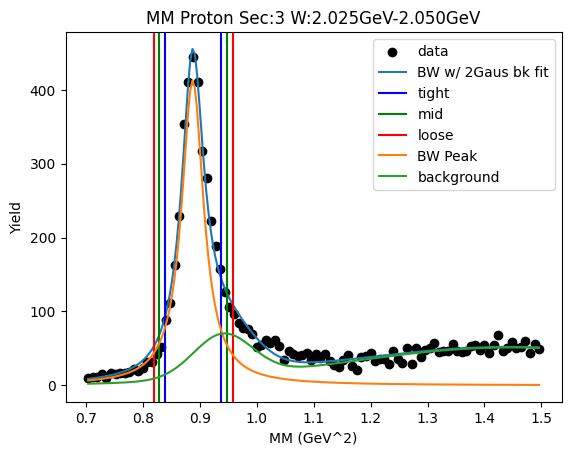

W bin: 26 2.050GeV-2.075GeV
background fit [29.42495602  1.12742361  0.26135204 39.5462985   1.45293643  0.10881538]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8863294748041081 0.890269895469978
Breit-Wigner Peak [16.37748812  0.94249652  0.02562688]
Gaus2 [5.60282593e+01 9.41916444e-01 5.04586878e-02]
Gaus3 [51.11310593  1.46664269  0.31591771]
Cut Bounds [[0.83765306 0.82770212 0.81781063]
 [0.94043281 0.95103782 0.96170228]]
Cut Bounds Err [[7.22391282e-06 8.61667227e-06 9.99227056e-06]
 [7.65427908e-06 9.23637242e-06 1.08357289e-05]]


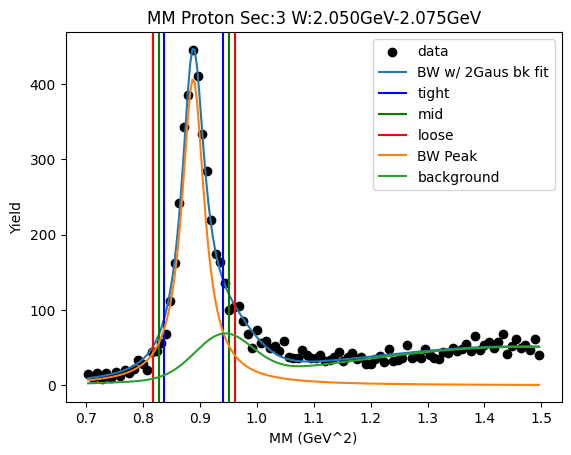

W bin: 27 2.075GeV-2.100GeV
background fit [2.81446741e+01 1.01012448e+00 5.61262339e-02 5.64423334e+01
 1.49214759e+00 2.52532976e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8870337653200073 0.8912922157134031
Breit-Wigner Peak [17.13295502  0.94295439  0.02664098]
Gaus2 [46.70361189  0.97890674  0.06579747]
Gaus3 [56.02774102  1.46951442  0.24296107]
Cut Bounds [[0.83651681 0.82618035 0.81590815]
 [0.94341565 0.95445896 0.96556653]]
Cut Bounds Err [[2.54887870e-06 3.03893878e-06 3.52278763e-06]
 [2.70684489e-06 3.26635324e-06 3.83227731e-06]]


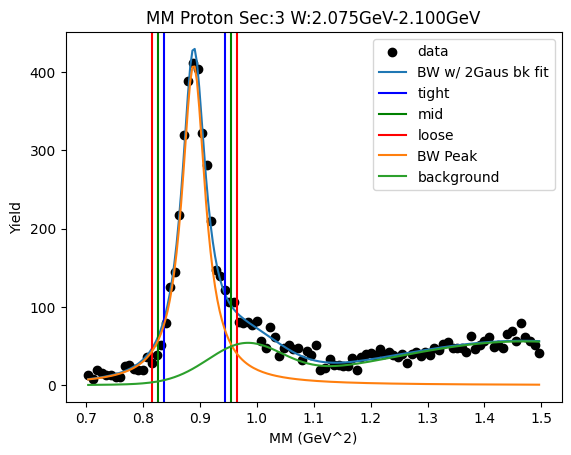

W bin: 28 2.100GeV-2.125GeV
background fit [1.60609127e+01 1.00885086e+00 4.99235388e-02 5.48871078e+01
 1.51181806e+00 2.96159416e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.888350123928909 0.8932774741619708
Breit-Wigner Peak [16.37193085  0.94382933  0.02865702]
Gaus2 [44.31067208  0.96359082  0.05932738]
Gaus3 [53.63238447  1.45541275  0.26448968]
Cut Bounds [[0.83419568 0.82309511 0.81206889]
 [0.94929074 0.96120918 0.97320198]]
Cut Bounds Err [[5.16931228e-06 6.16076857e-06 7.13856296e-06]
 [5.51440201e-06 6.65761750e-06 7.81476368e-06]]


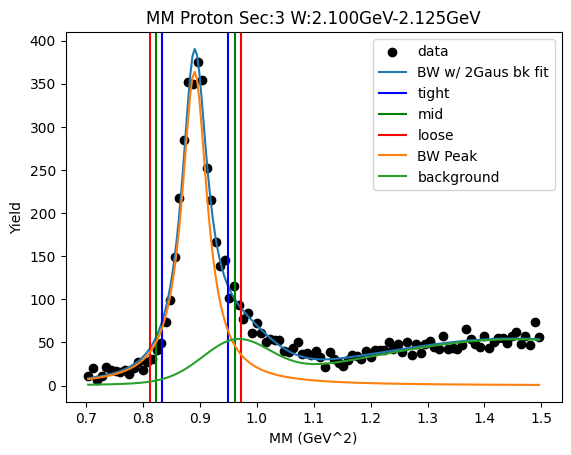

0.8974593102872923 0.9030339226980233
Breit-Wigner Peak [6.94304861e+02 9.48813267e-01 3.04811756e-02]
Gaus2 [1.33495281e+03 9.83074655e-01 6.61827077e-02]
Gaus3 [2.08901939e+03 1.44144788e+00 2.52278901e-01]


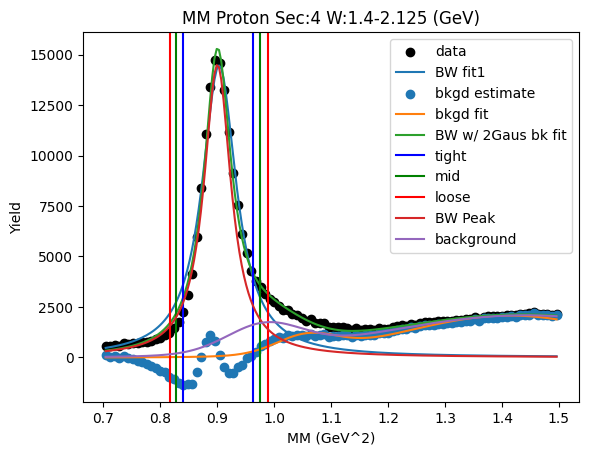

W bin: 0 1.400GeV-1.425GeV
Cut Bounds [[0.84830584 0.83425233 0.82031621]
 [0.995297   1.01064172 1.02610383]]
Cut Bounds Err [[7.49342604e-06 8.89901345e-06 1.02823121e-05]
 [8.11671962e-06 9.79471402e-06 1.14999457e-05]]


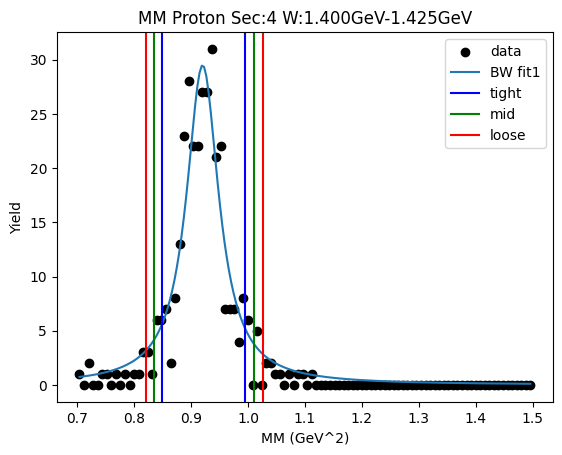

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.8493382  0.8359101  0.822589  ]
 [0.98950403 1.0041091  1.01882116]]
Cut Bounds Err [[5.73770742e-06 6.81656310e-06 7.87922112e-06]
 [6.19308234e-06 7.47095506e-06 8.76881322e-06]]


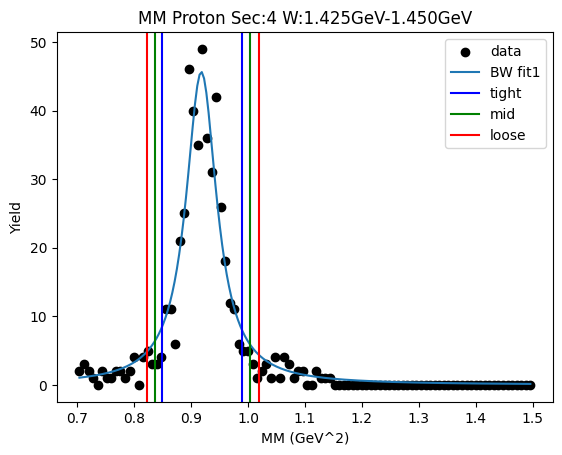

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.84838051 0.83533974 0.82239998]
 [0.98434344 0.99849526 1.01274809]]
Cut Bounds Err [[2.28048748e-06 2.70988551e-06 3.13304571e-06]
 [2.45643727e-06 2.96273205e-06 3.47676952e-06]]


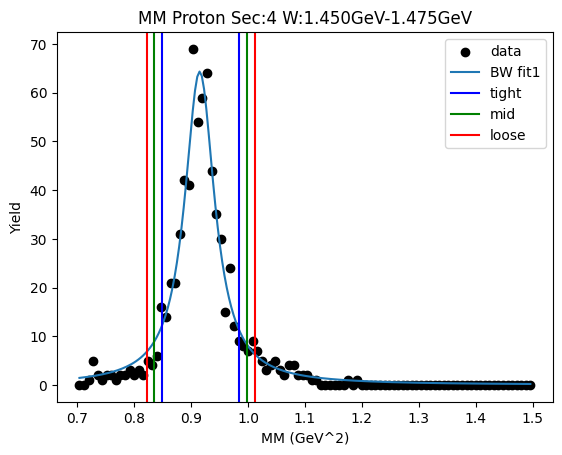

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.85703739 0.84538447 0.83381132]
 [0.97795358 0.9904839  1.00309399]]
Cut Bounds Err [[1.37936254e-06 1.64054963e-06 1.89845335e-06]
 [1.47345767e-06 1.77576687e-06 2.08226907e-06]]


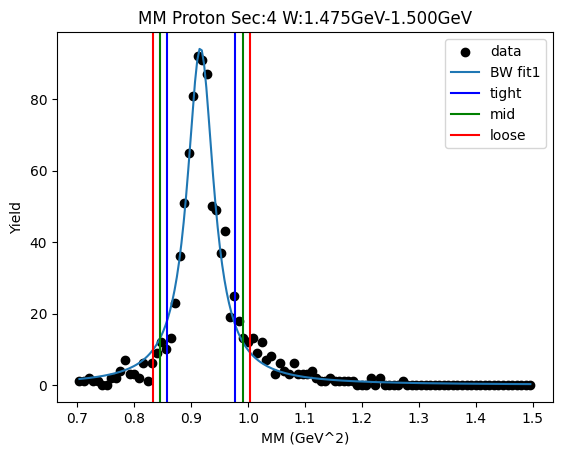

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.85615673 0.84393184 0.83179484]
 [0.98324062 0.99643249 1.00971228]]
Cut Bounds Err [[1.40168861e-06 1.66653048e-06 1.92784484e-06]
 [1.50212063e-06 1.81085434e-06 2.12404045e-06]]


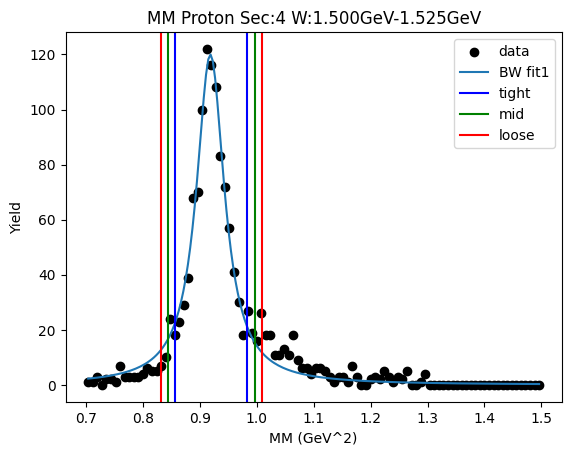

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.85051555 0.83759809 0.82477948]
 [0.98512661 0.99913137 1.01323497]]
Cut Bounds Err [[1.97085218e-06 2.34216386e-06 2.70815717e-06]
 [2.12108928e-06 2.55806004e-06 3.00164984e-06]]


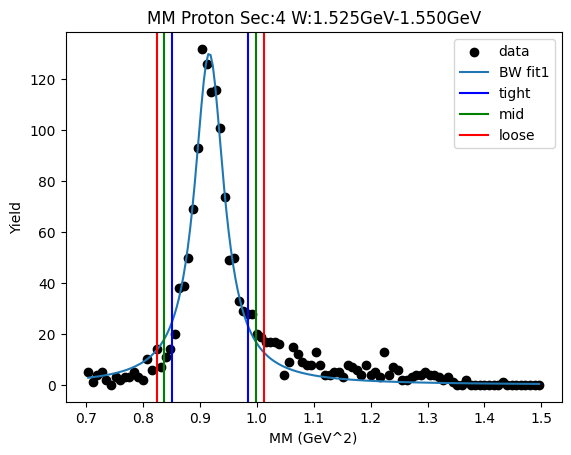

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.85027482 0.83730365 0.82443219]
 [0.98547006 0.99953794 1.01370552]]
Cut Bounds Err [[2.79093306e-06 3.31663663e-06 3.83477115e-06]
 [3.00463331e-06 3.62373175e-06 4.25224117e-06]]


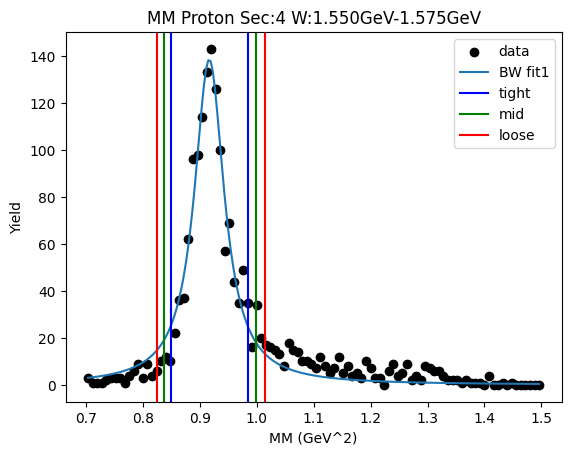

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.85301254 0.8406185  0.82831516]
 [0.98194152 0.99533327 1.00881573]]
Cut Bounds Err [[2.38096249e-06 2.83047692e-06 3.27387974e-06]
 [2.55456911e-06 3.07995525e-06 3.61302394e-06]]


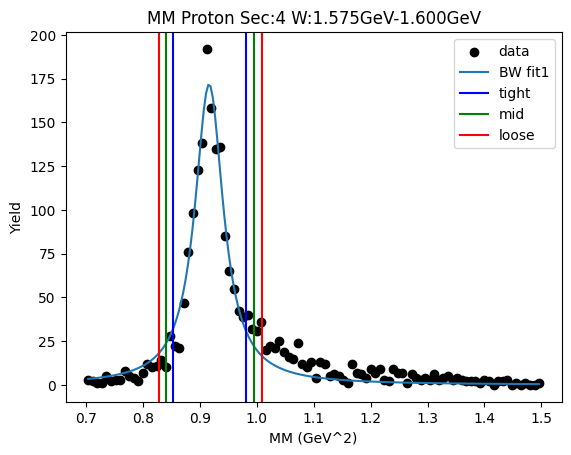

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.83981669 0.82554607 0.81139774]
 [0.98924871 1.0048645  1.02060258]]
Cut Bounds Err [[2.92543277e-06 3.47343647e-06 4.01248782e-06]
 [3.17505036e-06 3.83214959e-06 4.50013104e-06]]


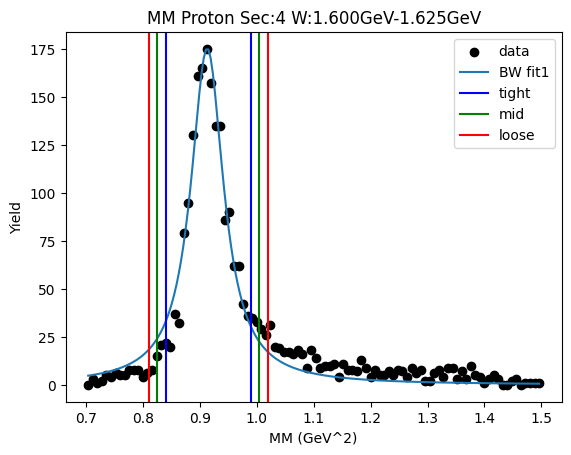

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.84775567 0.83538224 0.82309977]
 [0.97649295 0.98986698 1.00333197]]
Cut Bounds Err [[2.51699418e-06 2.99209499e-06 3.46070144e-06]
 [2.70135347e-06 3.25702563e-06 3.82085201e-06]]


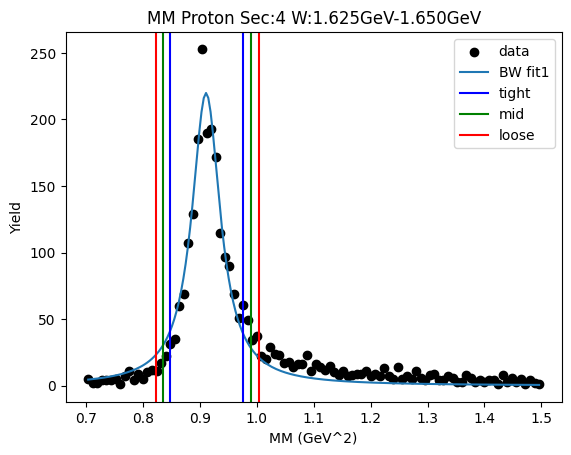

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.84504465 0.83197657 0.81901033]
 [0.98132625 0.9955145  1.00980458]]
Cut Bounds Err [[1.82249844e-06 2.16556102e-06 2.50360436e-06]
 [1.96396636e-06 2.36885606e-06 2.77996723e-06]]


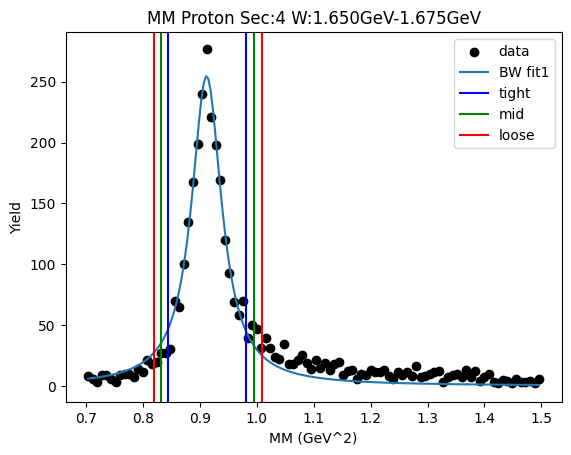

W bin: 11 1.675GeV-1.700GeV
background fit [13.64814272  1.03207715  0.04607531 10.84529484  1.28116307  0.1546625 ]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9051809401614601 0.910145508432912
Breit-Wigner Peak [14.84772622  0.95271361  0.02876505]
Gaus2 [23.47803157  0.98262617  0.06251931]
Gaus3 [11.65358696  1.26494448  0.16137548]
Cut Bounds [[0.85029145 0.83904184 0.82786714]
 [0.96690785 0.97898152 0.9911301 ]]
Cut Bounds Err [[4.78378974e-06 5.70178893e-06 6.60718138e-06]
 [5.10129830e-06 6.15894852e-06 7.22938309e-06]]


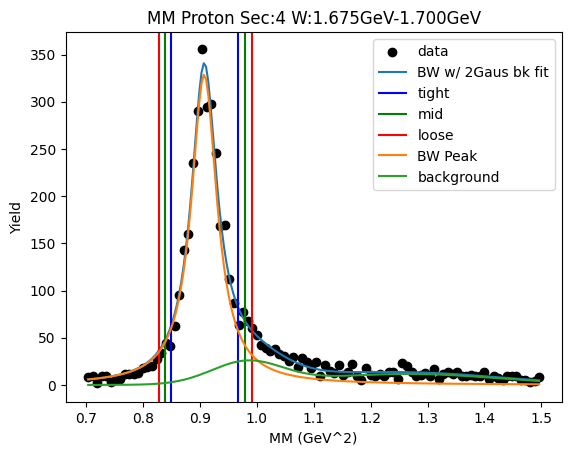

W bin: 12 1.700GeV-1.725GeV
background fit [10.00365514  1.00840554  0.0405285  13.92135104  1.27794774  0.20760699]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9029170427089145 0.9078358923823494
Breit-Wigner Peak [16.55288839  0.95151273  0.02863229]
Gaus2 [5.51723830e+01 9.40000000e-01 4.64817956e-02]
Gaus3 [16.86919145  1.23564083  0.19004321]
Cut Bounds [[0.84833833 0.83715338 0.82604265]
 [0.96427021 0.97627164 0.98834728]]
Cut Bounds Err [[5.05092653e-06 6.02040067e-06 6.97660029e-06]
 [5.38500217e-06 6.50141988e-06 7.63128008e-06]]


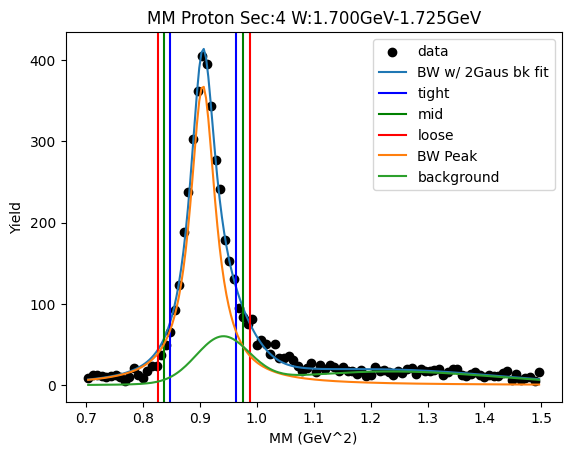

W bin: 13 1.725GeV-1.750GeV
background fit [13.10040494  1.02209817  0.02781875 17.32073451  1.31876609  0.30111523]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.901717910773122 0.9057941347809223
Breit-Wigner Peak [16.69551993  0.95066083  0.02606474]
Gaus2 [8.20659529e+01 9.40000000e-01 3.68614676e-02]
Gaus3 [21.80269477  1.23256286  0.22519376]
Cut Bounds [[0.85180419 0.84159835 0.83145403]
 [0.95724559 0.96812803 0.97907198]]
Cut Bounds Err [[6.47435836e-06 7.72099677e-06 8.95229262e-06]
 [6.86338772e-06 8.28108664e-06 9.71454489e-06]]


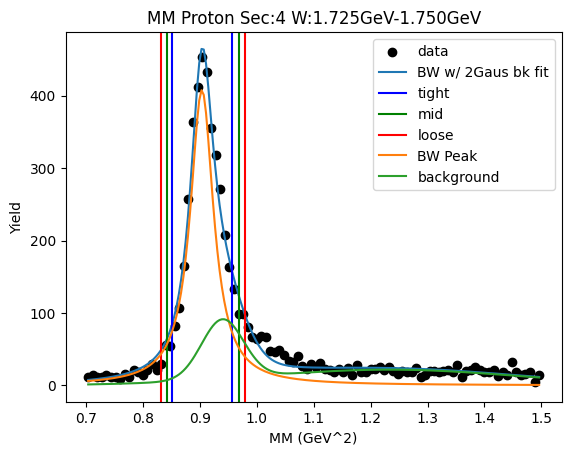

W bin: 14 1.750GeV-1.775GeV
background fit [24.96040262  1.03375428  0.04303652 24.7605668   1.34365238  0.17257878]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.90512653042649 0.9098386015275209
Breit-Wigner Peak [20.22741918  0.95261879  0.02802401]
Gaus2 [39.85754087  0.98821298  0.06514705]
Gaus3 [25.55134376  1.33653429  0.1764034 ]
Cut Bounds [[0.85157094 0.84060193 0.82970402]
 [0.96517179 0.97692295 0.98874521]]
Cut Bounds Err [[2.87751867e-06 3.43029928e-06 3.97570135e-06]
 [3.06344468e-06 3.69800059e-06 4.34004619e-06]]


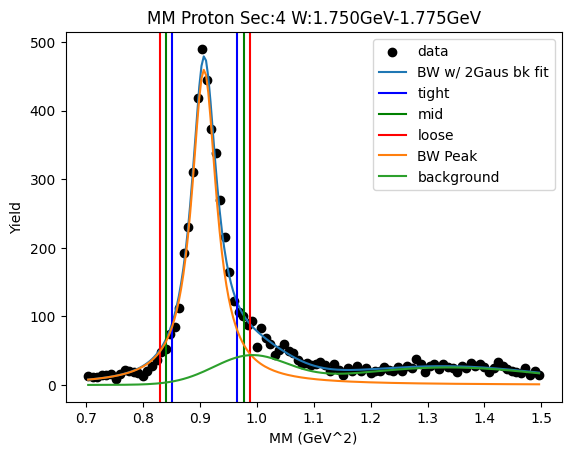

W bin: 15 1.775GeV-1.800GeV
background fit [29.41886366  1.02383824  0.05480956 29.17972202  1.39072304  0.18276523]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9037244994908995 0.9082576508476383
Breit-Wigner Peak [17.93342769  0.95183563  0.02748682]
Gaus2 [52.87998681  0.98233913  0.06346702]
Gaus3 [29.73242378  1.38075065  0.20087049]
Cut Bounds [[0.85118031 0.84042337 0.82973484]
 [0.96251195 0.97402133 0.98559912]]
Cut Bounds Err [[3.33166670e-06 3.97225227e-06 4.60444753e-06]
 [3.54285867e-06 4.27633772e-06 5.01831618e-06]]


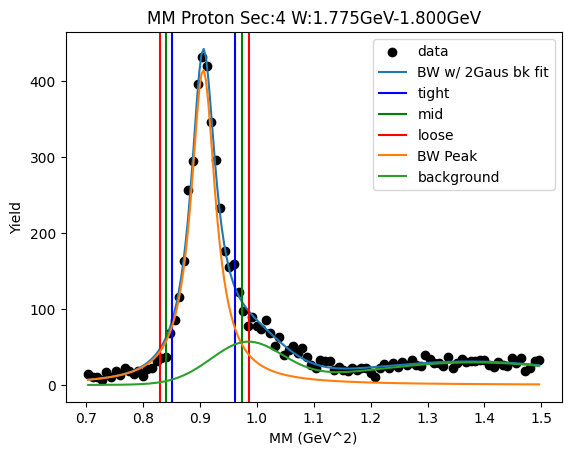

W bin: 16 1.800GeV-1.825GeV
background fit [23.17835416  1.01573462  0.05645234 29.57701922  1.36538202  0.20698281]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9009374002652437 0.9054515165376058
Breit-Wigner Peak [16.85011383  0.95036543  0.02742905]
Gaus2 [52.44761575  0.9712206   0.05784008]
Gaus3 [30.9720056   1.33956321  0.21189854]
Cut Bounds [[0.8485829  0.83786494 0.8272151 ]
 [0.95950894 0.97097619 0.98251155]]
Cut Bounds Err [[5.11976196e-06 6.10408175e-06 7.07552819e-06]
 [5.44411316e-06 6.57109313e-06 7.71113795e-06]]


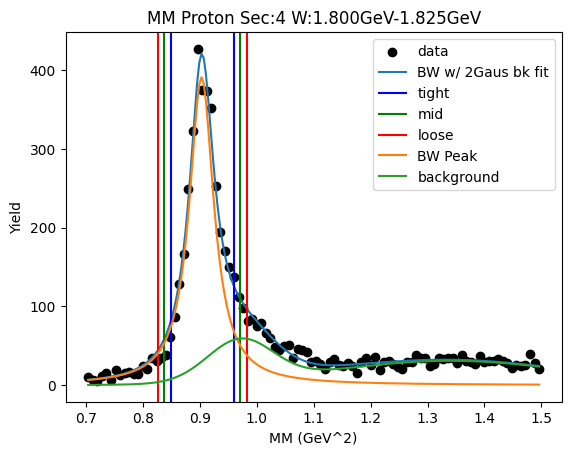

W bin: 17 1.825GeV-1.850GeV
background fit [26.94128367  1.05366116  0.05705744 34.01219419  1.36858661  0.17965914]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9017674740962596 0.9069045978010088
Breit-Wigner Peak [19.25993816  0.95096584  0.02926068]
Gaus2 [36.18238433  1.01876769  0.07707381]
Gaus3 [34.78923997  1.36576495  0.17546788]
Cut Bounds [[0.84610096 0.8346865  0.82334955]
 [0.96450907 0.97677623 0.9891209 ]]
Cut Bounds Err [[2.21520709e-06 2.63933008e-06 3.05758785e-06]
 [2.36513752e-06 2.85515411e-06 3.35128612e-06]]


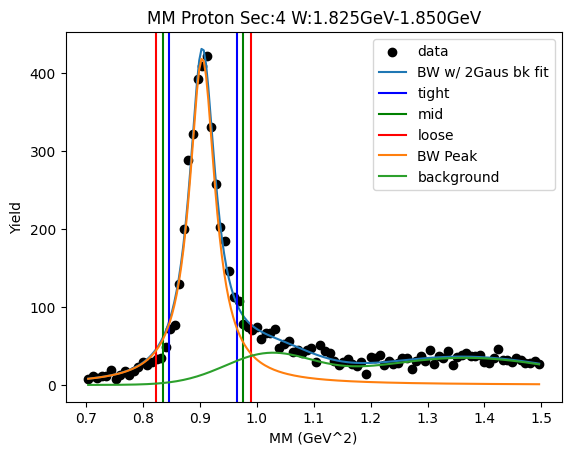

W bin: 18 1.850GeV-1.875GeV
background fit [1.79405918e+01 1.03867890e+00 3.41475221e-02 3.47189720e+01
 1.37681478e+00 2.50783284e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9025172023789003 0.9081928138386175
Breit-Wigner Peak [20.87118843  0.95150145  0.03075606]
Gaus2 [30.82359578  1.00173821  0.06733721]
Gaus3 [36.31482977  1.36030578  0.2086943 ]
Cut Bounds [[0.8441608  0.83217889 0.82028262]
 [0.96869031 0.9816143  0.99462394]]
Cut Bounds Err [[2.20626824e-06 2.62729733e-06 3.04223657e-06]
 [2.36340528e-06 2.85345690e-06 3.34996818e-06]]


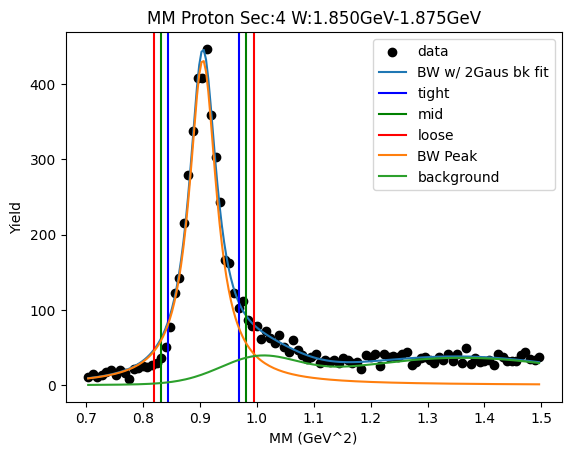

W bin: 19 1.875GeV-1.900GeV
background fit [1.90749839e+01 1.02751497e+00 3.48853361e-02 3.80549660e+01
 1.34833782e+00 2.26141982e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9004014756455768 0.9051703595826276
Breit-Wigner Peak [20.92058551  0.95015047  0.02819245]
Gaus2 [36.88290882  0.98400624  0.06238953]
Gaus3 [39.97534738  1.33772638  0.19860956]
Cut Bounds [[0.84669168 0.83568872 0.82475771]
 [0.96067919 0.97247373 0.98434023]]
Cut Bounds Err [[2.36694135e-06 2.82114509e-06 3.26927190e-06]
 [2.52123915e-06 3.04328127e-06 3.57158069e-06]]


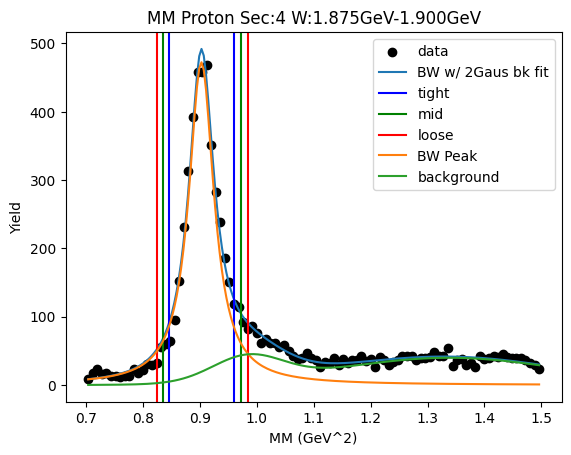

W bin: 20 1.900GeV-1.925GeV
background fit [1.53217186e+01 1.02042675e+00 3.34599488e-02 4.24194224e+01
 1.40816636e+00 2.77529695e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8997274280562579 0.9042220198552997
Breit-Wigner Peak [20.97799746  0.9497235   0.02736967]
Gaus2 [42.171068    0.96956089  0.05676901]
Gaus3 [44.20438298  1.36632466  0.22293913]
Cut Bounds [[0.84751694 0.83682885 0.82620858]
 [0.95812807 0.9695622  0.98106416]]
Cut Bounds Err [[3.65436561e-06 4.35690365e-06 5.05027982e-06]
 [3.88552388e-06 4.68972603e-06 5.50325069e-06]]


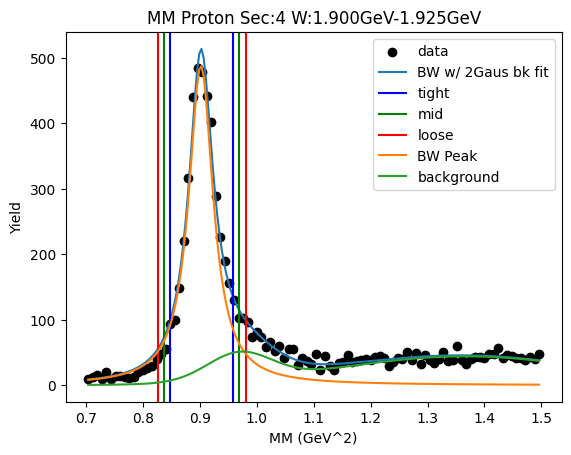

W bin: 21 1.925GeV-1.950GeV
background fit [21.36634735  1.02248092  0.0517136  48.91198907  1.4747363   0.27519086]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8989121209201412 0.9035383372224444
Breit-Wigner Peak [21.79457337  0.94932883  0.02776754]
Gaus2 [42.39236061  0.98567974  0.06452507]
Gaus3 [48.87885107  1.42722146  0.23499134]
Cut Bounds [[0.84601162 0.83517832 0.82441483]
 [0.95818405 0.96978525 0.98145624]]
Cut Bounds Err [[2.32970860e-06 2.77711033e-06 3.21860909e-06]
 [2.47935040e-06 2.99254930e-06 3.51180834e-06]]


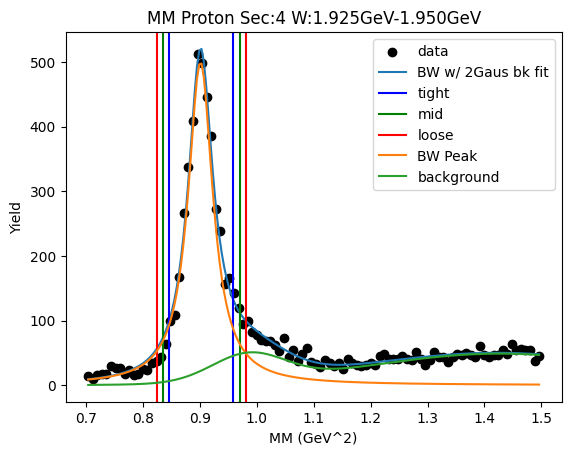

W bin: 22 1.950GeV-1.975GeV
background fit [2.74765643e+01 1.02581047e+00 4.96347458e-02 5.30193582e+01
 1.50703959e+00 2.91146630e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8978550595473628 0.9021476056303023
Breit-Wigner Peak [21.57438723  0.948684    0.02674742]
Gaus2 [51.46208342  0.98617337  0.06451936]
Gaus3 [51.96741298  1.4412289   0.23965588]
Cut Bounds [[0.84682197 0.83638041 0.82600363]
 [0.95480004 0.9659541  0.97717294]]
Cut Bounds Err [[2.91734934e-06 3.47837995e-06 4.03230549e-06]
 [3.09776589e-06 3.73812085e-06 4.38579333e-06]]


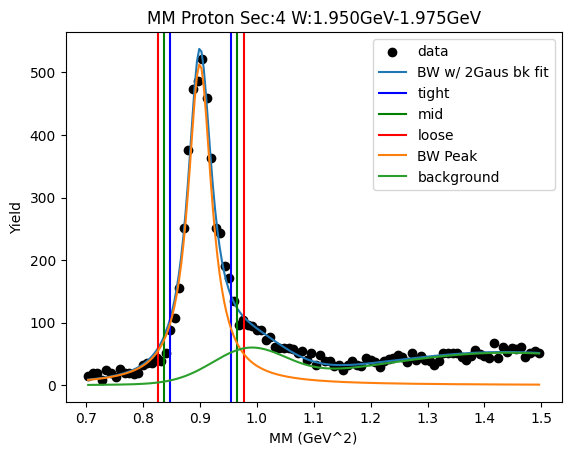

W bin: 23 1.975GeV-2.000GeV
background fit [1.78628439e+01 1.01066465e+00 4.54357512e-02 5.47529849e+01
 1.52794471e+00 3.36358534e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8969268029501255 0.9010871132953274
Breit-Wigner Peak [19.94559905  0.94815977  0.02633221]
Gaus2 [6.45131859e+01 9.56560167e-01 5.24697661e-02]
Gaus3 [52.9401673   1.43538003  0.28470652]
Cut Bounds [[0.84667011 0.83639108 0.82617482]
 [0.95291326 0.96388285 0.97491522]]
Cut Bounds Err [[4.58431463e-06 5.46735160e-06 6.33927004e-06]
 [4.86344474e-06 5.86927467e-06 6.88631206e-06]]


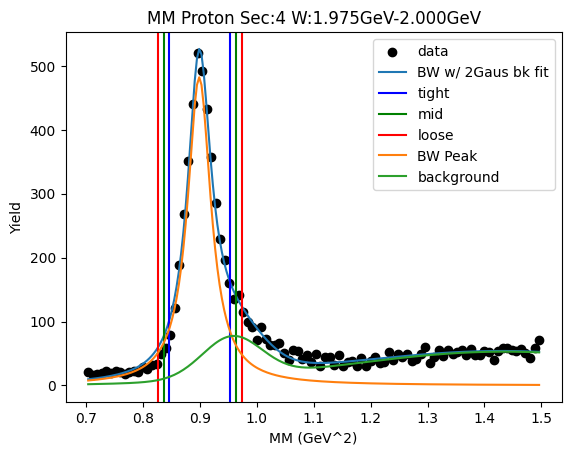

W bin: 24 2.000GeV-2.025GeV
background fit [2.70022920e+01 1.02491053e+00 2.24898412e-02 5.49260803e+01
 1.52534016e+00 3.65044652e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8956738691789413 0.9001756071779866
Breit-Wigner Peak [20.9525482   0.94758891  0.02739142]
Gaus2 [44.51954259  0.98671118  0.06403497]
Gaus3 [53.94400006  1.41694163  0.24562633]
Cut Bounds [[0.84354876 0.83287735 0.82227387]
 [0.95399898 0.96541762 0.97690418]]
Cut Bounds Err [[3.07545859e-06 3.66597410e-06 4.24884757e-06]
 [3.27060988e-06 3.94690320e-06 4.63115045e-06]]


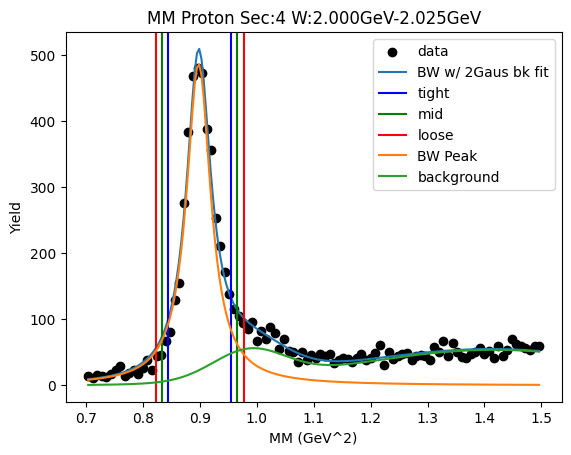

W bin: 25 2.025GeV-2.050GeV
background fit [24.02767744  1.04307926  0.06835149 55.5158406   1.42579126  0.20417228]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8964654702298771 0.9013529170955976
Breit-Wigner Peak [21.61585214  0.94810822  0.02854075]
Gaus2 [41.09305913  0.98726131  0.06868163]
Gaus3 [55.59281824  1.41910444  0.22394791]
Cut Bounds [[0.8422572  0.83114805 0.82011266]
 [0.95740495 0.96932535 0.9813195 ]]
Cut Bounds Err [[3.28165106e-06 3.91130741e-06 4.53236599e-06]
 [3.49878993e-06 4.22393805e-06 4.95785054e-06]]


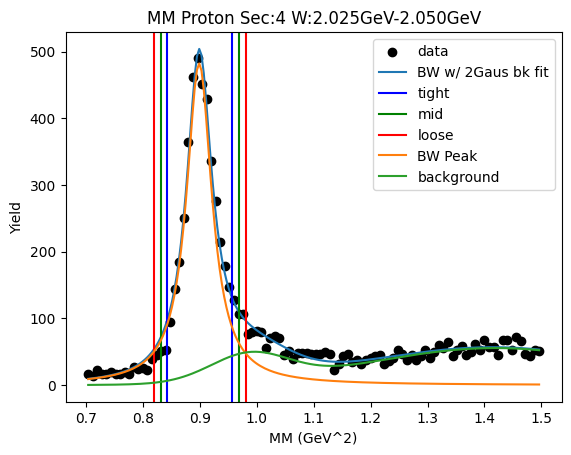

W bin: 26 2.050GeV-2.075GeV
background fit [20.05137444  1.05484383  0.05663141 54.81611194  1.49611191  0.31469578]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8962298734327059 0.900593001207763
Breit-Wigner Peak [20.25417765  0.94784568  0.02696642]
Gaus2 [35.43848338  1.00200724  0.07730113]
Gaus3 [54.39355467  1.4499518   0.27664021]
Cut Bounds [[0.84485143 0.83433694 0.82388829]
 [0.95361742 0.96485613 0.97616068]]
Cut Bounds Err [[1.84729965e-06 2.20253316e-06 2.55320926e-06]
 [1.96261116e-06 2.36855241e-06 2.77915583e-06]]


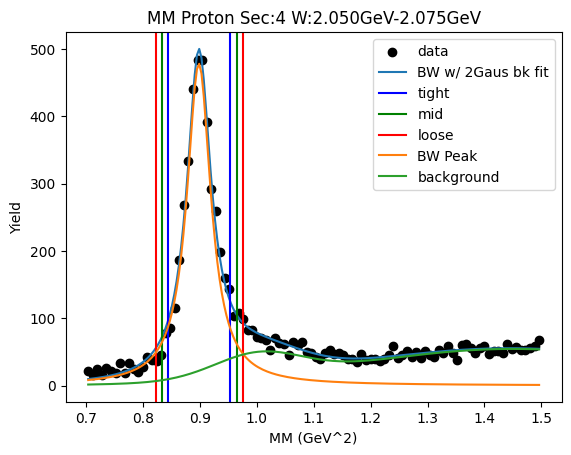

W bin: 27 2.075GeV-2.100GeV
background fit [2.01783212e+01 1.01622734e+00 3.11339399e-02 5.48148265e+01
 1.44867166e+00 2.92864432e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8953865284670783 0.899695192425261
Breit-Wigner Peak [20.01972338  0.94738633  0.02679759]
Gaus2 [42.73787233  0.97518069  0.05801703]
Gaus3 [55.48539704  1.40624692  0.24880773]
Cut Bounds [[0.84433726 0.83389159 0.82351093]
 [0.95236988 0.96353074 0.97475661]]
Cut Bounds Err [[3.44556197e-06 4.10782466e-06 4.76170434e-06]
 [3.65935814e-06 4.41560167e-06 5.18054960e-06]]


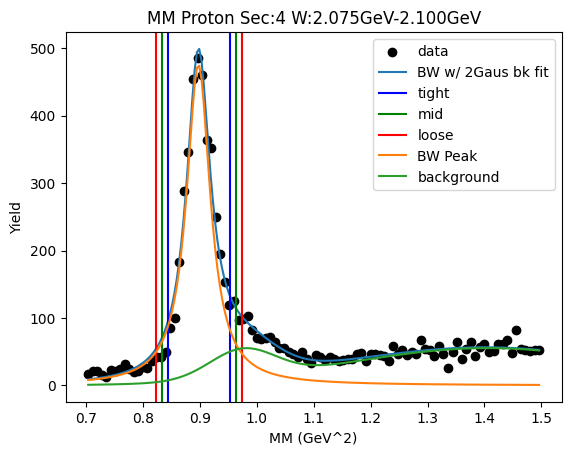

W bin: 28 2.100GeV-2.125GeV
background fit [20.29779537  1.0448717   0.06374028 58.05324216  1.45414858  0.24350022]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8944563686013853 0.8992088162055951
Breit-Wigner Peak [19.79829234  0.94701246  0.02814382]
Gaus2 [39.95149439  0.97943591  0.06639167]
Gaus3 [57.97445393  1.43773933  0.25681702]
Cut Bounds [[0.84102146 0.83007437 0.819199  ]
 [0.95443656 0.96617249 0.97798014]]
Cut Bounds Err [[4.62042885e-06 5.50762647e-06 6.38285375e-06]
 [4.92212095e-06 5.94200905e-06 6.97405236e-06]]


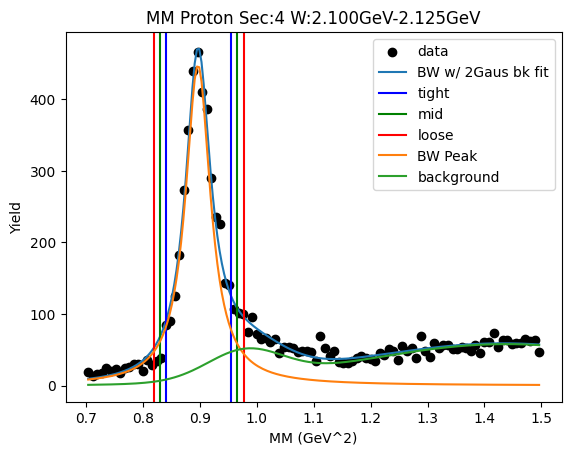

0.892547971148431 0.8997489819843303
Breit-Wigner Peak [5.07180785e+02 9.46651191e-01 3.46434478e-02]
Gaus2 [1.23161118e+03 9.60306124e-01 6.07185946e-02]
Gaus3 [1.86442075e+03 1.49274537e+00 3.19878331e-01]


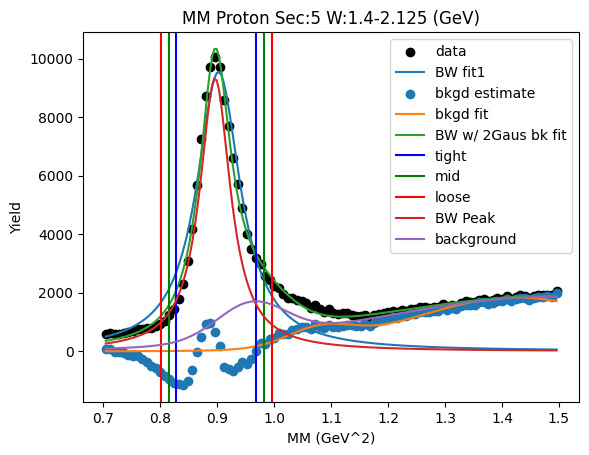

W bin: 0 1.400GeV-1.425GeV
Cut Bounds [[0.81903132 0.80111143 0.78338974]
 [1.00913198 1.02923222 1.04953067]]
Cut Bounds Err [[1.59946333e-05 1.89441894e-05 2.18290862e-05]
 [1.77540737e-05 2.14726799e-05 2.52664474e-05]]


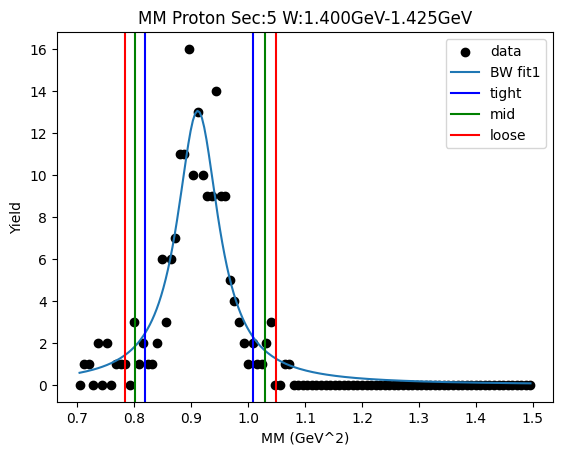

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.79731377 0.77627022 0.75550809]
 [1.02322792 1.04736719 1.07178789]]
Cut Bounds Err [[3.01923869e-05 3.56791727e-05 4.10163526e-05]
 [3.42033784e-05 4.14436307e-05 4.88530746e-05]]


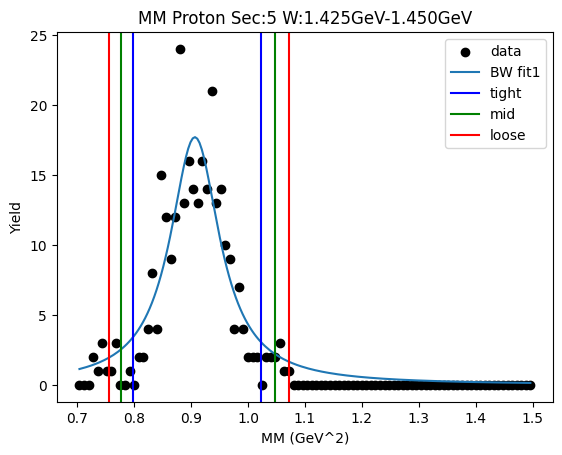

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.82041803 0.80141983 0.78264418]
 [1.02264043 1.04408671 1.06575554]]
Cut Bounds Err [[1.54414762e-05 1.82771906e-05 2.10465171e-05]
 [1.72398188e-05 2.08616033e-05 2.45599148e-05]]


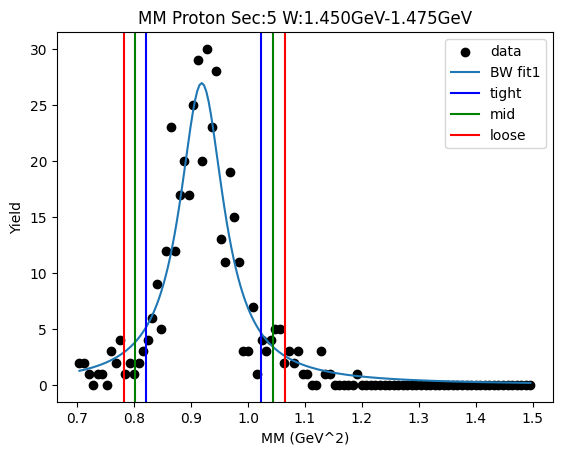

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.83064916 0.81418311 0.7978819 ]
 [1.00437603 1.02265535 1.04109951]]
Cut Bounds Err [[5.71556049e-06 6.77655659e-06 7.81681474e-06]
 [6.28489720e-06 7.59473581e-06 8.92907834e-06]]


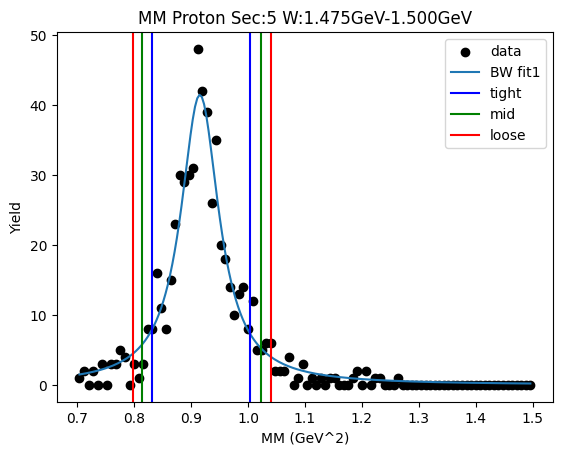

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.82487677 0.80828873 0.79186918]
 [1.000024   1.01846541 1.03707531]]
Cut Bounds Err [[5.16797377e-06 6.12645099e-06 7.06587707e-06]
 [5.69024514e-06 6.87699715e-06 8.08620048e-06]]


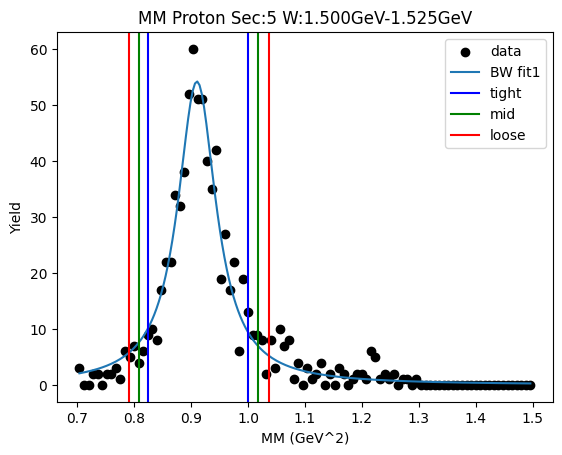

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.82264914 0.80401715 0.78559857]
 [1.02070721 1.04168682 1.06287986]]
Cut Bounds Err [[5.40000002e-06 6.39330486e-06 7.36394658e-06]
 [6.01501933e-06 7.27715029e-06 8.56549324e-06]]


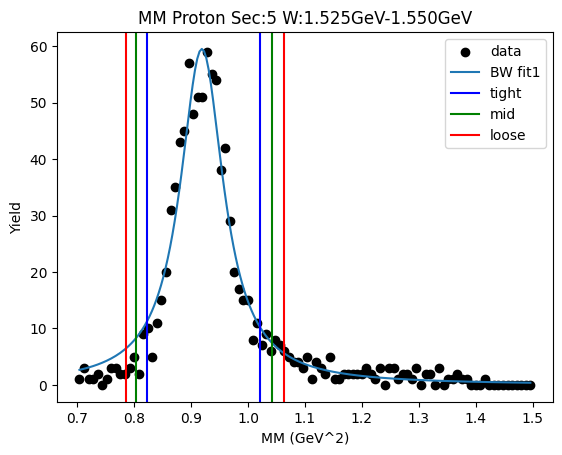

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.82661724 0.80920488 0.79197786]
 [1.01093517 1.03038639 1.05002296]]
Cut Bounds Err [[5.84411035e-06 6.92463774e-06 7.98250166e-06]
 [6.46290587e-06 7.81390037e-06 9.19140483e-06]]


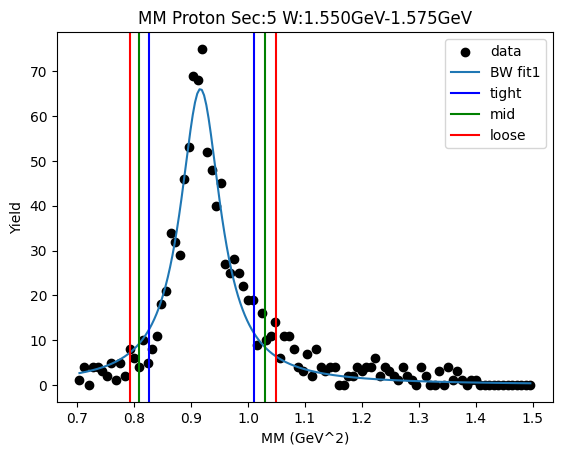

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.82521328 0.807452   0.78988394]
 [1.01345354 1.03334031 1.0534203 ]]
Cut Bounds Err [[4.75711514e-06 5.63536351e-06 6.49472469e-06]
 [5.27184316e-06 6.37507451e-06 7.50032268e-06]]


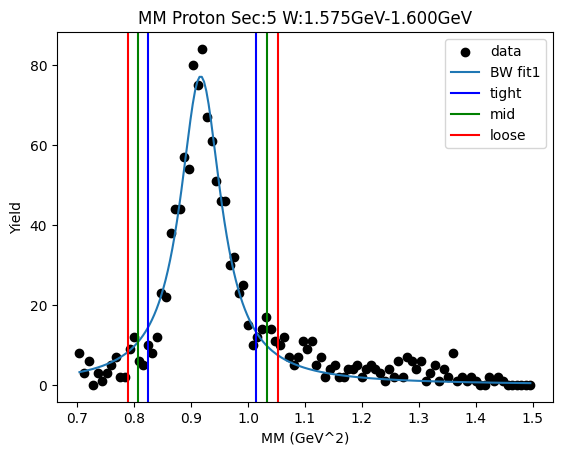

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.82607836 0.80826217 0.7906402 ]
 [1.01492255 1.03487519 1.05502206]]
Cut Bounds Err [[5.66354875e-06 6.70898850e-06 7.73189274e-06]
 [6.27761201e-06 7.59145303e-06 8.93155640e-06]]


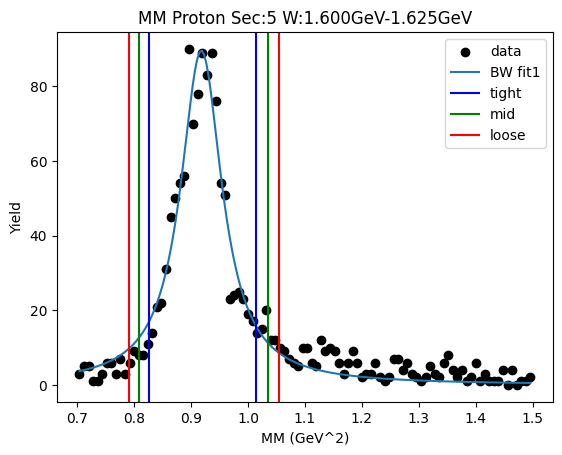

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.82130437 0.80399349 0.78686699]
 [1.00455415 1.02389323 1.04341669]]
Cut Bounds Err [[3.89858745e-06 4.61938866e-06 5.32505906e-06]
 [4.31163403e-06 5.21297418e-06 6.13200719e-06]]


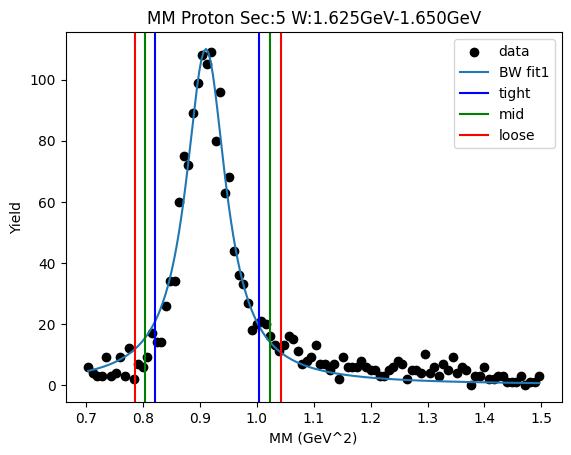

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.81844933 0.80043592 0.78262294]
 [1.00960783 1.02982611 1.05024484]]
Cut Bounds Err [[4.85792809e-06 5.75339879e-06 6.62910385e-06]
 [5.39549802e-06 6.52594101e-06 7.67933851e-06]]


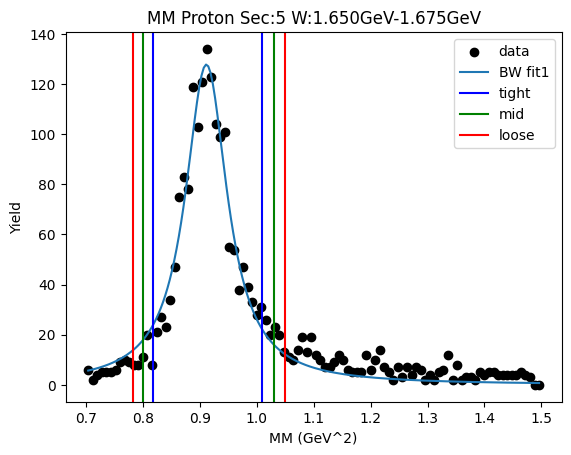

W bin: 11 1.675GeV-1.700GeV
background fit [4.40014546 1.03004045 0.02404128 6.17990988 1.27601933 0.16591071]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8957153843758577 0.905392715797349
Breit-Wigner Peak [9.11882035 0.94897526 0.04016078]
Gaus2 [27.02404741  0.94        0.04811656]
Gaus3 [7.82999628 1.21738205 0.18100755]
Cut Bounds [[0.82129092 0.80587638 0.79060787]
 [0.9834679  1.00048876 1.01765564]]
Cut Bounds Err [[9.04317402e-06 1.07081063e-05 1.23449537e-05]
 [9.89583561e-06 1.19312121e-05 1.40058452e-05]]


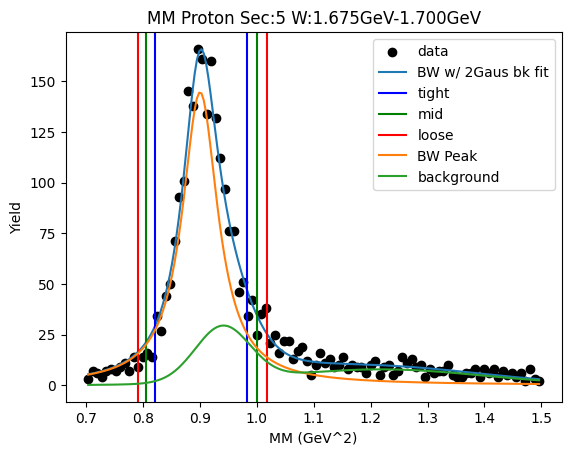

W bin: 12 1.700GeV-1.725GeV
background fit [2.57049544 1.02745814 0.0431145  8.51199528 1.3174386  0.17537758]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8976172990661315 0.9067979674371491
Breit-Wigner Peak [11.94560181  0.94984611  0.03911664]
Gaus2 [30.89798227  0.94        0.04885777]
Gaus3 [9.734313   1.27851876 0.18435509]
Cut Bounds [[0.82488657 0.80983797 0.79492789]
 [0.98299205 0.99956454 1.01627556]]
Cut Bounds Err [[5.95636276e-06 7.05519224e-06 8.13609677e-06]
 [6.50218055e-06 7.83817951e-06 9.19936770e-06]]


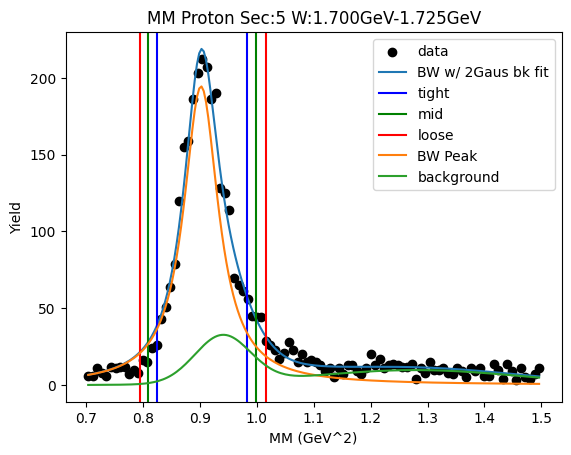

W bin: 13 1.725GeV-1.750GeV
background fit [ 4.5845018   1.03875366  0.04598831 11.60270086  1.35505138  0.22117789]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9013720628592751 0.9086236827534458
Breit-Wigner Peak [12.80493488  0.95131376  0.03476497]
Gaus2 [34.15187861  0.94        0.05047479]
Gaus3 [13.0053493   1.29141375  0.22728418]
Cut Bounds [[0.83599889 0.82252737 0.80916527]
 [0.97673249 0.99140769 1.00619232]]
Cut Bounds Err [[1.05696457e-05 1.25791606e-05 1.45547347e-05]
 [1.14247156e-05 1.38102845e-05 1.62302860e-05]]


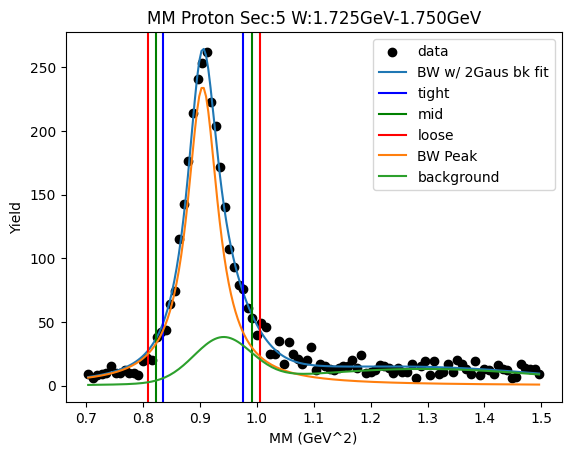

W bin: 14 1.750GeV-1.775GeV
background fit [ 9.67584337  1.06350857  0.04357131 14.34328668  1.36242603  0.16176407]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9041907392612889 0.9136974569308116
Breit-Wigner Peak [14.73925067  0.9533856   0.03980519]
Gaus2 [19.11952812  0.98448884  0.07154947]
Gaus3 [14.76396584  1.34906878  0.18420423]
Cut Bounds [[0.82999325 0.81463344 0.79941709]
 [0.9914813  1.00841911 1.02550037]]
Cut Bounds Err [[1.09848605e-05 1.30577958e-05 1.50901047e-05]
 [1.20060330e-05 1.45281157e-05 1.70912351e-05]]


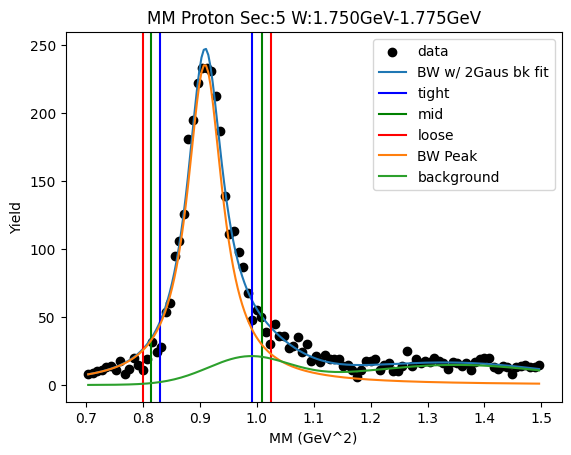

W bin: 15 1.775GeV-1.800GeV
background fit [12.12333492  1.05010592  0.03405951 17.82168556  1.37189311  0.16258126]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9015670374216107 0.9115559114387342
Breit-Wigner Peak [13.38344728  0.95213522  0.04080211]
Gaus2 [29.46894299  0.97284107  0.06700149]
Gaus3 [18.40455577  1.35963843  0.19087937]
Cut Bounds [[0.82578788 0.81008535 0.79453355]
 [0.99110332 1.00846388 1.02597516]]
Cut Bounds Err [[1.46769235e-05 1.74405027e-05 2.01485219e-05]
 [1.60790447e-05 1.94591463e-05 2.28957828e-05]]


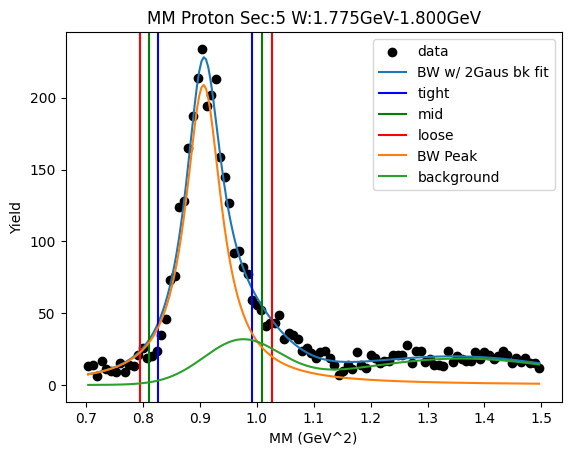

W bin: 16 1.800GeV-1.825GeV
background fit [8.25712005e+00 1.09050510e+00 5.43569446e-03 1.85093310e+01
 1.43596183e+00 2.90296229e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9039758127811236 0.9148334297035511
Breit-Wigner Peak [15.26037124  0.95362709  0.04253943]
Gaus2 [8.13012089e+00 1.09010070e+00 5.63043324e-03]
Gaus3 [18.76712169  1.35311476  0.26543367]
Cut Bounds [[0.82514038 0.80877905 0.79258155]
 [0.99776484 1.0159284  1.03425581]]
Cut Bounds Err [[5.60971403e-06 6.66191068e-06 7.69214623e-06]
 [6.16866096e-06 7.46647150e-06 8.78697792e-06]]


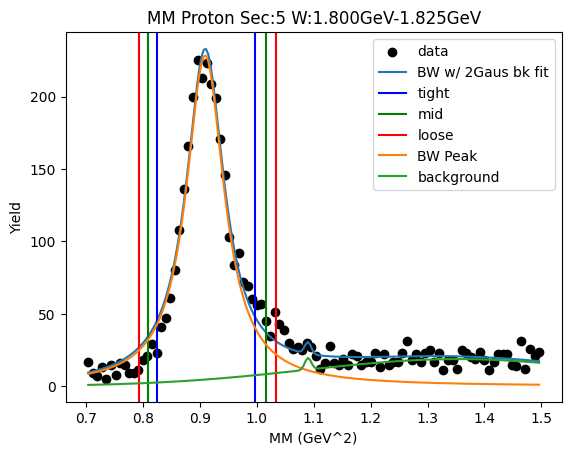

W bin: 17 1.825GeV-1.850GeV
background fit [12.54128003  1.07886798  0.0435963  22.31600385  1.36279356  0.18772819]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9021708782533558 0.9112725451260025
Breit-Wigner Peak [14.84115403  0.95221936  0.03894797]
Gaus2 [17.36972767  1.02881116  0.08457376]
Gaus3 [22.75909313  1.36442561  0.18924282]
Cut Bounds [[0.82952995 0.81450363 0.79961464]
 [0.98734703 1.00388412 1.02055855]]
Cut Bounds Err [[5.05935915e-06 6.01296273e-06 6.94859777e-06]
 [5.51968616e-06 6.67549988e-06 7.85011042e-06]]


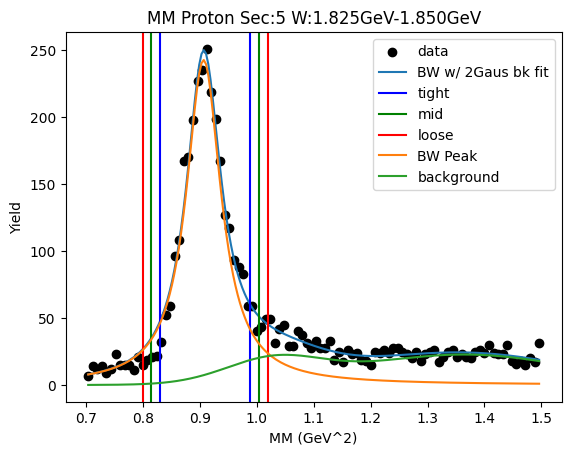

W bin: 18 1.850GeV-1.875GeV
background fit [12.7086728   1.0594548   0.04150552 25.04162207  1.33425509  0.18345216]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8991591426801395 0.9064035877778018
Breit-Wigner Peak [14.22722075  0.95014808  0.03474777]
Gaus2 [22.13737027  0.99186063  0.0723437 ]
Gaus3 [25.775293    1.32393893  0.19630811]
Cut Bounds [[0.83390203 0.82045411 0.80711551]
 [0.97439363 0.98904404 1.00380376]]
Cut Bounds Err [[7.80001824e-06 9.28271818e-06 1.07403796e-05]
 [8.43150926e-06 1.01919159e-05 1.19777762e-05]]


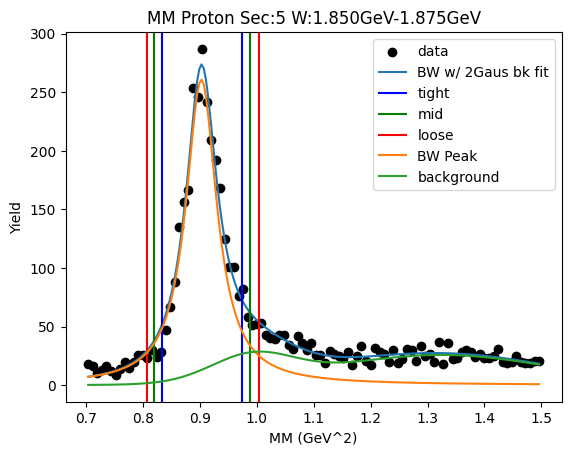

W bin: 19 1.875GeV-1.900GeV
background fit [1.47679569e+01 1.07833534e+00 8.89521877e-03 2.62993444e+01
 1.38612946e+00 2.51296163e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.9006042334013429 0.9088190488608521
Breit-Wigner Peak [16.48238185  0.95116331  0.03700184]
Gaus2 [1.44228046e+01 1.07803642e+00 8.32639516e-03]
Gaus3 [26.57528645  1.35551813  0.2767421 ]
Cut Bounds [[0.83137861 0.81708388 0.80291311]
 [0.98114367 0.99680195 1.0125842 ]]
Cut Bounds Err [[2.13984723e-06 2.54448934e-06 2.94190972e-06]
 [2.32460758e-06 2.81042341e-06 3.30377634e-06]]


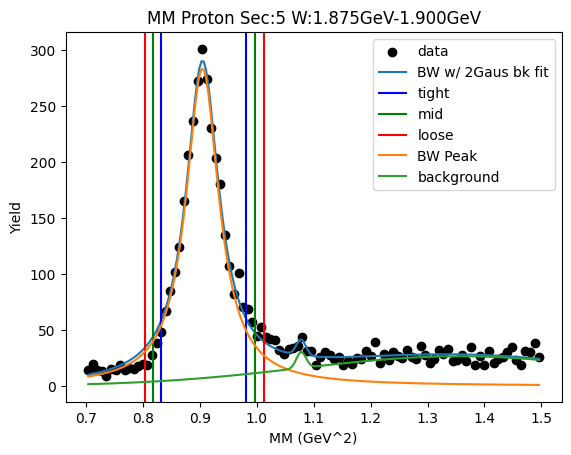

W bin: 20 1.900GeV-1.925GeV
background fit [1.56937195e+01 1.08000994e+00 2.14941005e-03 2.96495242e+01
 1.39552794e+00 2.75982428e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8968992658266238 0.9060911587043955
Breit-Wigner Peak [17.60254975  0.94947102  0.03914054]
Gaus2 [1.43089854e+01 1.15850020e+00 2.07215532e-03]
Gaus3 [30.48068852  1.34052447  0.26535379]
Cut Bounds [[0.8241592  0.8091081  0.79419572]
 [0.98229882 0.99887565 1.01559119]]
Cut Bounds Err [[6.68681295e-06 7.94673228e-06 9.18267916e-06]
 [7.30021132e-06 8.82959982e-06 1.03840101e-05]]


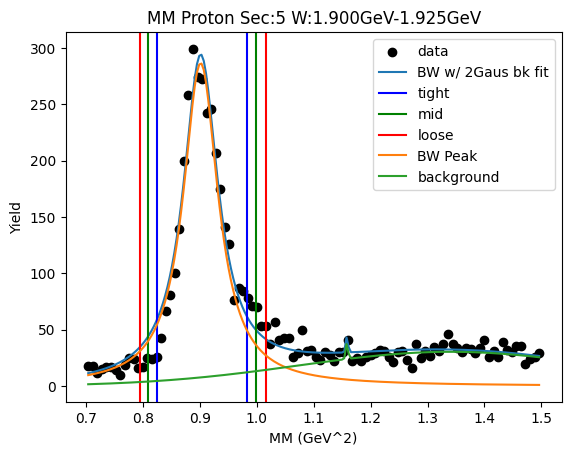

W bin: 21 1.925GeV-1.950GeV
background fit [11.49154847 19.25797581  3.40061816 50.6071684   2.29558236  0.8973309 ]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8970809622548108 0.9038031088010903
Breit-Wigner Peak [16.73739609  0.94891624  0.03347175]
Gaus2 [12.42238947 11.48486264  0.65667186]
Gaus3 [31.90350419  1.33788396  0.31207081]
Cut Bounds [[0.83413151 0.82117371 0.80831735]
 [0.96928846 0.98336205 0.99753708]]
Cut Bounds Err [[3.86329953e-06 4.59726169e-06 5.31954158e-06]
 [4.16454577e-06 5.03081595e-06 5.90945979e-06]]


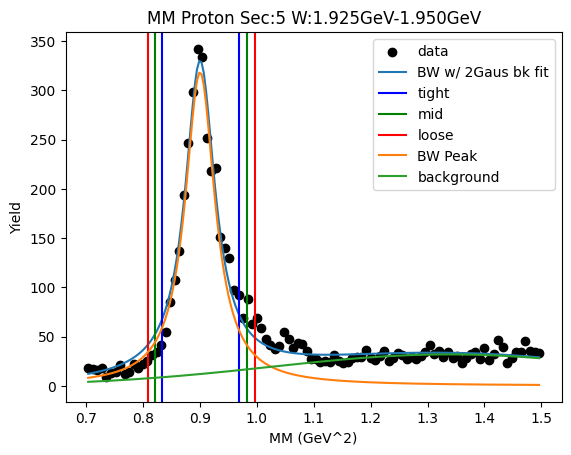

W bin: 22 1.950GeV-1.975GeV
background fit [12.42238947  6.92734311  0.09014865 33.21161529  1.45187954  0.30826944]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8973893369636782 0.9061662614854854
Breit-Wigner Peak [18.61631978  0.94961982  0.03824684]
Gaus2 [14.61334257  4.60046936  0.08382988]
Gaus3 [33.16495204  1.38268052  0.28606733]
Cut Bounds [[0.82615682 0.81142995 0.79683552]
 [0.98070983 0.99689356 1.01320973]]
Cut Bounds Err [[4.27112850e-06 5.07691806e-06 5.86778534e-06]
 [4.65352075e-06 5.62728658e-06 6.61667116e-06]]


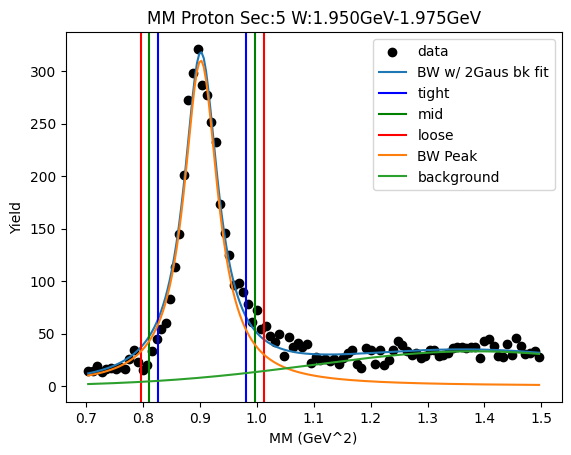

W bin: 23 1.975GeV-2.000GeV
background fit [14.42439367 83.236118   13.61881219 38.74644551  1.54478344  0.35934991]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8965502878916989 0.905422089145375
Breit-Wigner Peak [18.58132591  0.94920292  0.038453  ]
Gaus2 [1.25856277e-02 2.88848606e+01 1.75223952e+00]
Gaus3 [36.27678209  1.42029586  0.3219133 ]
Cut Bounds [[0.82500066 0.81020518 0.79554357]
 [0.98031855 0.99658665 1.01298861]]
Cut Bounds Err [[4.45617805e-06 5.29673509e-06 6.12160470e-06]
 [4.85756921e-06 5.87446441e-06 6.90773358e-06]]


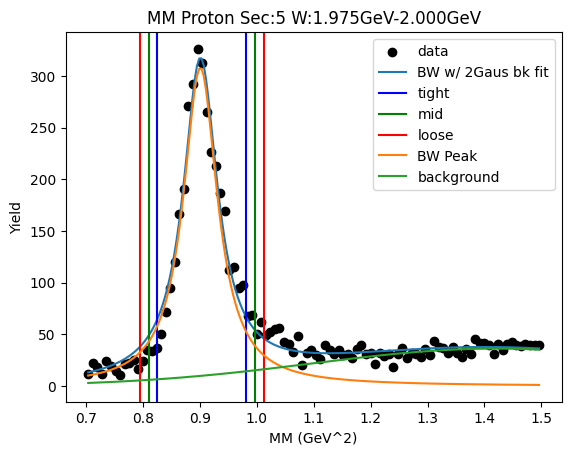

W bin: 24 2.000GeV-2.025GeV
background fit [  0.18181559 104.02438008   8.63420273  54.00435636   1.9890678
   0.64246764]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8950681893226343 0.9024520662603176
Breit-Wigner Peak [18.42942839  0.9480296   0.03508057]
Gaus2 [114.02010573 212.57075095  17.29409597]
Gaus3 [36.16477286  1.40370366  0.32444973]
Cut Bounds [[0.82939243 0.81585316 0.8024253 ]
 [0.97091335 0.98567826 1.00055459]]
Cut Bounds Err [[3.55988683e-06 4.23459317e-06 4.89795687e-06]
 [3.85164626e-06 4.65450265e-06 5.46931634e-06]]


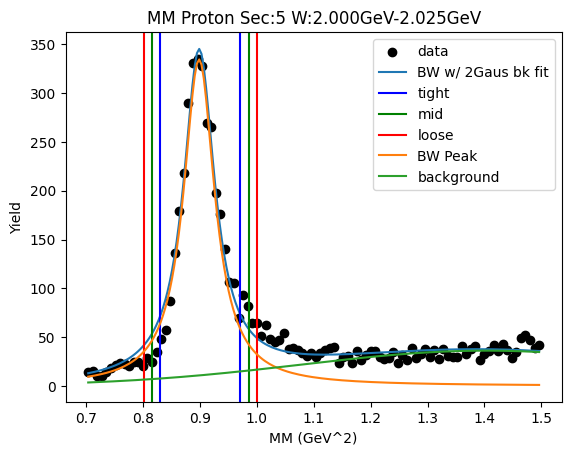

W bin: 25 2.025GeV-2.050GeV
background fit [103.90615841 454.48589323  77.78037145  50.81001642   1.74277961
   0.48722783]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.894117938808318 0.9013785047415788
Breit-Wigner Peak [17.08249199  0.94749576  0.03478641]
Gaus2 [103.31387201 907.82313503  68.3691995 ]
Gaus3 [41.05595852  1.46323616  0.36319185]
Cut Bounds [[0.82899012 0.81556718 0.8022538 ]
 [0.96924534 0.98387344 0.9986111 ]]
Cut Bounds Err [[4.63650951e-06 5.51551149e-06 6.37988245e-06]
 [5.01341133e-06 6.05794802e-06 7.11795079e-06]]


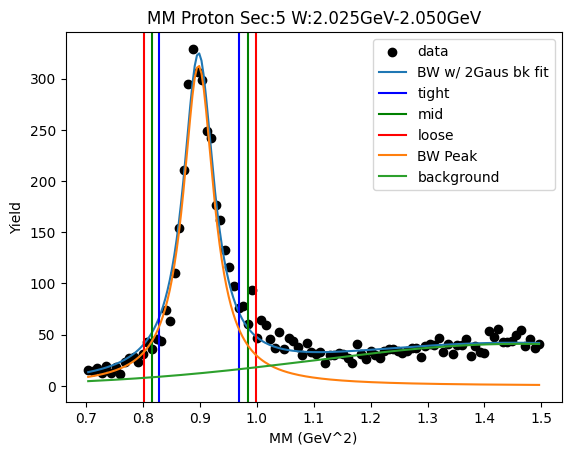

W bin: 26 2.050GeV-2.075GeV
background fit [2.10180416e+02 6.83274685e+02 7.64354943e+01 7.30261895e+01
 2.07637619e+00 6.25482732e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8950353914781138 0.9020158623625388
Breit-Wigner Peak [16.10736091  0.94790592  0.03410882]
Gaus2 [ 491.12665892 1322.70590901   81.40131162]
Gaus3 [43.6390096   1.53609695  0.43518612]
Cut Bounds [[0.83105091 0.81787196 0.80479835]
 [0.96863369 0.98297131 0.99741426]]
Cut Bounds Err [[3.91623653e-06 4.65918326e-06 5.39007705e-06]
 [4.22799910e-06 5.10784316e-06 6.00052459e-06]]


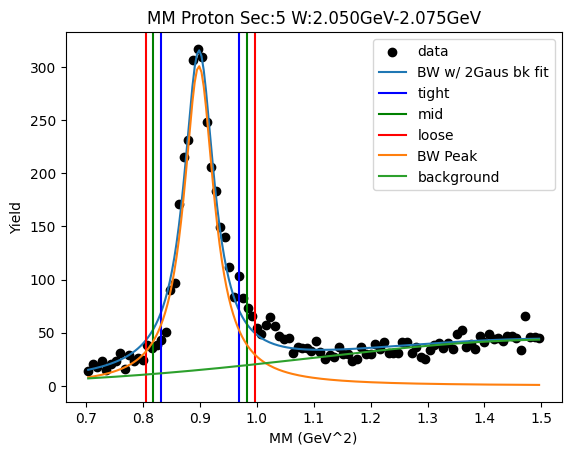

W bin: 27 2.075GeV-2.100GeV
background fit [1.17886043e+04 7.21096736e+03 2.62993387e+02 5.41163130e+01
 1.70839101e+00 4.69597489e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8931079235683478 0.8997654334702311
Breit-Wigner Peak [16.43122617  0.9468034   0.03331043]
Gaus2 [1010.18577627 9875.68097123  891.11425078]
Gaus3 [45.76816565  1.5072147   0.41247894]
Cut Bounds [[0.83058939 0.81772131 0.80495369]
 [0.96479548 0.97876862 0.99284222]]
Cut Bounds Err [[2.86832946e-06 3.41311394e-06 3.94928096e-06]
 [3.09138770e-06 3.73411895e-06 4.38604115e-06]]


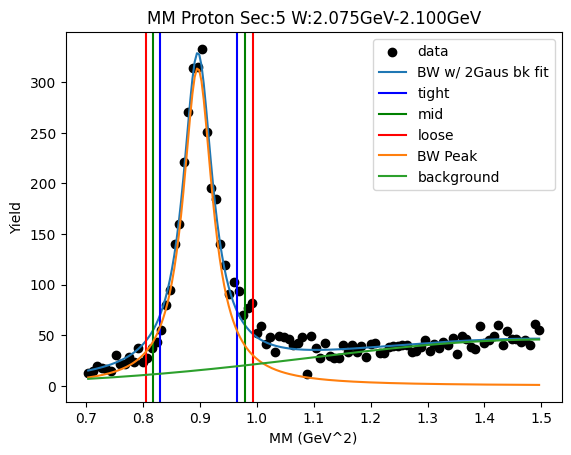

W bin: 28 2.100GeV-2.125GeV
background fit [3.14224647e+03 5.30323864e+04 3.80298796e+03 4.53099195e+01
 1.47675976e+00 3.06832370e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8939444101199467 0.902338728077642
Breit-Wigner Peak [17.90621768  0.94770331  0.03740392]
Gaus2 [  7354.64169341 136575.42849963    705.04511984]
Gaus3 [44.40576749  1.42844168  0.32215604]
Cut Bounds [[0.82430404 0.80991654 0.79565571]
 [0.97514581 0.99092666 1.00683418]]
Cut Bounds Err [[4.06070142e-06 4.82771030e-06 5.58083501e-06]
 [4.41664124e-06 5.34000697e-06 6.27791698e-06]]


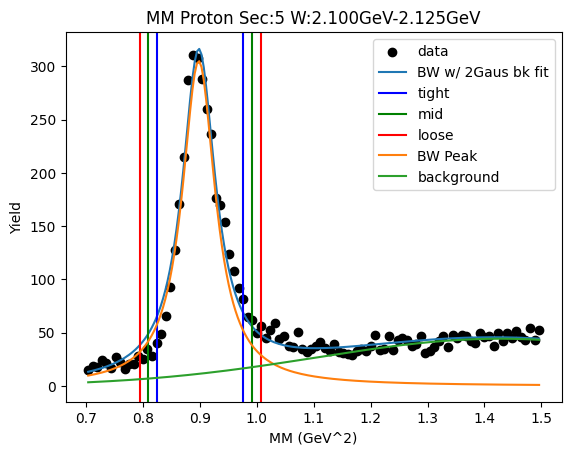

0.8932957457614312 0.8984917907630376
Breit-Wigner Peak [5.74961848e+02 9.46516650e-01 2.94280054e-02]
Gaus2 [1.28377258e+03 9.70845700e-01 6.36582573e-02]
Gaus3 [1.89797367e+03 1.46141692e+00 2.77370963e-01]


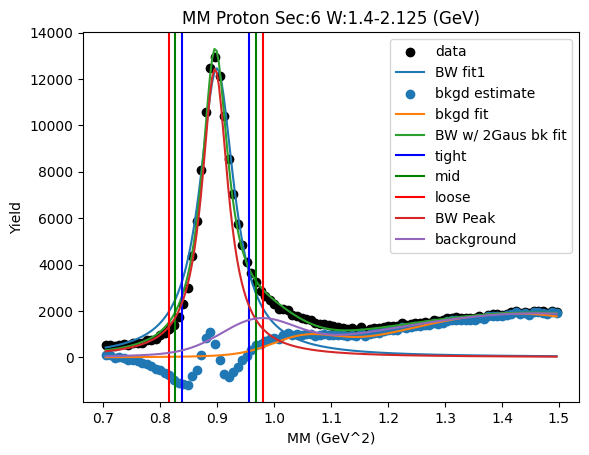

W bin: 0 1.400GeV-1.425GeV
Cut Bounds [[0.8383381  0.82642984 0.81460677]
 [0.96210565 0.97495091 0.98788135]]
Cut Bounds Err [[5.22893746e-06 6.21717604e-06 7.19232938e-06]
 [5.60164045e-06 6.75276356e-06 7.92041530e-06]]


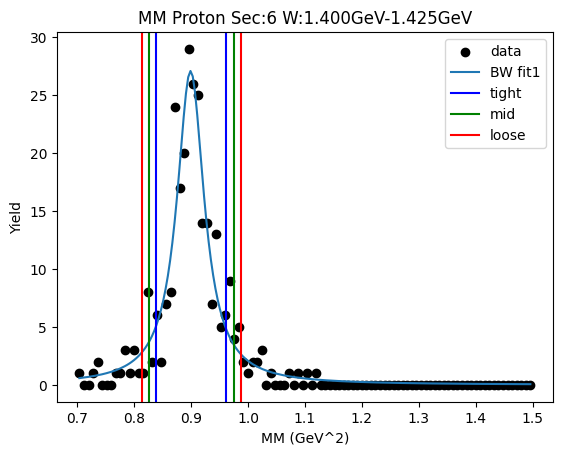

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.84357211 0.8312584  0.81903522]
 [0.97168858 0.98499816 0.99839828]]
Cut Bounds Err [[2.75115356e-06 3.27045437e-06 3.78265528e-06]
 [2.95268607e-06 3.56006380e-06 4.17635481e-06]]


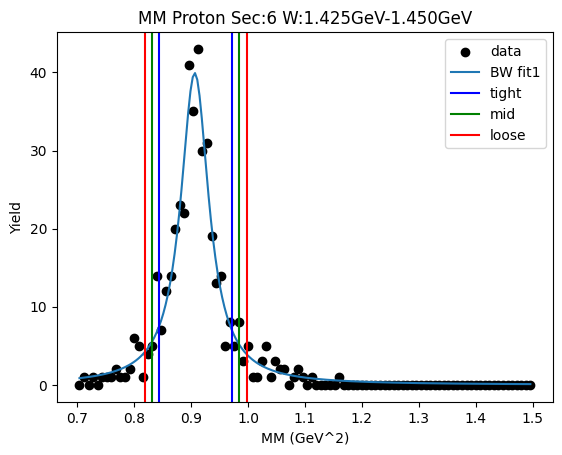

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.83311752 0.81969124 0.80637403]
 [0.97337903 0.98800505 1.00274014]]
Cut Bounds Err [[5.00316322e-06 5.94301665e-06 6.86843588e-06]
 [5.40794827e-06 6.52471251e-06 7.65920654e-06]]


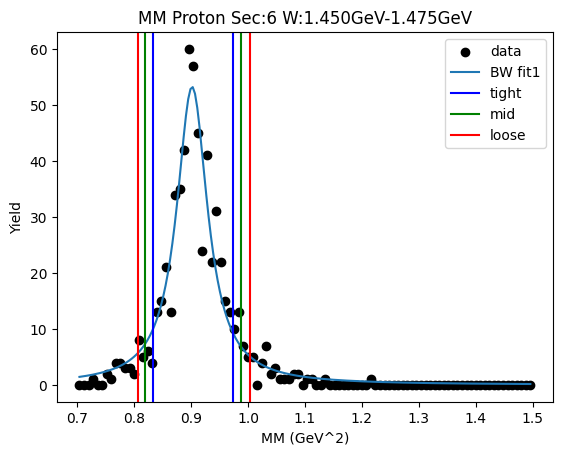

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.8402023  0.82783626 0.81556189]
 [0.96890498 0.98227947 0.99574564]]
Cut Bounds Err [[2.18401483e-06 2.59610818e-06 3.00251217e-06]
 [2.34533153e-06 2.82792636e-06 3.31764964e-06]]


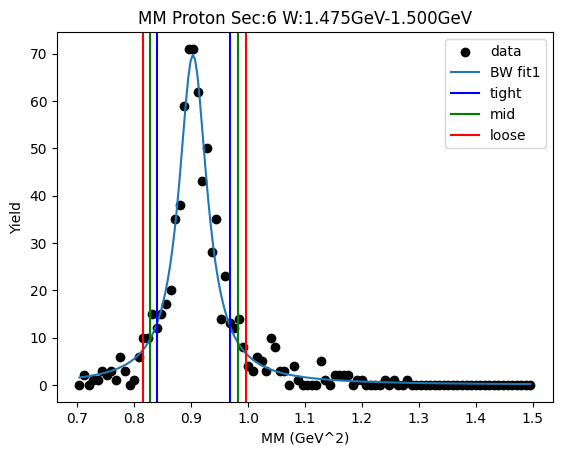

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.835451   0.82228838 0.80923027]
 [0.97282554 0.98713782 1.00155462]]
Cut Bounds Err [[2.58738814e-06 3.07398992e-06 3.55331413e-06]
 [2.79202031e-06 3.36805565e-06 3.95307326e-06]]


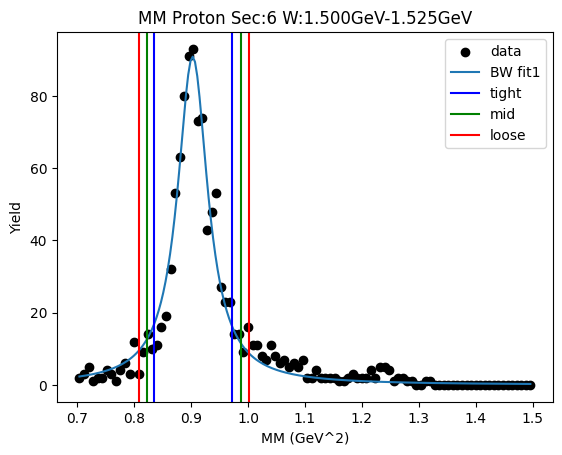

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.8297293  0.81547525 0.80134471]
 [0.97906221 0.99467475 1.01041079]]
Cut Bounds Err [[2.89839299e-06 3.44102065e-06 3.97466850e-06]
 [3.14843117e-06 3.80033983e-06 4.46313695e-06]]


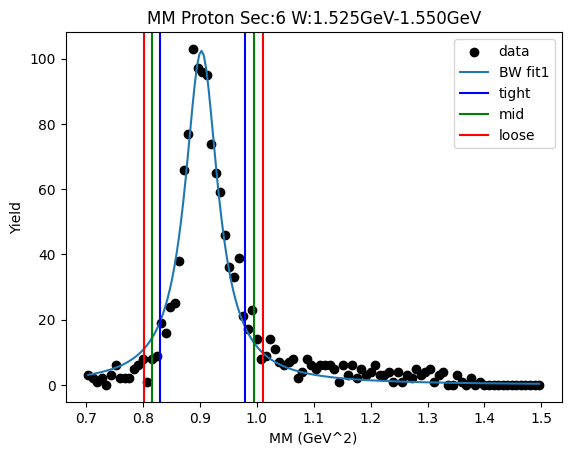

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.83356557 0.81966167 0.8058747 ]
 [0.97903604 0.99422624 1.00953337]]
Cut Bounds Err [[2.64434945e-06 3.14020139e-06 3.62812564e-06]
 [2.86581600e-06 3.45846034e-06 4.06077472e-06]]


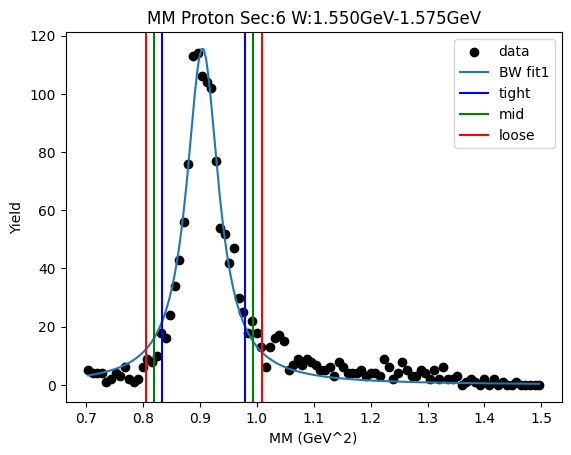

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.8363818  0.82362422 0.81096469]
 [0.96935015 0.98318624 0.99712038]]
Cut Bounds Err [[2.79522784e-06 3.32175624e-06 3.84070327e-06]
 [3.00922920e-06 3.62928523e-06 4.25876405e-06]]


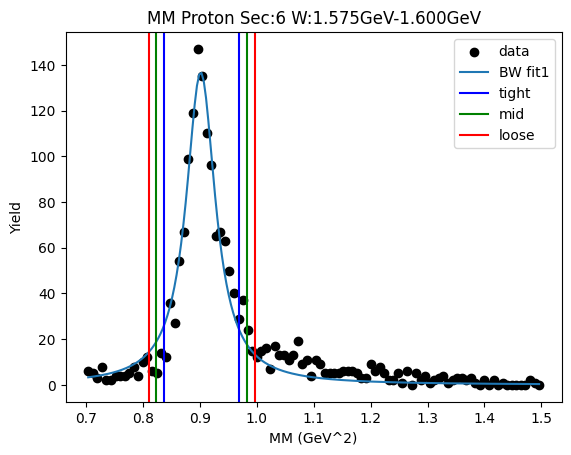

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.83286352 0.81910295 0.80545701]
 [0.9767736  0.99179505 1.00693112]]
Cut Bounds Err [[3.41419625e-06 4.05472918e-06 4.68513433e-06]
 [3.69741771e-06 4.46173296e-06 5.23842518e-06]]


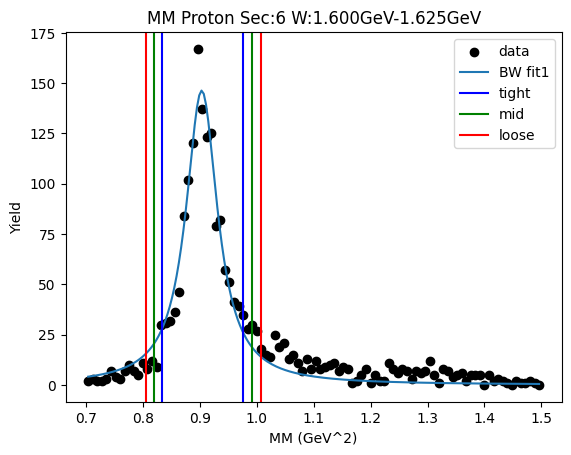

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.83189742 0.81846398 0.80513989]
 [0.9722458  0.98688204 1.00162763]]
Cut Bounds Err [[2.24291791e-06 2.66421205e-06 3.07902071e-06]
 [2.42474755e-06 2.92551027e-06 3.43423560e-06]]


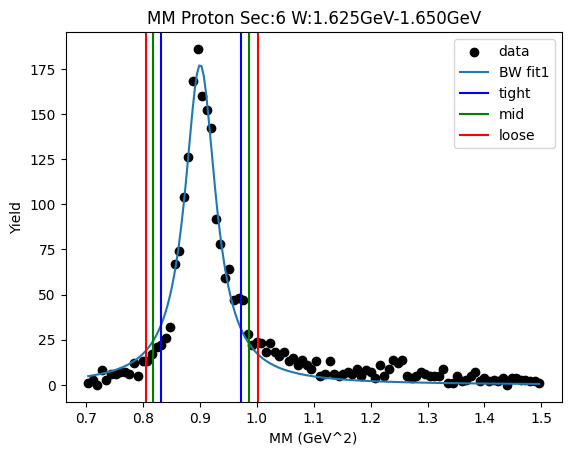

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.83389912 0.82088227 0.80796782]
 [0.96969928 0.98384247 0.99808805]]
Cut Bounds Err [[2.09562868e-06 2.48993068e-06 2.87839912e-06]
 [2.25983179e-06 2.72589799e-06 3.19917802e-06]]


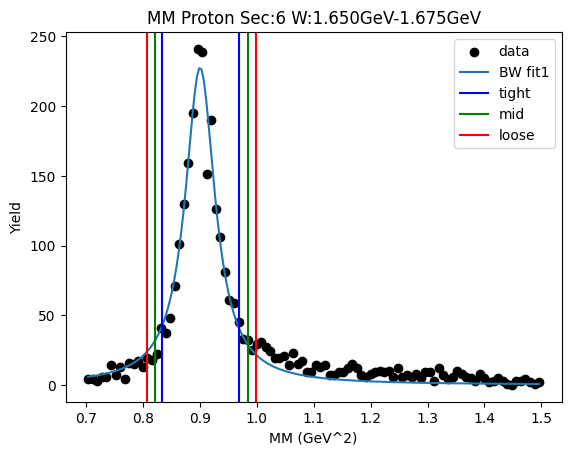

W bin: 11 1.675GeV-1.700GeV
background fit [11.73781002  1.03159525  0.05397916 10.41689646  1.27095838  0.14635231]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8978051096818455 0.9026321046037863
Breit-Wigner Peak [13.46366176  0.94879851  0.02836369]
Gaus2 [15.59853395  1.00477635  0.07225528]
Gaus3 [10.74054184  1.27502444  0.14088712]
Cut Bounds [[0.84387072 0.83281966 0.82184144]
 [0.95838745 0.97023973 0.98216485]]
Cut Bounds Err [[7.17322177e-07 8.54892908e-07 9.90612617e-07]
 [7.64446078e-07 9.22732373e-07 1.08293411e-06]]


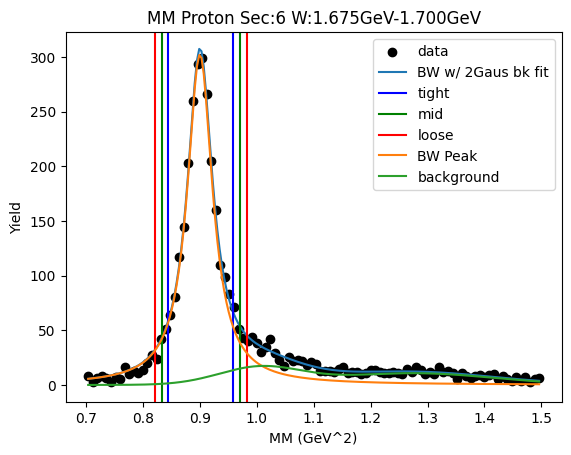

W bin: 12 1.700GeV-1.725GeV
background fit [13.27431566  0.94        0.13250155 12.00774977  1.33228725  0.15533079]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.895892526238774 0.9005724614722395
Breit-Wigner Peak [15.06532009  0.94775128  0.02792829]
Gaus2 [41.04775909  0.94        0.04220094]
Gaus3 [14.1379026   1.24090451  0.20269421]
Cut Bounds [[0.84279806 0.83192304 0.82111863]
 [0.9554324  0.96708424 0.9788067 ]]
Cut Bounds Err [[5.15759031e-06 6.14756913e-06 7.12440448e-06]
 [5.49142504e-06 6.62817551e-06 7.77846824e-06]]


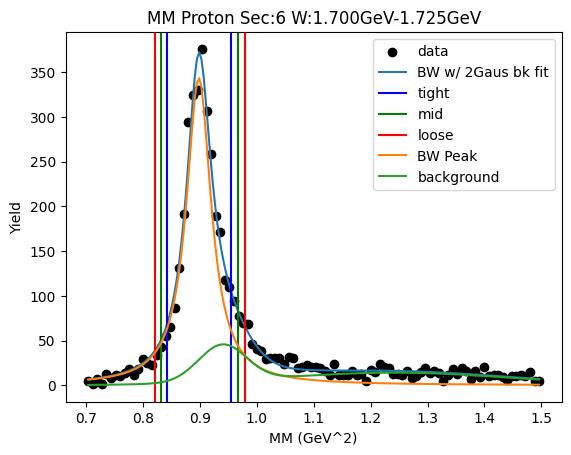

W bin: 13 1.725GeV-1.750GeV
background fit [18.04841858  0.99240796  0.09892412 17.1692968   1.34152057  0.12675821]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8967064022763158 0.9003895292761344
Breit-Wigner Peak [14.94417666  0.9479177   0.02477609]
Gaus2 [6.58541217e+01 9.40000000e-01 4.02852433e-02]
Gaus3 [17.95452852  1.24700234  0.22340335]
Cut Bounds [[0.84927313 0.83958489 0.82995224]
 [0.94921224 0.95951183 0.969867  ]]
Cut Bounds Err [[5.01546760e-06 5.98357333e-06 6.94028206e-06]
 [5.30236235e-06 6.39666308e-06 7.50251135e-06]]


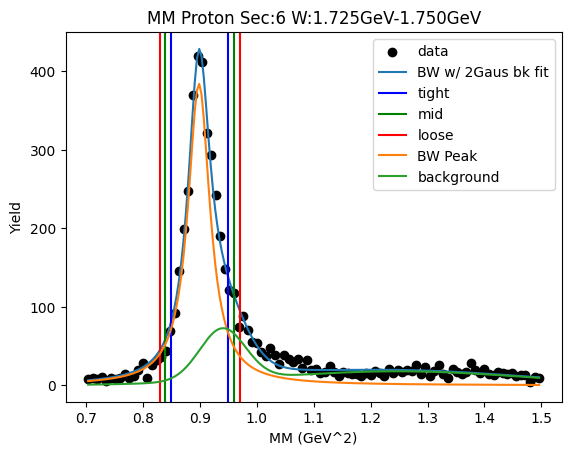

W bin: 14 1.750GeV-1.775GeV
background fit [19.30591488  1.00825262  0.05714953 22.08158584  1.33432034  0.14894953]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8971232678367993 0.9017014916708768
Breit-Wigner Peak [14.65393118  0.94837354  0.02762313]
Gaus2 [5.94029508e+01 9.48639795e-01 4.83117150e-02]
Gaus3 [22.21588971  1.29813261  0.2070376 ]
Cut Bounds [[0.84453754 0.83376983 0.82307119]
 [0.95601433 0.96754197 0.9791387 ]]
Cut Bounds Err [[7.77061741e-06 9.26402813e-06 1.07377133e-05]
 [8.26757700e-06 9.97956670e-06 1.17115725e-05]]


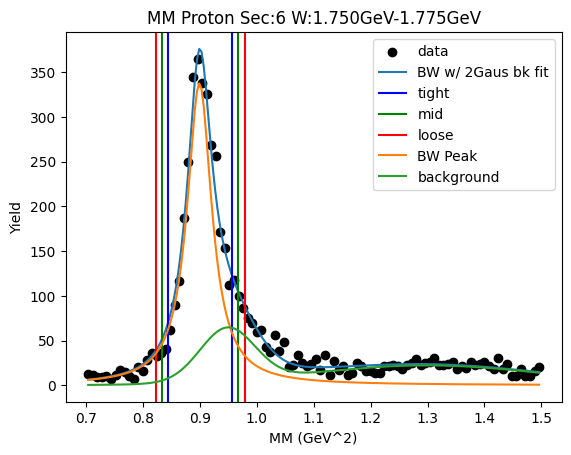

W bin: 15 1.775GeV-1.800GeV
background fit [21.5755517   1.01913009  0.04087515 23.83829616  1.35339666  0.23806979]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8966554701238275 0.9007173906024076
Breit-Wigner Peak [14.01625214  0.94799073  0.02601897]
Gaus2 [49.09363161  0.96429653  0.0615984 ]
Gaus3 [25.64570495  1.32685618  0.21554073]
Cut Bounds [[0.8469723  0.83681335 0.8267157 ]
 [0.9519329  0.96276607 0.97366054]]
Cut Bounds Err [[5.43821093e-06 6.48624080e-06 7.52123611e-06]
 [5.76533588e-06 6.95727478e-06 8.16234439e-06]]


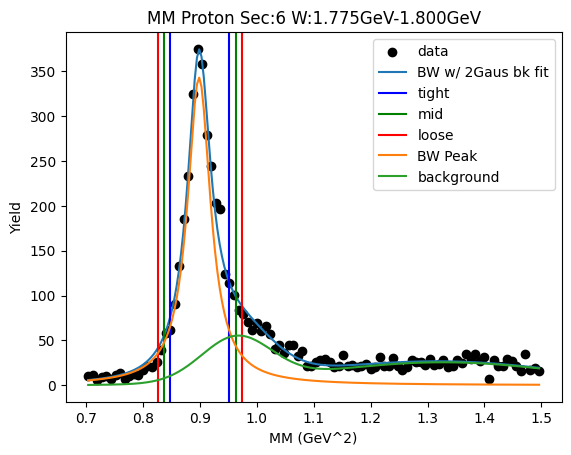

W bin: 16 1.800GeV-1.825GeV
background fit [16.60287187  1.00392394  0.06141887 25.59357576  1.32992885  0.20780508]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8967875805027491 0.9016517186771412
Breit-Wigner Peak [15.49545568  0.94827193  0.02847261]
Gaus2 [39.01140124  0.96854322  0.06063656]
Gaus3 [27.35412955  1.31040217  0.19798773]
Cut Bounds [[0.84269079 0.83160522 0.82059304]
 [0.95758347 0.96947644 0.9814428 ]]
Cut Bounds Err [[4.29758650e-06 5.12262151e-06 5.93637607e-06]
 [4.58119548e-06 5.53098263e-06 6.49217152e-06]]


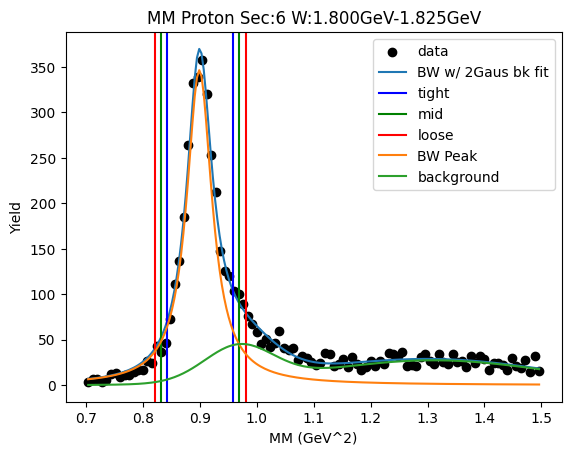

W bin: 17 1.825GeV-1.850GeV
background fit [1.80377235e+01 1.03223293e+00 2.20500236e-02 2.94952638e+01
 1.53053766e+00 4.28219798e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8942118657864353 0.8990084476010227
Breit-Wigner Peak [15.54368308  0.94689501  0.0282742 ]
Gaus2 [43.26630314  0.96361156  0.06102375]
Gaus3 [29.97843349  1.36558264  0.23976691]
Cut Bounds [[0.84055171 0.82955716 0.81863499]
 [0.95447809 0.96626881 0.97813191]]
Cut Bounds Err [[8.67307742e-06 1.03387825e-05 1.19818119e-05]
 [9.24217069e-06 1.11582278e-05 1.30971277e-05]]


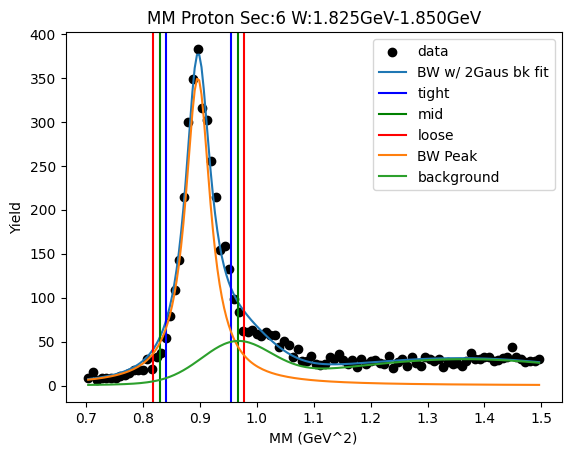

W bin: 18 1.850GeV-1.875GeV
background fit [15.83618769  1.0420781   0.05430852 32.10485138  1.40208529  0.26541439]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8955741882113484 0.8999878470526192
Breit-Wigner Peak [16.21016579  0.94751307  0.02712213]
Gaus2 [35.1880253   0.97564819  0.06503632]
Gaus3 [33.35658946  1.36091775  0.23795006]
Cut Bounds [[0.84393572 0.83336647 0.82286381]
 [0.95329134 0.96459321 0.97596168]]
Cut Bounds Err [[4.08551765e-06 4.87138674e-06 5.64705242e-06]
 [4.34215408e-06 5.24090997e-06 6.14998732e-06]]


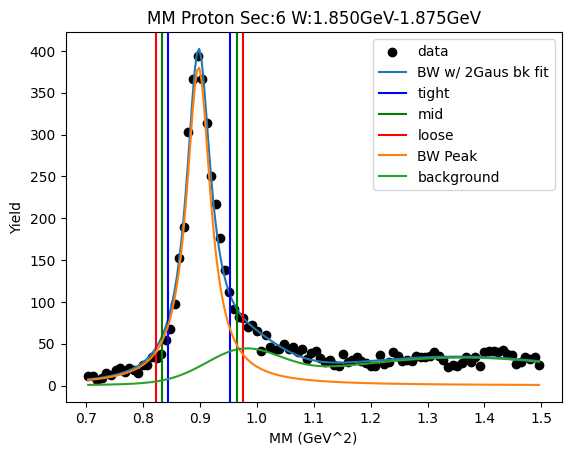

W bin: 19 1.875GeV-1.900GeV
background fit [1.29496873e+01 1.00571562e+00 1.76823255e-02 3.28889829e+01
 1.39975734e+00 3.99674838e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.895311197241935 0.8993803556331235
Breit-Wigner Peak [16.10669644  0.94728337  0.02604214]
Gaus2 [52.7686418   0.95428704  0.0545142 ]
Gaus3 [36.21665614  1.32623043  0.23256405]
Cut Bounds [[0.84562547 0.83546561 0.82536716]
 [0.95060115 0.96143644 0.97233312]]
Cut Bounds Err [[4.83604457e-06 5.76799877e-06 6.68833780e-06]
 [5.12743822e-06 6.18758471e-06 7.25942372e-06]]


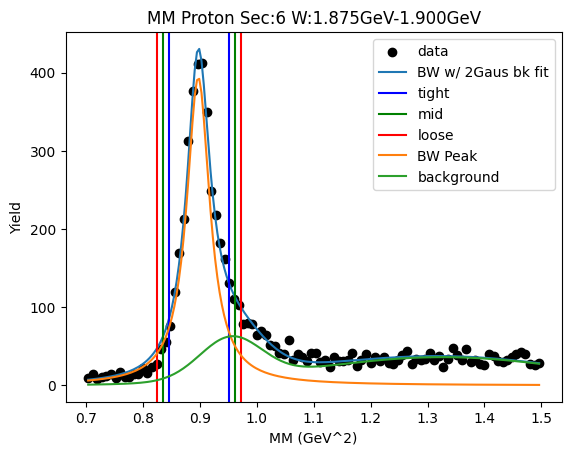

W bin: 20 1.900GeV-1.925GeV
background fit [ 7.58761162  1.03131172  0.04761921 36.7928686   1.47337003  0.34290638]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8929521207919403 0.8968251815309384
Breit-Wigner Peak [15.31961094  0.94598554  0.02540689]
Gaus2 [8.07978596e+01 9.40000000e-01 3.60617651e-02]
Gaus3 [37.33174468  1.35481263  0.29582761]
Cut Bounds [[0.84448185 0.83457582 0.82472824]
 [0.94675654 0.95730545 0.9679128 ]]
Cut Bounds Err [[4.09825063e-06 4.88393031e-06 5.66067443e-06]
 [4.33932833e-06 5.23072423e-06 6.13240547e-06]]


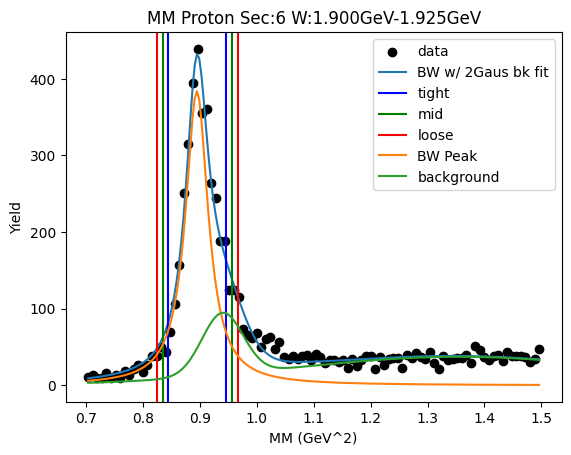

W bin: 21 1.925GeV-1.950GeV
background fit [16.46896628  1.00177839  0.04078208 39.00962317  1.39017947  0.26733508]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8938266390268964 0.8978482059003313
Breit-Wigner Peak [16.86698284  0.94648688  0.0258894 ]
Gaus2 [5.55696041e+01 9.51406125e-01 5.15979098e-02]
Gaus3 [40.75045126  1.35250415  0.23929127]
Cut Bounds [[0.84445985 0.83436639 0.82433362]
 [0.94873211 0.9594931  0.97031477]]
Cut Bounds Err [[5.25618398e-06 6.26920260e-06 7.26967633e-06]
 [5.57125265e-06 6.72287182e-06 7.88714619e-06]]


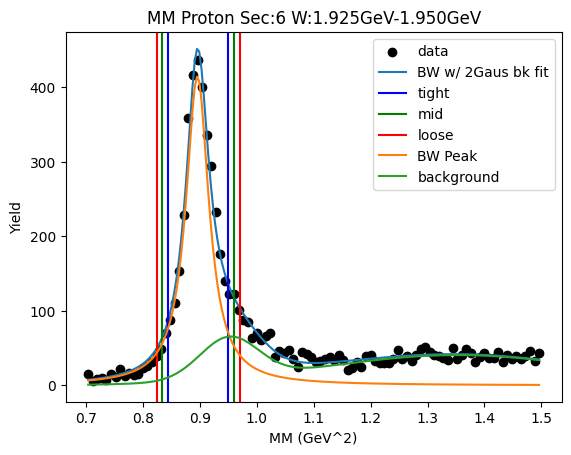

W bin: 22 1.950GeV-1.975GeV
background fit [10.63403068  1.01120721  0.05612583 42.1395197   1.52178404  0.37150961]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8924241904039631 0.8964804223953049
Breit-Wigner Peak [16.0768181   0.94575489  0.02600074]
Gaus2 [6.21757022e+01 9.41123704e-01 4.87874005e-02]
Gaus3 [41.24677338  1.3879566   0.2931479 ]
Cut Bounds [[0.84289755 0.83277022 0.8227041 ]
 [0.94753725 0.95833787 0.96919969]]
Cut Bounds Err [[1.12863161e-05 1.34615699e-05 1.56096776e-05]
 [1.19663847e-05 1.44408395e-05 1.69425484e-05]]


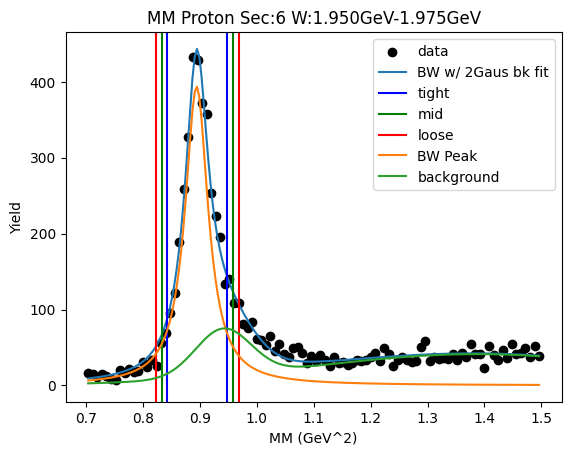

W bin: 23 1.975GeV-2.000GeV
background fit [1.77847079e+01 1.02560822e+00 3.72223785e-02 4.20697678e+01
 1.50073125e+00 3.86205626e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.894111939926097 0.8986884563433029
Breit-Wigner Peak [18.5136553   0.94678413  0.02761798]
Gaus2 [40.75450587  0.98827735  0.06833674]
Gaus3 [42.64663649  1.3936583   0.23528403]
Cut Bounds [[0.84162883 0.83088173 0.82020369]
 [0.95289804 0.96440478 0.97598058]]
Cut Bounds Err [[2.36605729e-06 2.82046501e-06 3.26889827e-06]
 [2.51760835e-06 3.03865076e-06 3.56583411e-06]]


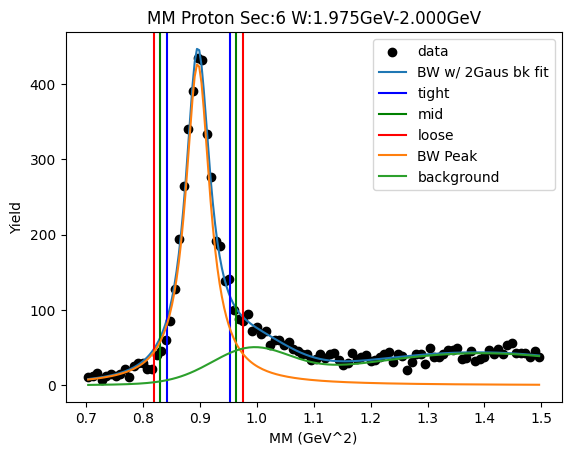

W bin: 24 2.000GeV-2.025GeV
background fit [1.18139086e+01 1.04993021e+00 4.03895366e-02 5.75281621e+01
 1.81018959e+00 5.20367701e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8955519538783691 0.90042711191984
Breit-Wigner Peak [19.08070328  0.9476231   0.02850485]
Gaus2 [32.18048029  0.99702632  0.07608396]
Gaus3 [45.12237381  1.44201377  0.24159976]
Cut Bounds [[0.84143707 0.83034727 0.81933104]
 [0.95638112 0.96828014 0.98025271]]
Cut Bounds Err [[2.25358951e-06 2.68603539e-06 3.11257705e-06]
 [2.40258903e-06 2.90056338e-06 3.40454778e-06]]


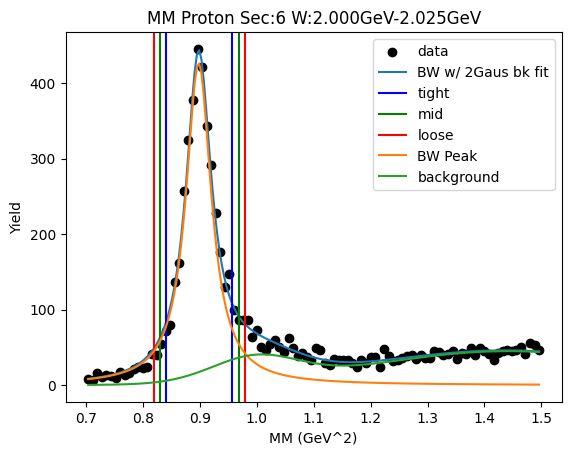

W bin: 25 2.025GeV-2.050GeV
background fit [1.75417407e+01 1.01750523e+00 3.44929870e-02 4.66137671e+01
 1.49561455e+00 3.16100937e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8931204961553643 0.8983119620996587
Breit-Wigner Peak [18.23872585  0.94642286  0.02941504]
Gaus2 [41.44497616  0.97451111  0.06063495]
Gaus3 [46.28332773  1.41532286  0.24133913]
Cut Bounds [[0.83746341 0.82604786 0.81471065]
 [0.9559275  0.96820477 0.98056038]]
Cut Bounds Err [[4.41790529e-06 5.26369231e-06 6.09761305e-06]
 [4.72004305e-06 5.69864364e-06 6.68952583e-06]]


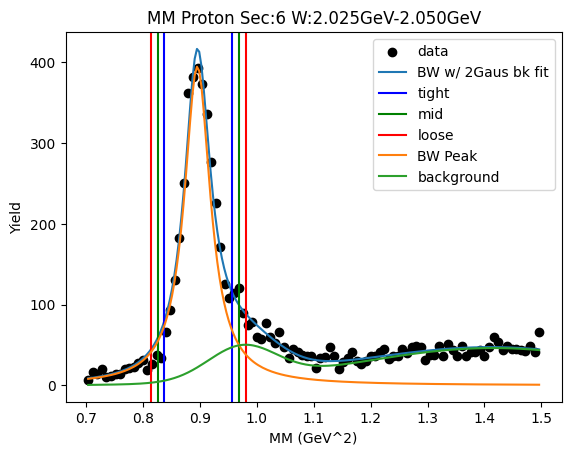

W bin: 26 2.050GeV-2.075GeV
background fit [2.16738662e+01 1.02283830e+00 5.55727446e-02 6.17154929e+01
 1.63483942e+00 3.53285916e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8932454628797324 0.8971578142013694
Breit-Wigner Peak [16.89215795  0.94615096  0.02553544]
Gaus2 [41.6315755   0.98322643  0.06753374]
Gaus3 [55.32573814  1.51555036  0.28367831]
Cut Bounds [[0.84453453 0.83457822 0.82468095]
 [0.94734466 0.95795037 0.96861512]]
Cut Bounds Err [[2.60319203e-06 3.10487401e-06 3.60046872e-06]
 [2.75709356e-06 3.32645737e-06 3.90203969e-06]]


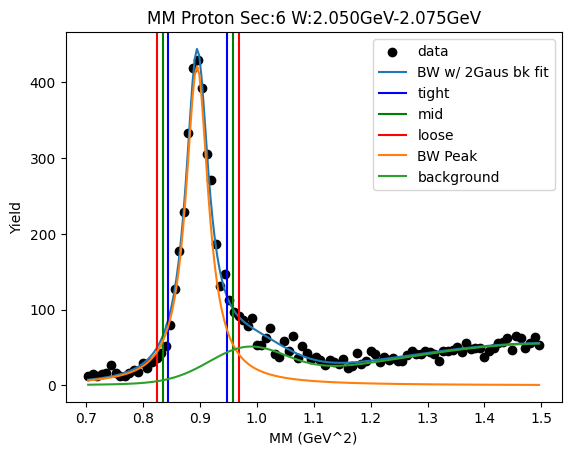

W bin: 27 2.075GeV-2.100GeV
background fit [17.33258681  1.02899595  0.05825329 50.08201363  1.45508636  0.26089845]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.890081973193084 0.8940271151941908
Breit-Wigner Peak [14.49738083  0.94448639  0.02564222]
Gaus2 [5.91229638e+01 9.42334102e-01 4.91733481e-02]
Gaus3 [49.67940799  1.43915319  0.31990456]
Cut Bounds [[0.84126947 0.83129105 0.82137216]
 [0.9443279  0.95496117 0.96565397]]
Cut Bounds Err [[1.34880796e-05 1.60888855e-05 1.86576744e-05]
 [1.42903862e-05 1.72441688e-05 2.02301119e-05]]


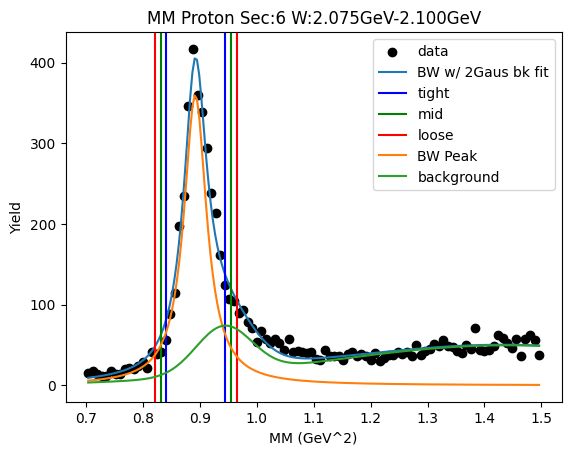

W bin: 28 2.100GeV-2.125GeV
background fit [1.88177471e+01 1.02328711e+00 1.34907435e-02 5.88586495e+01
 1.64569652e+00 4.05423780e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8906429368285114 0.895244122438182
Breit-Wigner Peak [15.91968315  0.94495689  0.02769231]
Gaus2 [40.79802746  0.95170624  0.05343552]
Gaus3 [53.06035198  1.50747036  0.33316373]
Cut Bounds [[0.83813473 0.82738126 0.81669722]
 [0.9494881  0.96100531 0.97259195]]
Cut Bounds Err [[8.74158959e-06 1.04218385e-05 1.20796628e-05]
 [9.30418332e-06 1.12319301e-05 1.31822519e-05]]


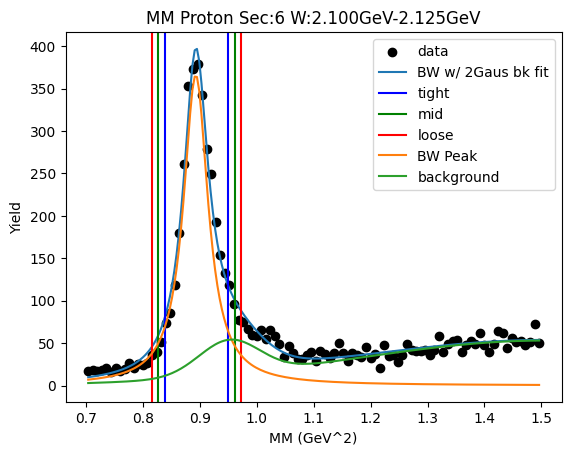

In [18]:
bkgd=True
Wlow_bin = -1
Wbin_bkgd = 11

tight = 2.5
mid = 3
loose = 3.5

a_ini=5000
m_ini=0.9
g_ini=0.1
bw_ini = [a_ini,m_ini,g_ini]

gaus2_ini = [433.0350,  0.97053, 0.06287]
gaus3_ini = [706, 1.45548, 0.2417]





bw_ini_w = [1.01801152, 0.94626145, 0.039624]
gaus2_ini_w = [3.07211428, 1.01332019, 0.06742853]
gaus3_ini_w = [2.78458923, 1.26687645, 0.10165907]

bw_bounds = [[0.0,0.0,0.0],[np.inf,np.inf,np.inf]]
full_bounds = [[0.0,0.0,0.0,0.0,0.94,0.0,0.0,0.94,0.0],[np.inf,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf]]

bkgd_bounds = [[0.0,0.94,0.0,0.0,0.94,0.0],[np.inf,np.inf,np.inf,np.inf,np.inf,np.inf]]

bw_pars = np.zeros((6,_W_bins_+1,3))
gaus2_pars = np.zeros((6,_W_bins_+1,3))
gaus3_pars = np.zeros((6,_W_bins_+1,3))

bkgd_guess_pars = np.zeros((6,_W_bins_+1,6))


ini_pars= np.zeros(9)
for i in range(3):
    ini_pars[i] = bw_ini[i]
    ini_pars[i+3] = gaus2_ini[i]
    ini_pars[i+6] = gaus3_ini[i]

    #sec W low, high, tight, mid, loose
cut_bounds = np.zeros((6,_W_bins_+1,2,3))
cut_bounds_err = np.zeros((6,_W_bins_+1,2,3))

bw_ini_w1 = np.zeros(3)
    
for sec in range(6):
    x_r=Center_Xbins(hist_name[sec][1])
    y_r=Values_1d(hist_name[sec][1])
    plt.scatter(x_r,y_r,color='k',label='data')
    plt.title("MM {} Sec:{} W:{}-{} (GeV)".format(Particle,sec+1,_W_min_,_W_max_))
    plt.xlabel("MM (GeV^2)")
    plt.ylabel("Yield")
   
    try:
        bw_ini[0] = np.max(y_r)
        bw_ini[1] = x_r[np.argmax(y_r)]
        pars_r1, pars_cov_r1 = op.curve_fit(BW_e2,x_r,y_r,p0=bw_ini,maxfev=5000,bounds=bw_bounds)
        tmp_x1 = np.linspace(x_r[0],x_r[len(x_r)-1],200)
        plt.plot(tmp_x1,BW_e2(tmp_x1,*pars_r1),label="BW fit1")
        tmp_y_r = [y_r[i]-BW_e2(x_r[i],*pars_r1) for i in range(len(y_r))]
        plt.scatter(x_r,tmp_y_r,label="bkgd estimate")
        try:
            bkgd_guess_pars[sec][_W_bins_][0] = tmp_y_r[50]
            bkgd_guess_pars[sec][_W_bins_][1] = x_r[50]
            bkgd_guess_pars[sec][_W_bins_][2] = 0.05
            bkgd_guess_pars[sec][_W_bins_][3] = tmp_y_r[90]
            bkgd_guess_pars[sec][_W_bins_][4] = x_r[90]
            bkgd_guess_pars[sec][_W_bins_][5] = 0.3
            
            bkgd_full_pars, bkgd_full_pars_cov = op.curve_fit(Gaus2,x_r,tmp_y_r,p0=bkgd_guess_pars[sec][_W_bins_],maxfev=5000,bounds=bkgd_bounds)
            
            plt.plot(tmp_x1,Gaus2(tmp_x1,*bkgd_full_pars),label="bkgd fit")
            try:
                r1_ini_pars = np.zeros(9)

                for i in range(3):
                    r1_ini_pars[i] = pars_r1[i]
                    r1_ini_pars[i+3] = gaus2_ini[i]
                    r1_ini_pars[i+6] = gaus3_ini[i]
                #r1_ini[0] = np.max(y_r)
                #r1_ini[1] - x_r[np.argmax(y_r)]
                pars_r2, pars_cov_r2 = op.curve_fit(BW_e2_Gaus2,x_r,y_r,p0=r1_ini_pars,maxfev=5000)
                plt.plot(tmp_x1,BW_e2_Gaus2(tmp_x1,*pars_r2),label="BW w/ 2Gaus bk fit")
                r1_bkgd_pars = np.zeros(6)
                for i in range(3):
                    bw_pars[sec][_W_bins_][i] = pars_r2[i]
                    r1_bkgd_pars[i] = pars_r2[i+3]
                    r1_bkgd_pars[i+3] = pars_r2[i+6]
                    gaus2_pars[sec][_W_bins_][i] = pars_r2[i+3]
                    gaus3_pars[sec][_W_bins_][i] = pars_r2[i+6]
                for i in range(3):
                    for j in range(2):
                        cut_bounds[sec][_W_bins_][j][i] = (pars_r2[1]+sign2[j]*cut_sig[i]*pars_r2[2]/2.35)*(pars_r2[1]+sign2[j]*cut_sig[i]*pars_r2[2]/2.35)
                        cut_bounds_err[sec][_W_bins_][j][i] = np.sqrt((2*(pars_r2[1]+sign2[j]*cut_sig[i]*pars_r2[2]/2.35))**2 + ((2*sign2[j]*cut_sig[i]/2.35)*(pars_r2[1]+sign2[j]*cut_sig[i]*pars_r2[2]/2.35))**2)
                        if j==0:
                            plt.axvline(x=cut_bounds[sec][_W_bins_][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                        else:
                            plt.axvline(x=cut_bounds[sec][_W_bins_][j][i],color=color_order[i])

    #                 cut_bounds[sec][_W_bins_][0][0] = (pars_r2[1]-tight*pars_r2[2]/2.35)*(pars_r2[1]-tight*pars_r2[2]/2.35)
    #                 cut_bounds[sec][_W_bins_][0][1] = (pars_r2[1]-mid*pars_r2[2]/2.35)*(pars_r2[1]-mid*pars_r2[2]/2.35)
    #                 cut_bounds[sec][_W_bins_][0][2] = (pars_r2[1]-loose*pars_r2[2]/2.35)*(pars_r2[1]-loose*pars_r2[2]/2.35)
    #                 cut_bounds[sec][_W_bins_][1][0] = (pars_r2[1]+tight*pars_r2[2]/2.35)*(pars_r2[1]+tight*pars_r2[2]/2.35)
    #                 cut_bounds[sec][_W_bins_][1][1] = (pars_r2[1]+mid*pars_r2[2]/2.35)*(pars_r2[1]+mid*pars_r2[2]/2.35)
    #                 cut_bounds[sec][_W_bins_][1][2] = (pars_r2[1]+loose*pars_r2[2]/2.35)*(pars_r2[1]+loose*pars_r2[2]/2.35)
                plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_pars[sec][_W_bins_]),label="BW Peak")
                plt.plot(tmp_x1,Gaus2(tmp_x1,*r1_bkgd_pars),label="background")

    #             plt.axvline(x=cut_bounds[sec][_W_bins_][0][0],label="tight -{}\u03C3".format(tight))
    #             plt.axvline(x=cut_bounds[sec][_W_bins_][1][0],label="tight +{}\u03C3".format(tight))
    #             plt.axvline(x=cut_bounds[sec][_W_bins_][0][1],label="mid -{}\u03C3".format(mid),color='g')
    #             plt.axvline(x=cut_bounds[sec][_W_bins_][1][1],label="mid +{}\u03C3".format(mid),color='g')
    #             plt.axvline(x=cut_bounds[sec][_W_bins_][0][2],label="loose -{}\u03C3".format(loose),color='r')
    #             plt.axvline(x=cut_bounds[sec][_W_bins_][1][2],label="loose +{}\u03C3".format(loose),color='r')
                print(pars_r2[1]*pars_r2[1]-3*pars_r2[2]*pars_r2[2],pars_r2[1]*pars_r2[1]+3*pars_r2[2]*pars_r2[2])
                print("Breit-Wigner Peak",bw_pars[sec][_W_bins_])
                print("Gaus2",gaus2_pars[sec][_W_bins_])
                print("Gaus3",gaus3_pars[sec][_W_bins_])
            except RuntimeError:
                print("Runtime Error1.2\n\tJust skip it for now")
            except ValueError:
                print("Value Error1.2\n\tJust skip it for now")
        except RuntimeError:
            print("Runtime Error1.1\n\tJust skip it for now")
        except ValueError:
            print("Value Error1.1\n\tJust skip it for now")
    except RuntimeError:
        print("Runtime Error1.0\n\tJust skip it for now")
    except ValueError:
        print("Value Error1.0\n\tJust skip it for now")
    plt.legend()
    plt.show()
    for Wbin in range(_W_bins_):
        if Wbin > Wlow_bin:
            print("W bin:",Wbin,W_Bin_PlotName[Wbin])
            x_w=Center_Xbins(hist_name[sec][0][Wbin])
            y_w=Values_1d(hist_name[sec][0][Wbin])
            plt.scatter(x_w,y_w,color='k',label='data')
            plt.title("MM {} Sec:{} W:{}".format(Particle,sec+1,W_Bin_PlotName[Wbin]))
            plt.xlabel("MM (GeV^2)")
            plt.ylabel("Yield")
            try:
                for j in range(3):
                    if Wbin > 0 and bw_pars[sec][Wbin-1][j]!=0:
                        for i in range(3):
                            bw_ini_w1[i] = bw_pars[sec][Wbin-1][i]
                    else:
                        for i in range(3):
                            bw_ini_w1[i] = bw_ini_w[i]
                bw_ini_w1[0] = np.max(y_w)
                bw_ini_w1[1] = x_r[np.argmax(y_w)]
                pars_w1, pars_cov_w1 = op.curve_fit(BW_e2,x_w,y_w,p0=bw_ini_w1,maxfev=5000,bounds=bw_bounds)
                #tmp_x_w1 = np.linspace(x_w[0],x_w[len(x_w)-1],200)
                #plt.plot(tmp_x1,BW_e2(tmp_x1,*pars_w1),label="BW fit1")
                #print("initial bw fit: ",pars_w1)
                if Wbin >= Wbin_bkgd:
                    tmp_y_w = [y_w[i]-BW_e2(x_w[i],*pars_w1) for i in range(len(y_w))]
                    bkgd_fit_x = Bounds_on_Y(x_w,0.95,1.5)
                    bkgd_fit_y = Bounds_on_X_From_Y(tmp_y_w,x_w,0.95,1.5)
                    #plt.scatter(bkgd_fit_x,bkgd_fit_y,label="bkgd estimate")
                    if gaus2_pars[sec][Wbin-1][0] ==0:
                        bkgd_guess_pars[sec][Wbin][0] = np.max(bkgd_fit_y)
                        bkgd_guess_pars[sec][Wbin][1] = 1.0
                        bkgd_guess_pars[sec][Wbin][2] = 0.06
                        bkgd_guess_pars[sec][Wbin][3] = tmp_y_w[80]
                        bkgd_guess_pars[sec][Wbin][4] = 1.4
                        bkgd_guess_pars[sec][Wbin][5] = 0.2
                    else:
                        bkgd_guess_pars[sec][Wbin][0] = gaus2_pars[sec][Wbin-1][0]
                        bkgd_guess_pars[sec][Wbin][1] = gaus2_pars[sec][Wbin-1][1]
                        bkgd_guess_pars[sec][Wbin][2] = gaus2_pars[sec][Wbin-1][2]
                        bkgd_guess_pars[sec][Wbin][3] = gaus3_pars[sec][Wbin-1][0]
                        bkgd_guess_pars[sec][Wbin][4] = gaus3_pars[sec][Wbin-1][1]
                        bkgd_guess_pars[sec][Wbin][5] = gaus3_pars[sec][Wbin-1][2]
                    
                    
                    
                    #plt.plot(tmp_x1,Gaus2(tmp_x1,*bkgd_guess_pars[sec][Wbin]),label="bkgd guess")
                    try:
                        
                        
                        
                        
                        
                        
                        
                        bkgd_pars_w, bkgd_pars_cov_w = op.curve_fit(Gaus2,bkgd_fit_x,bkgd_fit_y,p0=bkgd_guess_pars[sec][Wbin],bounds=bkgd_bounds)
                        #plt.plot(tmp_x1,Gaus2(tmp_x1,*bkgd_pars_w),label="bkgd fit1")
                        print("background fit",bkgd_pars_w)
                        try:
                            w1_ini_pars = np.zeros(9)

                            for i in range(3):
                                w1_ini_pars[i] = pars_w1[i]
                                if Wbin > 0:
                                    if gaus2_pars[sec][Wbin-1][i] != 0.0:
                                        w1_ini_pars[i+3] = gaus2_pars[sec][Wbin-1][i]
                                        w1_ini_pars[i+6] = gaus3_pars[sec][Wbin-1][i]
                                    else:
                                        w1_ini_pars[i+3] = gaus2_ini_w[i]
                                        w1_ini_pars[i+6] = gaus3_ini_w[i]
                                else:
                                    w1_ini_pars[i+3] = gaus2_ini_w[i]
                                    w1_ini_pars[i+6] = gaus3_ini_w[i]
                           # print("w1_ini_pars:",w1_ini_pars)
                            #w1_ini_pars[0] = np.max(y_w)
                            #w1_ini_pars[1] = x_r[np.argmax(y_w)]
                            for i in range(6):
                                w1_ini_pars[i+3] = bkgd_pars_w[i]
#                             w1_ini_pars[4] = x_w[50]
#                             w1_ini_pars[6] = y_w[90]
#                             w1_ini_pars[7] = x_w[90]
                            #print("post W1_ini_pars",w1_ini_pars)
#                             print(x_w)
#                             print(y_w)
                            #plt.plot(tmp_x1,BW_e2_Gaus2(tmp_x1,*w1_ini_pars),label="Guess on the 2 gaus bkgd")
                            #plt.scatter(x_w,y_w,color='c',label='data again')
                            print(full_bounds)
                            pars_w2, pars_cov_w2 = op.curve_fit(BW_e2_Gaus2,x_w,y_w,p0=w1_ini_pars,maxfev=50000,bounds=full_bounds)
                            plt.plot(tmp_x1,BW_e2_Gaus2(tmp_x1,*pars_w2),label="BW w/ 2Gaus bk fit")
                            
                            w1_bkgd_pars = np.zeros(6)
                            for i in range(3):
                                bw_pars[sec][Wbin][i] = pars_w2[i]
                                w1_bkgd_pars[i] = pars_w2[i+3]
                                w1_bkgd_pars[i+3] = pars_w2[i+6]
                                gaus2_pars[sec][Wbin][i] = pars_w2[i+3]
                                gaus3_pars[sec][Wbin][i] = pars_w2[i+6]
                            for i in range(3):
                                for j in range(2):
                                    cut_bounds[sec][Wbin][j][i] = (pars_w2[1]+sign2[j]*cut_sig[i]*pars_w2[2]/2.35)*(pars_w2[1]+sign2[j]*cut_sig[i]*pars_w2[2]/2.35)
                                    cut_bounds_err[sec][Wbin][j][i] = np.sqrt((pars_cov_w2[1][1]*2*(pars_w2[1]+sign2[j]*cut_sig[i]*pars_w2[2]/2.35))**2 + (pars_cov_w2[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w2[1]+sign2[j]*cut_sig[i]*pars_w2[2]/2.35))**2)
                                    if j==0:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                                    else:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
    #                             cut_bounds[sec][Wbin][0][0] = (pars_w2[1]-tight*pars_w2[2]/2.35)*(pars_w2[1]-tight*pars_w2[2]/2.35)
    #                             cut_bounds[sec][Wbin][0][1] = (pars_w2[1]-mid*pars_w2[2]/2.35)*(pars_w2[1]-mid*pars_w2[2]/2.35)
    #                             cut_bounds[sec][Wbin][0][2] = (pars_w2[1]-loose*pars_w2[2]/2.35)*(pars_r2[1]-loose*pars_w2[2]/2.35)
    #                             cut_bounds[sec][Wbin][1][0] = (pars_w2[1]+tight*pars_w2[2]/2.35)*(pars_r2[1]+tight*pars_w2[2]/2.35)
    #                             cut_bounds[sec][Wbin][1][1] = (pars_w2[1]+mid*pars_w2[2]/2.35)*(pars_r2[1]+mid*pars_w2[2]/2.35)
    #                             cut_bounds[sec][Wbin][1][2] = (pars_w2[1]+loose*pars_w2[2]/2.35)*(pars_r2[1]+loose*pars_w2[2]/2.35)
                            plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_pars[sec][Wbin]),label="BW Peak")
                            plt.plot(tmp_x1,Gaus2(tmp_x1,*w1_bkgd_pars),label="background")

                            print(pars_w2[1]*pars_w2[1]-3*pars_w2[2]*pars_w2[2],pars_w2[1]*pars_w2[1]+3*pars_w2[2]*pars_w2[2])
                            print("Breit-Wigner Peak",bw_pars[sec][Wbin])
                            print("Gaus2",gaus2_pars[sec][Wbin])
                            print("Gaus3",gaus3_pars[sec][Wbin])
                        except RuntimeError:
                            print("Runtime Error2.1\n\tJust skip it for now")
                            for i in range(3):
                                bw_pars[sec][Wbin][i] = pars_w1[i]
                            for i in range(3):
                                for j in range(2):
                                    cut_bounds[sec][Wbin][j][i] = (pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)
                                    cut_bounds_err[sec][Wbin][j][i] = np.sqrt((pars_cov_w1[1][1]*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2 + (pars_cov_w1[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2)
                                    if j==0:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                                    else:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
                        except ValueError:
                            print("Value Error2.1\n\tJust skip it for now")
                            for i in range(3):
                                bw_pars[sec][Wbin][i] = pars_w1[i]
                            for i in range(3):
                                for j in range(2):
                                    cut_bounds[sec][Wbin][j][i] = (pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)
                                    cut_bounds_err[sec][Wbin][j][i] = np.sqrt((pars_cov_w1[1][1]*2*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2 + (pars_cov_w1[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2)
                                    if j==0:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                                    else:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
                    except RuntimeError:
                        print("Runtime Error2.2\n\tJust skip it for now")
                        for i in range(3):
                            bw_pars[sec][Wbin][i] = pars_w1[i]
                        for i in range(3):
                            for j in range(2):
                                cut_bounds[sec][Wbin][j][i] = (pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)
                                cut_bounds_err[sec][Wbin][j][i] = np.sqrt((pars_cov_w1[1][1]*2*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2 + (pars_cov_w1[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2)
                                if j==0:
                                    plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                                else:
                                    plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
                    except ValueError:
                        print("Value Error2.2\n\tJust skip it for now")
                        for i in range(3):
                            bw_pars[sec][Wbin][i] = pars_w1[i]
                        for i in range(3):
                            for j in range(2):
                                cut_bounds[sec][Wbin][j][i] = (pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)
                                cut_bounds_err[sec][Wbin][j][i] = np.sqrt((2*(pars_cov_w1[1][1]*pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2 + (pars_cov_w1[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2)
                                if j==0:
                                    plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                                else:
                                    plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
                else:
                    plt.plot(tmp_x1,BW_e2(tmp_x1,*pars_w1),label="BW fit1")
                    for i in range(3):
                        bw_pars[sec][Wbin][i] = pars_w1[i]
                    for i in range(3):
                        for j in range(2):
                            cut_bounds[sec][Wbin][j][i] = (pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)
                            cut_bounds_err[sec][Wbin][j][i] = np.sqrt((pars_cov_w1[1][1]*2*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2 + (pars_cov_w1[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2)

                            if j==0:
                                plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                            else:
                                plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
#                         cut_bounds[sec][Wbin][0][0] = (pars_w1[1]-tight*pars_w1[2]/2.35)*(pars_w1[1]-tight*pars_w1[2]/2.35)
#                         cut_bounds[sec][Wbin][0][1] = (pars_w1[1]-mid*pars_w1[2]/2.35)*(pars_w1[1]-mid*pars_w1[2]/2.35)
#                         cut_bounds[sec][Wbin][0][2] = (pars_w1[1]-loose*pars_w1[2]/2.35)*(pars_w1[1]-loose*pars_w1[2]/2.35)
#                         cut_bounds[sec][Wbin][1][0] = (pars_w1[1]+tight*pars_w1[2]/2.35)*(pars_w1[1]+tight*pars_w1[2]/2.35)
#                         cut_bounds[sec][Wbin][1][1] = (pars_w1[1]+mid*pars_w1[2]/2.35)*(pars_w1[1]+mid*pars_w1[2]/2.35)
#                         cut_bounds[sec][Wbin][1][2] = (pars_w1[1]+loose*pars_w1[2]/2.35)*(pars_w1[1]+loose*pars_w1[2]/2.35)
#                 plt.axvline(x=cut_bounds[sec][Wbin][0][0],label="tight -{}\u03C3".format(tight))
#                 plt.axvline(x=cut_bounds[sec][Wbin][1][0],label="tight +{}\u03C3".format(tight))
#                 plt.axvline(x=cut_bounds[sec][Wbin][0][1],label="mid -{}\u03C3".format(mid),color='g')
#                 plt.axvline(x=cut_bounds[sec][Wbin][1][1],label="mid +{}\u03C3".format(mid),color='g')
#                 plt.axvline(x=cut_bounds[sec][Wbin][0][2],label="loose -{}\u03C3".format(loose),color='r')
#                 plt.axvline(x=cut_bounds[sec][Wbin][1][2],label="loose +{}\u03C3".format(loose),color='r')
            except RuntimeError:
                print("Runtime Error2.0\n\tJust skip it for now")
                
            except ValueError:
                print("Value Error2.0\n\tJust skip it for now")
            print("Cut Bounds",cut_bounds[sec][Wbin])
            print("Cut Bounds Err",cut_bounds_err[sec][Wbin])
            plt.legend()
            plt.show()
            
            

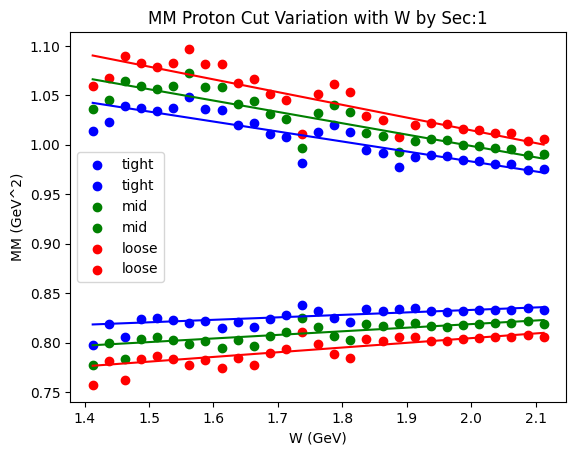

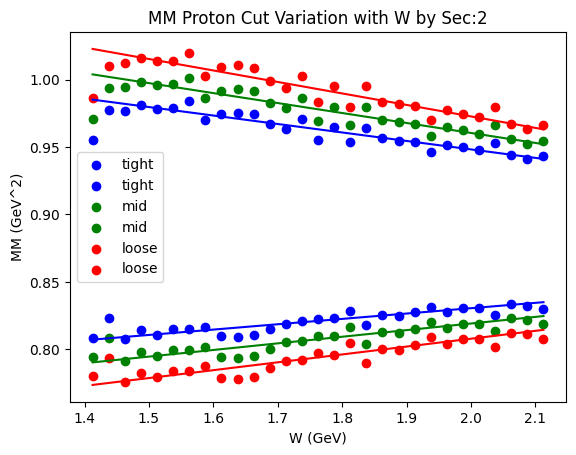

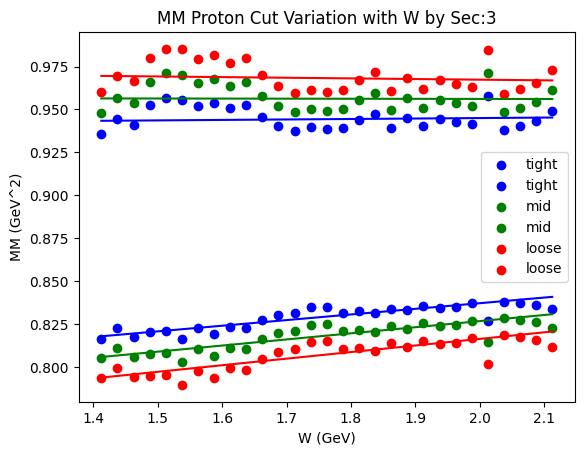

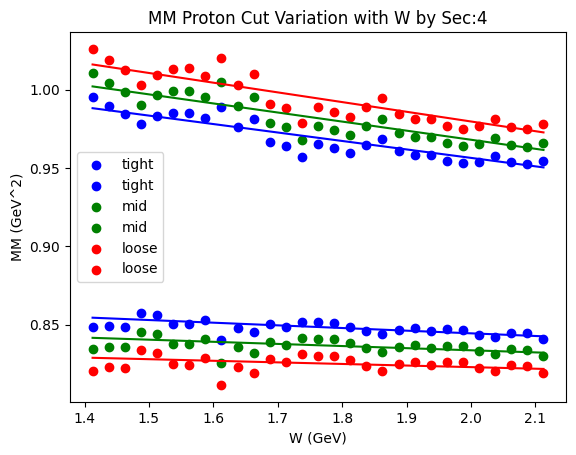

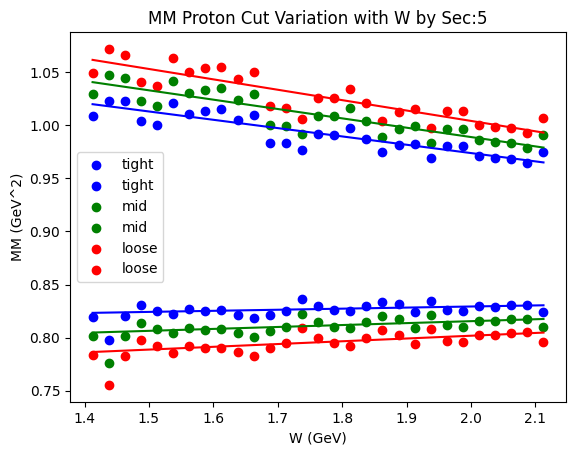

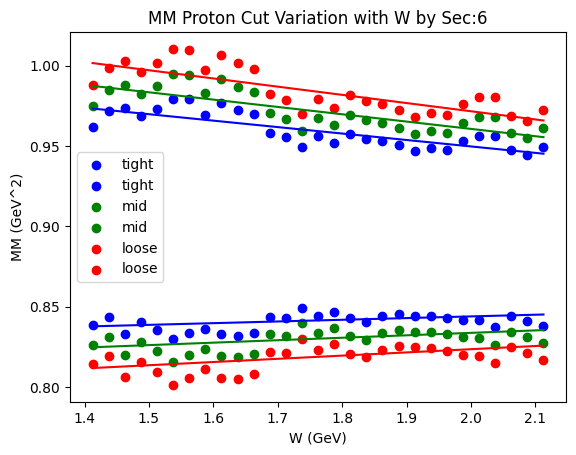

In [25]:
W_bins = [W_center(i) for i in range(_W_bins_)]

def Linear(x_,a_,b_):
    return a_ + b_*x_

lin_fit = np.zeros((6,2,3,2))

for sec in range(6):
#     y_tight_w1 = Remove_Zeros_Y([cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)])
#     y_tight_w2 = Remove_Zeros_Y([cut_bounds[sec][Wbin][1][0] for Wbin in range(_W_bins_)])
#     y_mid_w1 = Remove_Zeros_Y([cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)])
#     y_mid_w2 = Remove_Zeros_Y([cut_bounds[sec][Wbin][1][1] for Wbin in range(_W_bins_)])
#     y_loose_w1 = Remove_Zeros_Y([cut_bounds[sec][Wbin][0][2] for Wbin in range(_W_bins_)])
#     y_loose_w2 = Remove_Zeros_Y([cut_bounds[sec][Wbin][1][2] for Wbin in range(_W_bins_)])
#     #x_tight = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)])
#     x = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)])
    for i in range(3):
        for j in range(2):
            x = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][j][i] for Wbin in range(_W_bins_)])
            y = Remove_Zeros_Y([cut_bounds[sec][Wbin][j][i] for Wbin in range(_W_bins_)])
            if j ==0:
                plt.scatter(x,y,color=color_order[i],label=cut_names[i])
                plt.errorbar(x,y,color=color_order[i],yerr=[cut_bounds_err[sec][Wbin][j][i] for Wbin in range(_W_bins_)],ls='')
            else:
                plt.scatter(x,y,color=color_order[i],label=cut_names[i])
                plt.errorbar(x,y,color=color_order[i],yerr=[cut_bounds_err[sec][Wbin][j][i] for Wbin in range(_W_bins_)],ls='')
            try:
                pars, pars_cov = op.curve_fit(Linear,x,y,sigma=[cut_bounds_err[sec][Wbin][j][i] for Wbin in range(_W_bins_)],maxfev=5000)
                cont_x = np.linspace(np.min(x),np.max(x),200)
                plt.plot(cont_x,Linear(cont_x,*pars),color=color_order[i])
                lin_fit[sec][j][i][0] = pars[1]
                lin_fit[sec][j][i][1] = pars[0]
            except RuntimeError:
                print("runtime error")
            except ValueError:
                print("Value error")
#     plt.scatter(x,y_tight_w1,color='b',label="tight +-{}\u03C3".format(tight))
#     plt.scatter(x,y_tight_w2,color='b',)
#     plt.scatter(x,y_mid_w1,color='g',label="mid +-{}\u03C3".format(mid))
#     plt.scatter(x,y_mid_w2,color='g')
#     plt.scatter(x,y_loose_w1,color='r',label="loose +-{}\u03C3".format(loose))
#     plt.scatter(x,y_loose_w2,color='r')
#     plt.errorbar(x,y_tight_w1,color='b',yerr=cut_bounds[sec][_W_bins_][0][0])
#     plt.scatter(x,y_tight_w2,color='b',)
#     plt.scatter(x,y_mid_w1,color='g',label="mid +-{}\u03C3".format(mid))
#     plt.scatter(x,y_mid_w2,color='g')
#     plt.scatter(x,y_loose_w1,color='r',label="loose +-{}\u03C3".format(loose))
#     plt.scatter(x,y_loose_w2,color='r')
#     plt.hlines(cut_bounds[sec][_W_bins_][0][0],_W_min_,_W_max_,color='b',label="W range tight +-{}\u03C3".format(tight))
#     plt.hlines(cut_bounds[sec][_W_bins_][1][0],_W_min_,_W_max_,color='b')
#     plt.hlines(cut_bounds[sec][_W_bins_][0][1],_W_min_,_W_max_,color='g',label="W range mid +-{}\u03C3".format(mid))
#     plt.hlines(cut_bounds[sec][_W_bins_][1][1],_W_min_,_W_max_,color='g')
#     plt.hlines(cut_bounds[sec][_W_bins_][0][2],_W_min_,_W_max_,color='r',label="W range loose +-{}\u03C3".format(loose))
#     plt.hlines(cut_bounds[sec][_W_bins_][1][2],_W_min_,_W_max_,color='r')
    plt.legend()
    plt.title("MM {} Cut Variation with W by Sec:{}".format(Particle,sec+1))
    plt.xlabel("W (GeV)")
    plt.ylabel("MM (GeV^2)")
    plt.show()
    
    
    
    

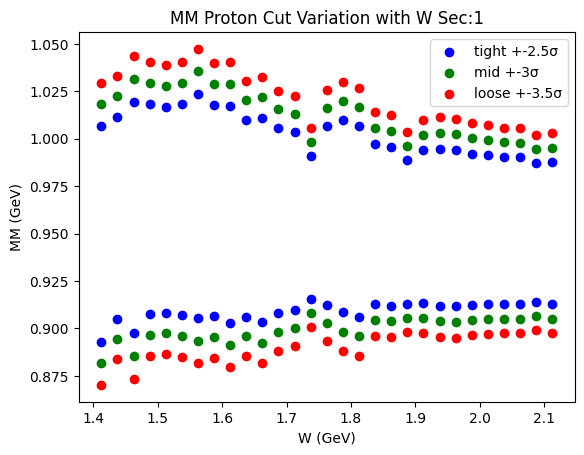

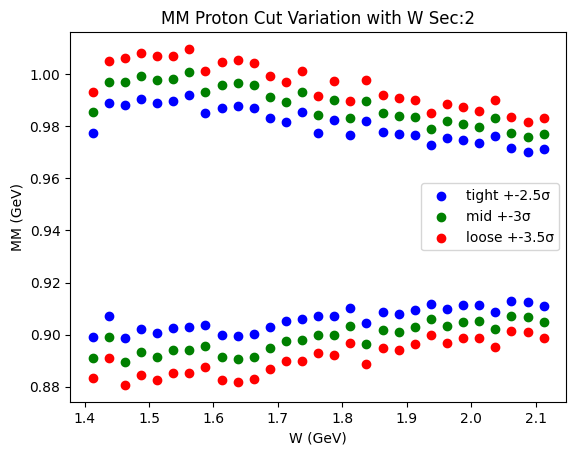

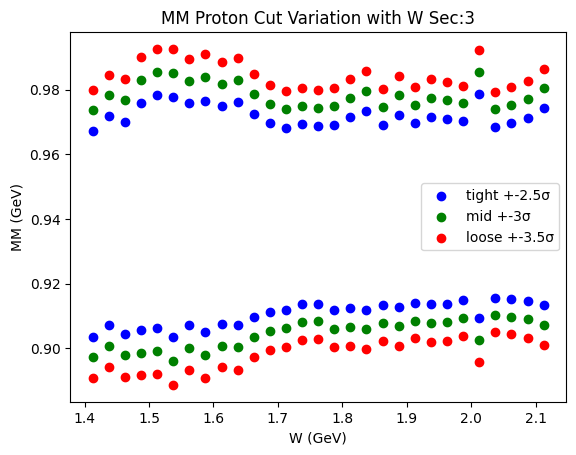

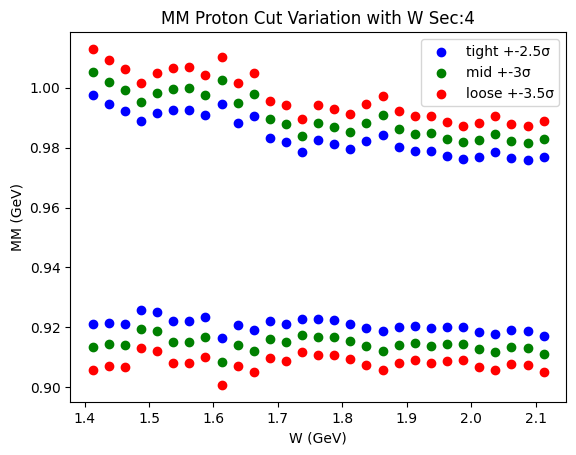

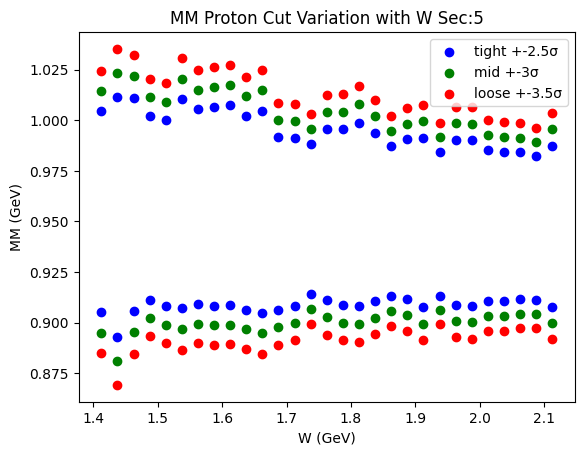

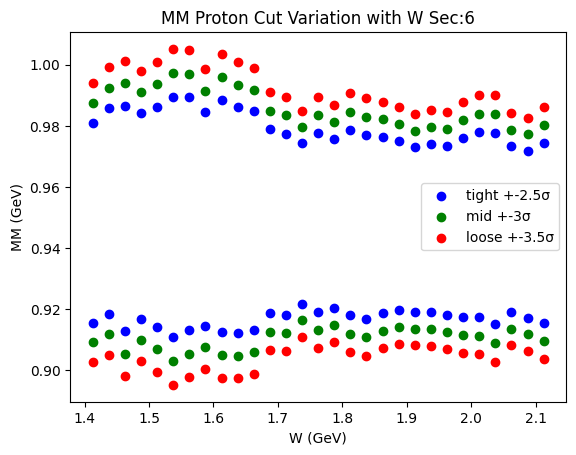

In [26]:
for sec in range(6):
    y_tight_w1 = Remove_Zeros_Y([sign(cut_bounds[sec][Wbin][0][0])*math.sqrt(sign(cut_bounds[sec][Wbin][0][0])*cut_bounds[sec][Wbin][0][0]) for Wbin in range(_W_bins_)])
    y_tight_w2 = Remove_Zeros_Y([math.sqrt(cut_bounds[sec][Wbin][1][0]) for Wbin in range(_W_bins_)])
    y_mid_w1 = Remove_Zeros_Y([sign(cut_bounds[sec][Wbin][0][1])*math.sqrt(sign(cut_bounds[sec][Wbin][0][1])*cut_bounds[sec][Wbin][0][1]) for Wbin in range(_W_bins_)])
    y_mid_w2 = Remove_Zeros_Y([math.sqrt(cut_bounds[sec][Wbin][1][1]) for Wbin in range(_W_bins_)])
    y_loose_w1 = Remove_Zeros_Y([math.sqrt(sign(cut_bounds[sec][Wbin][0][2])*cut_bounds[sec][Wbin][0][2]) for Wbin in range(_W_bins_)])
    y_loose_w2 = Remove_Zeros_Y([sign(cut_bounds[sec][Wbin][0][2])*math.sqrt(cut_bounds[sec][Wbin][1][2]) for Wbin in range(_W_bins_)])
    #x_tight = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)])
    x = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)])
    #x_loose = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][2] for Wbin in range(_W_bins_)])
    plt.scatter(x,y_tight_w1,color='b',label="tight +-{}\u03C3".format(tight))
    plt.scatter(x,y_tight_w2,color='b',)
    plt.scatter(x,y_mid_w1,color='g',label="mid +-{}\u03C3".format(mid))
    plt.scatter(x,y_mid_w2,color='g')
    plt.scatter(x,y_loose_w1,color='r',label="loose +-{}\u03C3".format(loose))
    plt.scatter(x,y_loose_w2,color='r')
#     plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][0][0]),_W_min_,_W_max_,color='b',label="W range tight +-{}\u03C3".format(tight))
#     plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][1][0]),_W_min_,_W_max_,color='b')
#     plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][0][1]),_W_min_,_W_max_,color='g',label="W range mid +-{}\u03C3".format(mid))
#     plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][1][1]),_W_min_,_W_max_,color='g')
#     plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][0][2]),_W_min_,_W_max_,color='r',label="W range loose +-{}\u03C3".format(loose))
#     plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][1][2]),_W_min_,_W_max_,color='r')
    plt.legend()
    plt.title("MM {} Cut Variation with W Sec:{}".format(Particle,sec+1))
    plt.xlabel("W (GeV)")
    plt.ylabel("MM (GeV)")
    plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

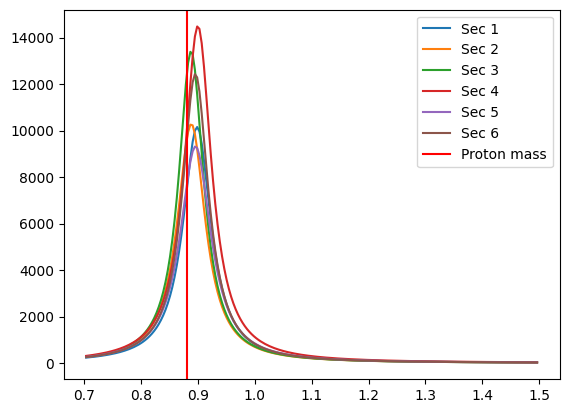

In [21]:
Wbin = _W_bins_
m_par = 0.938272088
for sec in range(6):
    plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_pars[sec][Wbin]),label="Sec {}".format(sec+1))
plt.axvline(x=m_par*m_par,label="{} mass".format(Particle),color='r')
plt.legend()
plt.show

In [22]:
print("MM^2 "+Particle+" Cut Bounds [sec][low/high][tight/mid/loose][slope,intercept]")
for sec in range(6):
    for side in range(2):
        for t in range(3):
            for p in range(2):
                if p ==0:
                    if t == 0:
                        if side ==0:
                            if sec==0:
                                print("{\t{\t{\t{",lin_fit[sec][side][t][p],end=",")
                            else:
                                print("\t{\t{\t{",lin_fit[sec][side][t][p],end=",")
                        else:
                            print("\t\t{\t{",lin_fit[sec][side][t][p],end=",")
                    else:
                        print("{",lin_fit[sec][side][t][p],end=",")
                elif p==1:
                    if t == 2:
                        if side == 1:
                            if sec == 5:
                                print(lin_fit[sec][side][t][p],"}}}}")
                            else:
                                print(lin_fit[sec][side][t][p],"}}},")
                        else: 
                            print(lin_fit[sec][side][t][p],"}},")
                    else:
                        print(lin_fit[sec][side][t][p],end="},")
                else: 
                     print(lin_fit[sec][side][t][p],end=",")


MM^2 Proton Cut Bounds [sec][low/high][tight/mid/loose][slope,intercept]
{	{	{	{ 0.025010889596937518,0.7830088965866384},{ 0.03637213272221122,0.7459646851493734},{ 0.04750897991749807,0.7094938763367044 }},
		{	{ -0.10082727518811416,1.184762723461656},{ -0.11464727884496871,1.2280872666135922},{ -0.12868810202422648,1.2719792982530396 }}},
	{	{	{ 0.039653394297373905,0.7512119330779644},{ 0.04906003398973806,0.7210507309945506},{ 0.058310495893459234,0.6912784288037297 }},
		{	{ -0.06280888160818611,1.0738444924557171},{ -0.07390848027855305,1.1082372358271484},{ -0.08516144986489059,1.14301346265716 }}},
	{	{	{ 0.03276975536785858,0.7717743587942192},{ 0.035553479508404935,0.7557891955808854},{ 0.03829298972083463,0.739955163411675 }},
		{	{ 0.002725816387026212,0.9395649288526225},{ -0.0004900019689320079,0.9571270530762999},{ -0.0037511153339291853,0.9748415278382642 }}},
	{	{	{ -0.016998280971869905,0.8783604840991919},{ -0.013544975220212752,0.860620702762331},{ -0.010135807282

In [23]:
# print("MM^2 "+Particle+" Cut Bounds [sec][low/high][tight/mid/loose]")
# for sec in range(6):
#     for side in range(2):
#         for t in range(3):
#             if t == 0:
#                 if side ==0:
#                     if sec==0:
#                         print("{\t{\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#                     else:
#                         print("\t{\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#                 else:
#                     print("\t\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#             elif t == 2:
#                 if side == 1:
#                     if sec == 5:
#                         print(cut_bounds[sec][_W_bins_][side][t],"}}}")
#                     else:
#                         print(cut_bounds[sec][_W_bins_][side][t],"}},")
#                 else: 
#                     print(cut_bounds[sec][_W_bins_][side][t],"},")
#             else: 
#                 print(cut_bounds[sec][_W_bins_][side][t],end=",")



In [24]:
# print("MM^2 "+Particle+" Linear Cut Bounds [sec][low/high][tight/mid/loose]")
# for sec in range(6):
#     for side in range(2):
#         for t in range(3):
#             if t == 0:
#                 if side ==0:
#                     if sec==0:
#                         print("{\t{\t{","\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}",end=",")
#                     else:
#                         print("\t{\t{","\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}",end=",")
#                 else:
#                     print("\t{","\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}",end=",")
#             elif t == 2:
#                 if side == 1:
#                     if sec == 5:
#                         print("\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}","}}}")
#                     else:
#                         print("\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}","}},")
#                 else: 
#                     print("\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}","},")
#             else: 
#                 print("\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}",end=",")